# Final Project : Time-series supervised models

### The objective is to create Machine Learning models to predict the next month revenue of a company in order to reduce the time managers currently spend to calculate it. For example, if your provide the date April 15 to the model as an input, it is supposed to return the predicted revenue from April 15 to May 15 (next month) 

### Three strategies will be used to achieve this objective, that are:
<ol>
    <li>The month number and day number are independent variables and the other characteristics collected and calculated, including the next month revenue, are dependent variables</li>
    <li>The day of the year number (366 days) are independent variables and the other characteristics collected and calculated, including the next month revenue, are dependent variables</li>
    <li>The day of the year number (366 days) and the other characteristics collected are independent variables and only the next month revenue is dependent variables</li>
</ol>

## 1-Extract Tranform Load the dataset

In [1]:
#Import the required local files
import functions
from functions import cslib, etl, viz, model  

In [2]:
#Import the required libraries
import pandas as pd
import numpy as np
import os

In [3]:
#Load the dataset and save it into a pandas dataframe
#Fetch data and validate data format
print ("\nFETCH DATA")
#data_directory = "data/cs_train/"
data_directory = os.path.join("data","cs_train")
df1 = cslib.fetch_data(data_directory)

#Check teh shape of the dataset to confirm it was loaded or not
etl.get_df_shape(df1) 


FETCH DATA
SHAPE OF THE DATA: 
Number of rows: 815011
Number of columns: 10


In [4]:
#Observe data
print ("\nOBSERVE DATA")
etl.get_data_info(df1)


OBSERVE DATA

FIRST 10 ROWS OF THE DATA
          country  customer_id  day invoice  month  price stream_id  \
0  United Kingdom      13085.0   28  489434     11   6.95     85048   
1  United Kingdom      13085.0   28  489434     11   6.75    79323W   
2  United Kingdom      13085.0   28  489434     11   2.10     22041   
3  United Kingdom      13085.0   28  489434     11   1.25     21232   
4  United Kingdom      13085.0   28  489434     11   1.65     22064   
5  United Kingdom      13085.0   28  489434     11   1.25     21871   
6  United Kingdom      13085.0   28  489434     11   5.95     21523   
7  United Kingdom      13085.0   28  489435     11   2.55     22350   
8  United Kingdom      13085.0   28  489435     11   3.75     22349   
9  United Kingdom      13085.0   28  489435     11   1.65     22195   

   times_viewed  year invoice_date  
0            12  2017   2017-11-28  
1            12  2017   2017-11-28  
2            21  2017   2017-11-28  
3             5  2017   2017-

In [5]:
def delete_duplicate_rows(df_source):
    #Delete duplicated rows
    df_target=df_source.drop_duplicates()
    #Calculate the number of rows deleted
    nbr_rows = df_source.shape[0] - df_target.shape[0]
    print (nbr_rows, "duplicate were removed")
    #Check teh shape of the dataset to confirm it was loaded or not
    print('PREVIOUS')
    etl.get_df_shape(df_source)
    print('CURRENT')
    etl.get_df_shape(df_target)
    #Return output
    return df_target

df2=delete_duplicate_rows(df1)

28844 duplicate were removed
PREVIOUS
SHAPE OF THE DATA: 
Number of rows: 815011
Number of columns: 10
CURRENT
SHAPE OF THE DATA: 
Number of rows: 786167
Number of columns: 10


In [6]:
#Observe data
print ("\nOBSERVE DATA")
etl.get_data_info(df2)


OBSERVE DATA

FIRST 10 ROWS OF THE DATA
          country  customer_id  day invoice  month  price stream_id  \
0  United Kingdom      13085.0   28  489434     11   6.95     85048   
1  United Kingdom      13085.0   28  489434     11   6.75    79323W   
2  United Kingdom      13085.0   28  489434     11   2.10     22041   
3  United Kingdom      13085.0   28  489434     11   1.25     21232   
4  United Kingdom      13085.0   28  489434     11   1.65     22064   
5  United Kingdom      13085.0   28  489434     11   1.25     21871   
6  United Kingdom      13085.0   28  489434     11   5.95     21523   
7  United Kingdom      13085.0   28  489435     11   2.55     22350   
8  United Kingdom      13085.0   28  489435     11   3.75     22349   
9  United Kingdom      13085.0   28  489435     11   1.65     22195   

   times_viewed  year invoice_date  
0            12  2017   2017-11-28  
1            12  2017   2017-11-28  
2            21  2017   2017-11-28  
3             5  2017   2017-

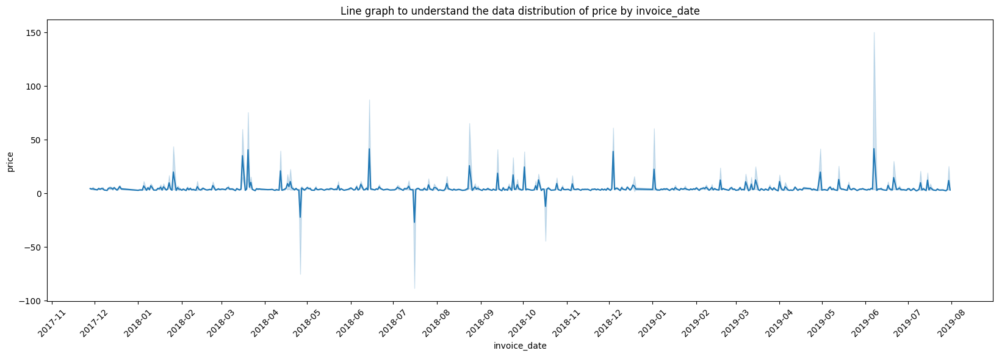

In [7]:
#Display a line graph of daily revenue
viz.show_lineGraph(df2, 'invoice_date', 'price')

In [8]:
#Show the countries by their number of transactions from the highest to the lowest (ascending) 
df_count_country=df2[['invoice_date', 'country']].groupby(['country']).count()
df_count_country=df_count_country.rename(columns={"invoice_date": "number_of_transactions"})
df_count_country=df_count_country.reset_index()
df_count_country=df_count_country.sort_values(by='number_of_transactions', ascending=False)
df_count_country['Weighting %']=(df_count_country['number_of_transactions']/df_count_country['number_of_transactions'].sum()) * 100
df_count_country=df_count_country.reset_index(drop=True)
df_count_country

,country,number_of_transactions,Weighting %
0,United Kingdom,723324,92.006406
1,EIRE,13432,1.708543
2,Germany,13123,1.669238
3,France,9669,1.229891
4,Netherlands,4022,0.511596
5,Spain,2557,0.325249
6,Switzerland,2320,0.295103
7,Belgium,2159,0.274624
8,Portugal,1734,0.220564
9,Australia,1525,0.193979


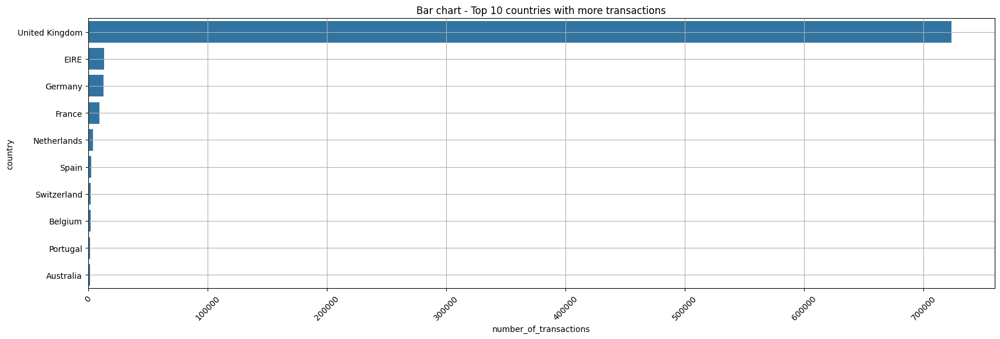

In [9]:
#Plot top 10 contries
df_count_country=df_count_country.iloc[0: 10]   
viz.show_barChart2(df_count_country)


DISPLAY CORRELATION BETWEEN CONTINUOUS COLUMN VALUES

The following columns do not contain numerical data and then were removed:
#1 : country
#2 : invoice
#3 : stream_id
#4 : invoice_date


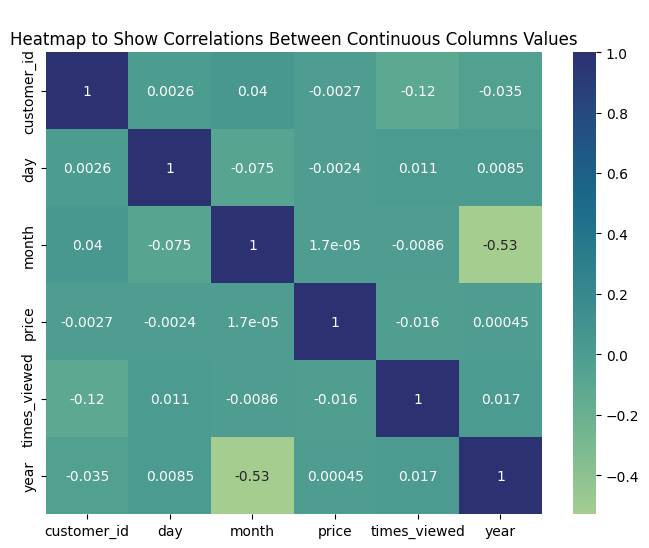

In [10]:
#Display correlation
print ("\nDISPLAY CORRELATION BETWEEN CONTINUOUS COLUMN VALUES\n")
viz.show_heatmap(df2)

In [11]:
#Convert data to time series data and save them in csv files
ts_files_dir = "C:/Users/LSP/Documents/AI WorkFlow Capstone/data/ts_data"
#cslib.main(dt_dir, ts_df_dir)
cslib.fetch_ts(df2, ts_files_dir, clean=False)

... loading ts data from files


{'all':            date  purchases  unique_invoices  unique_streams  total_views  \
 0    2017-11-01          0                0               0            0   
 1    2017-11-02          0                0               0            0   
 2    2017-11-03          0                0               0            0   
 3    2017-11-04          0                0               0            0   
 4    2017-11-05          0                0               0            0   
 ..          ...        ...              ...             ...          ...   
 602  2019-06-26       1357               67             999         6419   
 603  2019-06-27       1613               80             944         9425   
 604  2019-06-28       1011               70             607         5518   
 605  2019-06-29          0                0               0            0   
 606  2019-06-30        581               27             423         2508   
 
      revenue  
 0       0.00  
 1       0.00  
 2       0.00  
 3 

In [12]:
#Display the path, including names, of the files created
import re
file_list = [os.path.join(ts_files_dir,f) for f in os.listdir(ts_files_dir) if re.search(r"\.csv",f)]
file_list

['C:/Users/LSP/Documents/AI WorkFlow Capstone/data/ts_data\\ts-all.csv',
 'C:/Users/LSP/Documents/AI WorkFlow Capstone/data/ts_data\\ts-eire.csv',
 'C:/Users/LSP/Documents/AI WorkFlow Capstone/data/ts_data\\ts-france.csv',
 'C:/Users/LSP/Documents/AI WorkFlow Capstone/data/ts_data\\ts-germany.csv',
 'C:/Users/LSP/Documents/AI WorkFlow Capstone/data/ts_data\\ts-hong_kong.csv',
 'C:/Users/LSP/Documents/AI WorkFlow Capstone/data/ts_data\\ts-netherlands.csv',
 'C:/Users/LSP/Documents/AI WorkFlow Capstone/data/ts_data\\ts-norway.csv',
 'C:/Users/LSP/Documents/AI WorkFlow Capstone/data/ts_data\\ts-portugal.csv',
 'C:/Users/LSP/Documents/AI WorkFlow Capstone/data/ts_data\\ts-singapore.csv',
 'C:/Users/LSP/Documents/AI WorkFlow Capstone/data/ts_data\\ts-spain.csv',
 'C:/Users/LSP/Documents/AI WorkFlow Capstone/data/ts_data\\ts-united_kingdom.csv']

In [13]:
#Create a dataframe with each time serie dataset 
list_ts_df = ['df_ts_all','df_ts_eire','df_ts_france','df_ts_germany','df_ts_hong_kong','df_ts_netherlands','df_ts_norway','df_ts_portugal','df_ts_singapore','df_ts_spain','df_ts_united_kingdom']
library_ts_df = {}

if len(file_list)==len(list_ts_df):
    size = len(file_list)
    for i in range (0,size):
        df_name = list_ts_df[i]
        library_ts_df[df_name] = pd.read_csv(file_list[i])
        #Check whether the dataset was loaded or not
        print(i+1, '- Dataframe', df_name , 'was created successfully!')
        etl.get_df_shape(library_ts_df[df_name]) 
        print('\n')

1 - Dataframe df_ts_all was created successfully!
SHAPE OF THE DATA: 
Number of rows: 607
Number of columns: 6


2 - Dataframe df_ts_eire was created successfully!
SHAPE OF THE DATA: 
Number of rows: 607
Number of columns: 6


3 - Dataframe df_ts_france was created successfully!
SHAPE OF THE DATA: 
Number of rows: 607
Number of columns: 6


4 - Dataframe df_ts_germany was created successfully!
SHAPE OF THE DATA: 
Number of rows: 607
Number of columns: 6


5 - Dataframe df_ts_hong_kong was created successfully!
SHAPE OF THE DATA: 
Number of rows: 426
Number of columns: 6


6 - Dataframe df_ts_netherlands was created successfully!
SHAPE OF THE DATA: 
Number of rows: 607
Number of columns: 6


7 - Dataframe df_ts_norway was created successfully!
SHAPE OF THE DATA: 
Number of rows: 577
Number of columns: 6


8 - Dataframe df_ts_portugal was created successfully!
SHAPE OF THE DATA: 
Number of rows: 607
Number of columns: 6


9 - Dataframe df_ts_singapore was created successfully!
SHAPE OF T

In [14]:
#Observe data in the time serie datasets
print ("\nOBSERVE DATA")
for i in range (0,size):
    df_name = list_ts_df[i]
    print(i+1, '- Dataframe', df_name , 'data:')
    etl.get_data_info(library_ts_df[df_name]) 
    print('\n')


OBSERVE DATA
1 - Dataframe df_ts_all data:

FIRST 10 ROWS OF THE DATA
         date  purchases  unique_invoices  unique_streams  total_views  \
0  2017-11-01          0                0               0            0   
1  2017-11-02          0                0               0            0   
2  2017-11-03          0                0               0            0   
3  2017-11-04          0                0               0            0   
4  2017-11-05          0                0               0            0   
5  2017-11-06          0                0               0            0   
6  2017-11-07          0                0               0            0   
7  2017-11-08          0                0               0            0   
8  2017-11-09          0                0               0            0   
9  2017-11-10          0                0               0            0   

   revenue  
0      0.0  
1      0.0  
2      0.0  
3      0.0  
4      0.0  
5      0.0  
6      0.0  
7      0.0

In [15]:
#Convert data to the correct datatype
for i in range (0,size):
    df_name = list_ts_df[i]
    (library_ts_df[df_name])['date'] = pd.to_datetime((library_ts_df[df_name])['date'])
    (library_ts_df[df_name])['purchases'] = (library_ts_df[df_name])['purchases'].astype(float)
    (library_ts_df[df_name])['unique_invoices'] = (library_ts_df[df_name])['unique_invoices'].astype(float)
    (library_ts_df[df_name])['unique_streams'] = (library_ts_df[df_name])['unique_streams'].astype(float)
    (library_ts_df[df_name])['total_views'] = (library_ts_df[df_name])['total_views'].astype(float)

#Check dtypes
for i in range (0,size):
    df_name = list_ts_df[i]
    print((library_ts_df[df_name]).dtypes)

date               datetime64[ns]
purchases                 float64
unique_invoices           float64
unique_streams            float64
total_views               float64
revenue                   float64
dtype: object
date               datetime64[ns]
purchases                 float64
unique_invoices           float64
unique_streams            float64
total_views               float64
revenue                   float64
dtype: object
date               datetime64[ns]
purchases                 float64
unique_invoices           float64
unique_streams            float64
total_views               float64
revenue                   float64
dtype: object
date               datetime64[ns]
purchases                 float64
unique_invoices           float64
unique_streams            float64
total_views               float64
revenue                   float64
dtype: object
date               datetime64[ns]
purchases                 float64
unique_invoices           float64
unique_streams            

1 - Dataframe df_ts_all data:


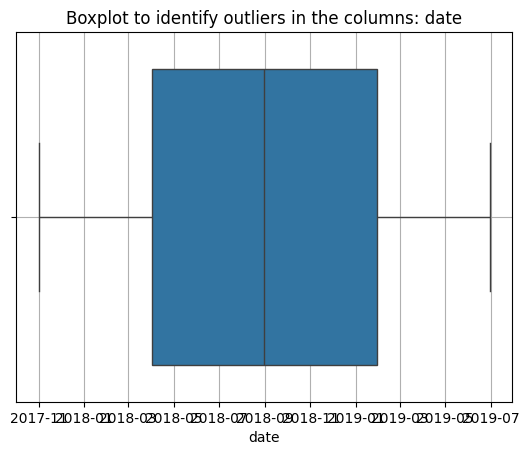

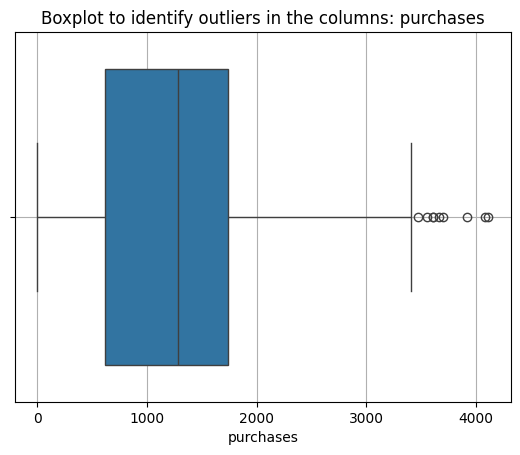

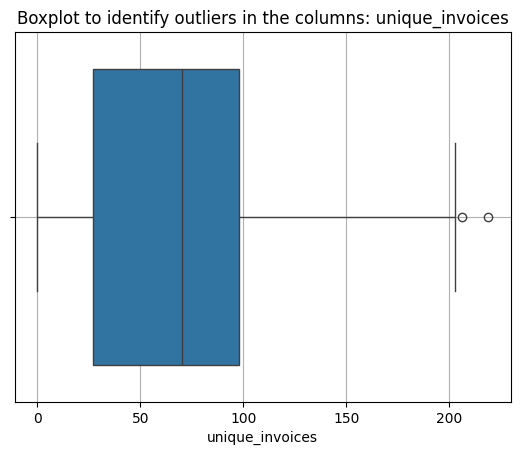

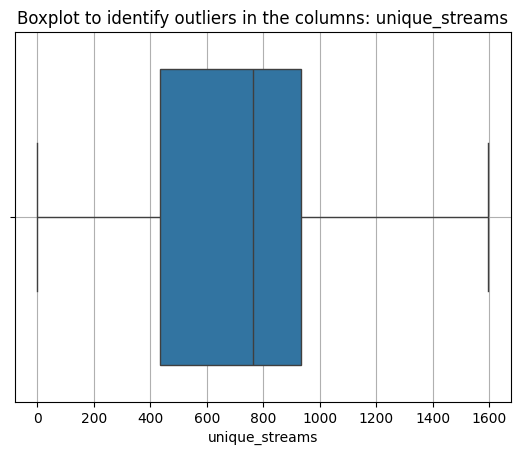

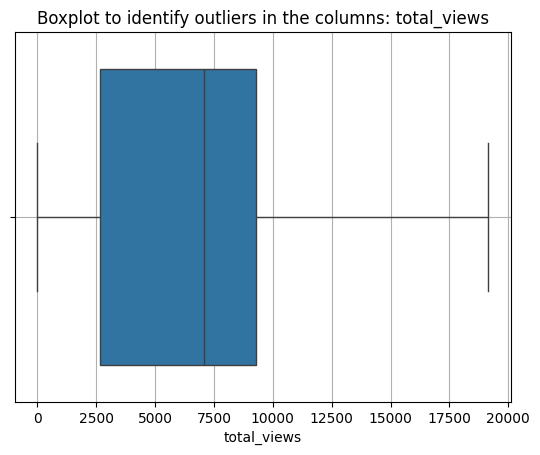

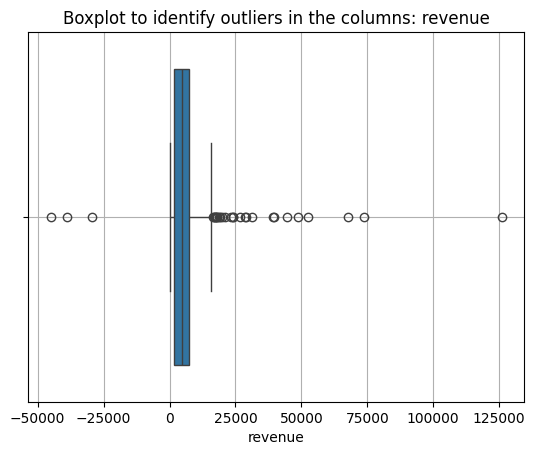



2 - Dataframe df_ts_eire data:


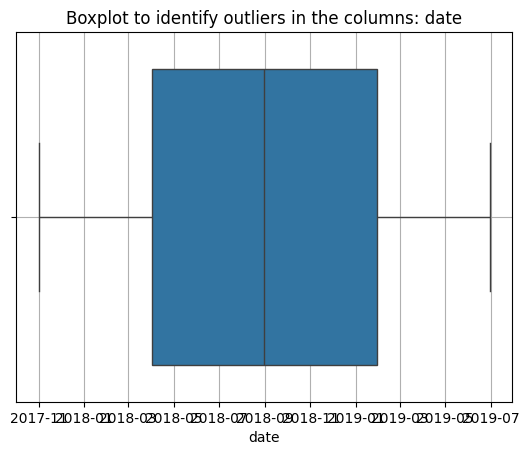

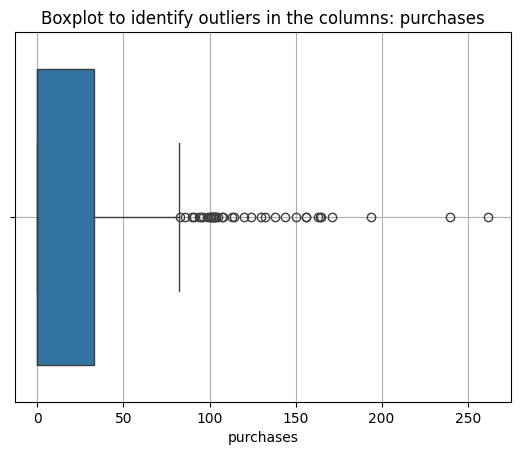

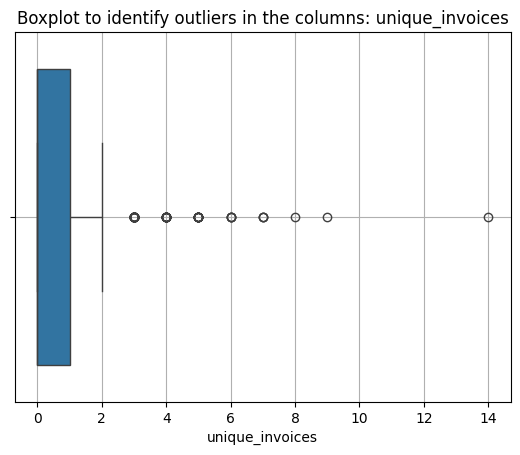

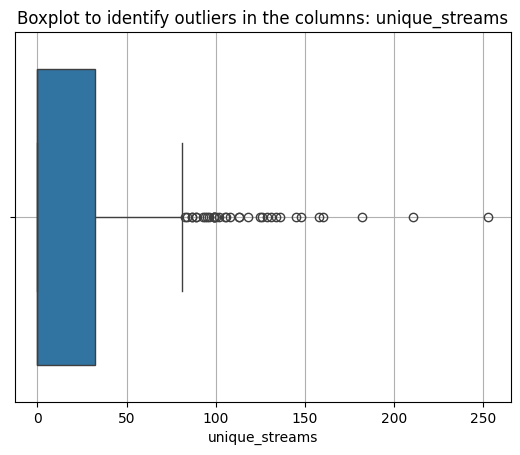

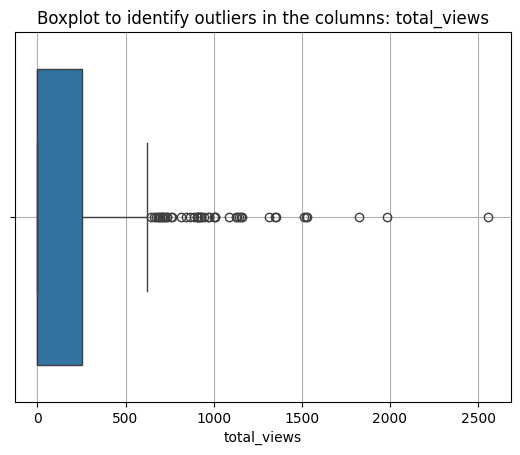

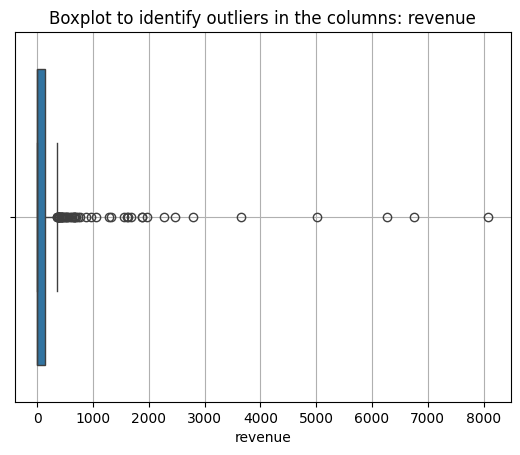



3 - Dataframe df_ts_france data:


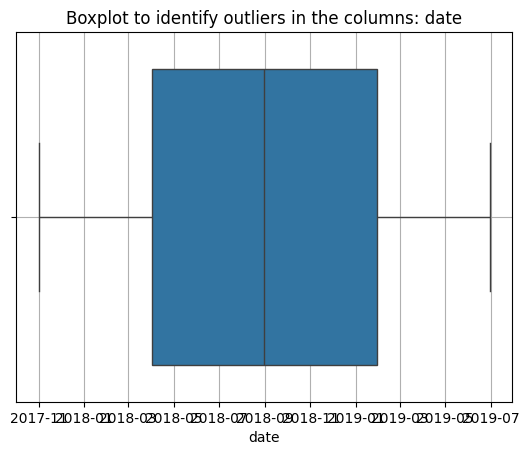

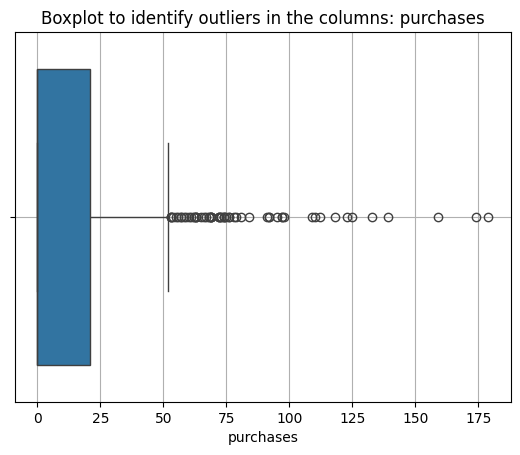

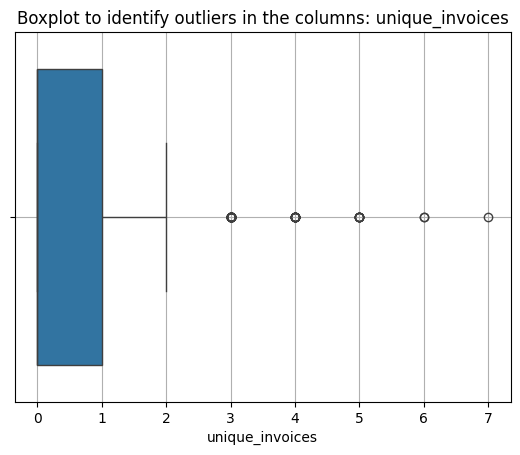

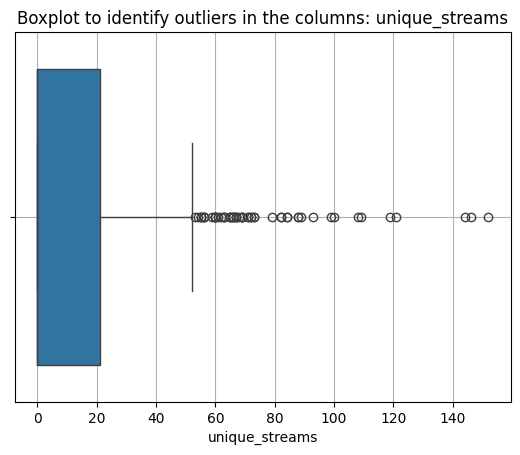

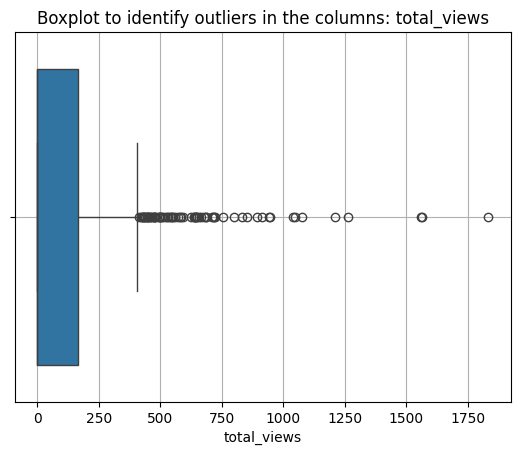

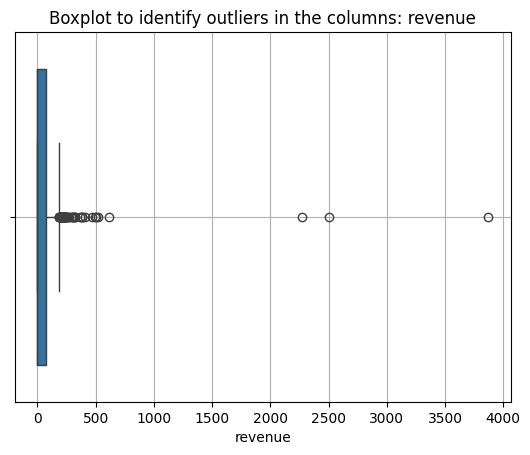



4 - Dataframe df_ts_germany data:


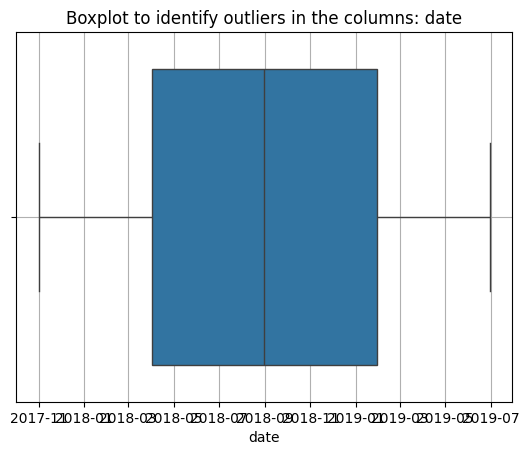

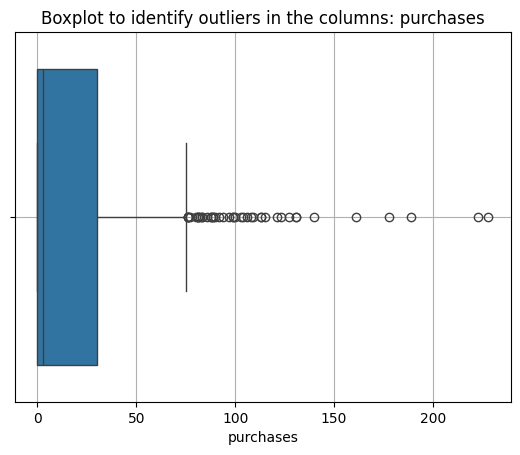

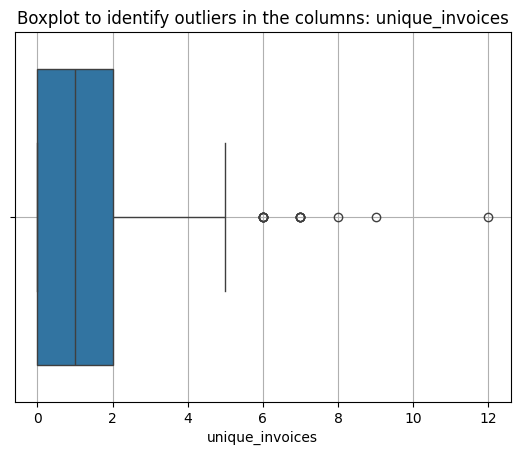

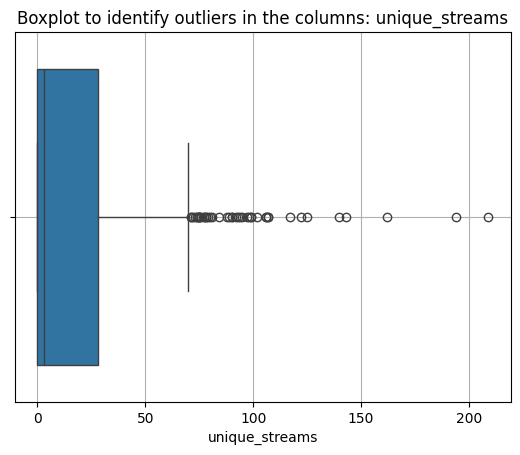

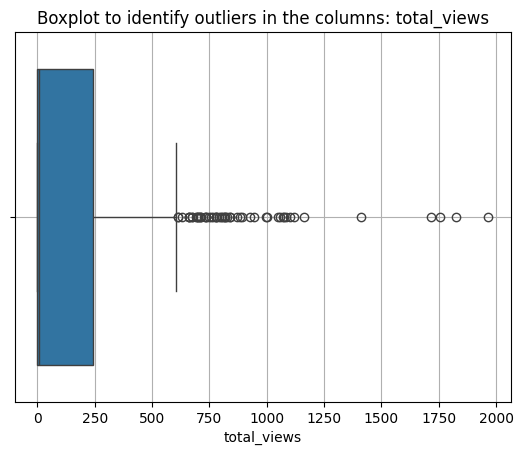

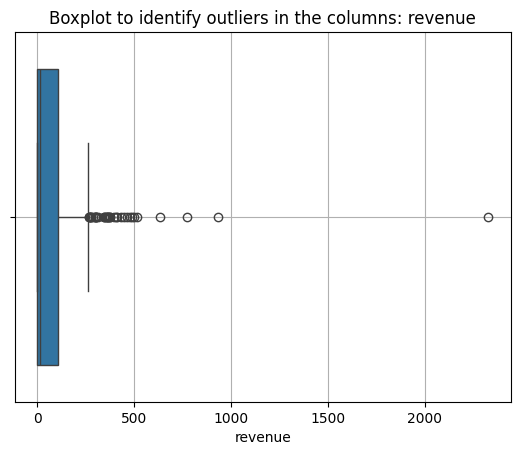



5 - Dataframe df_ts_hong_kong data:


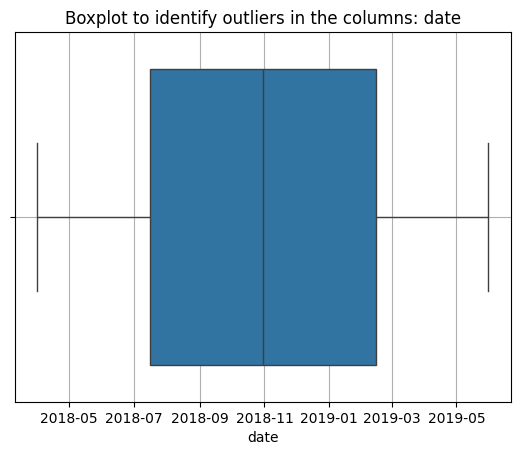

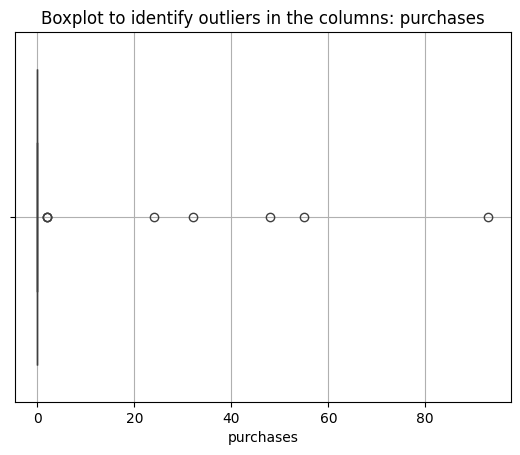

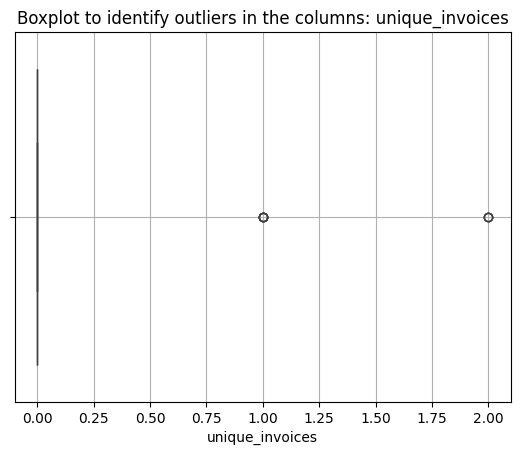

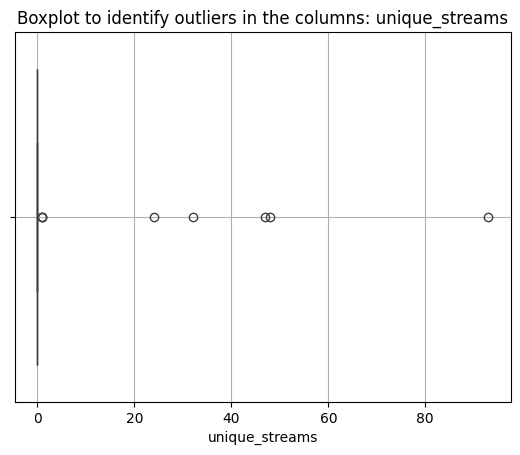

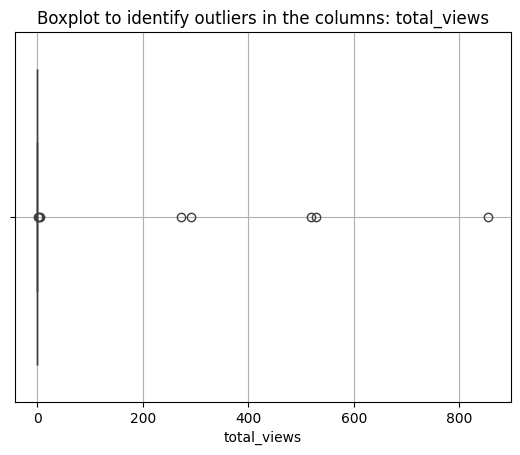

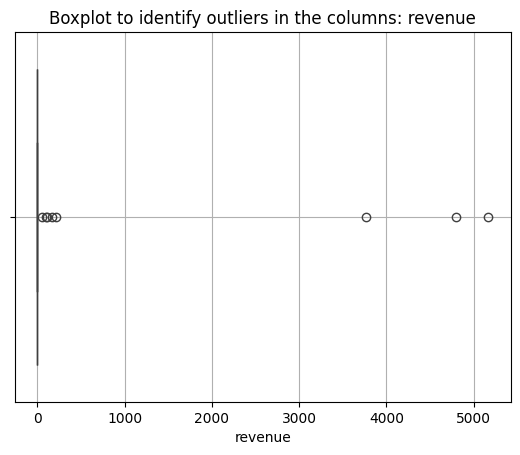



6 - Dataframe df_ts_netherlands data:


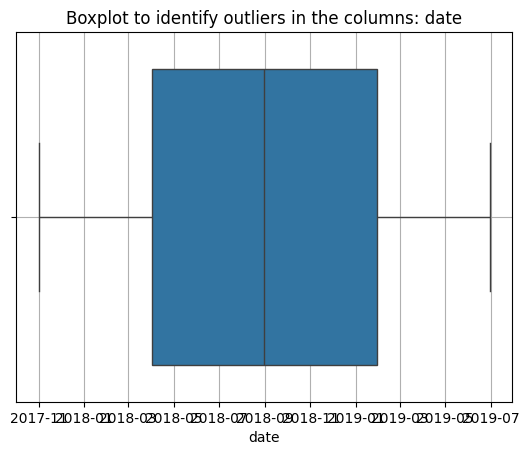

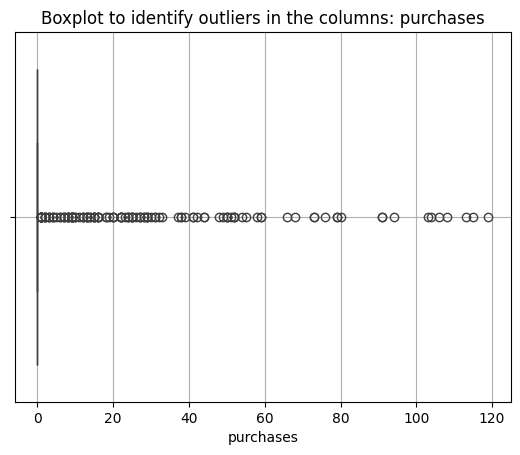

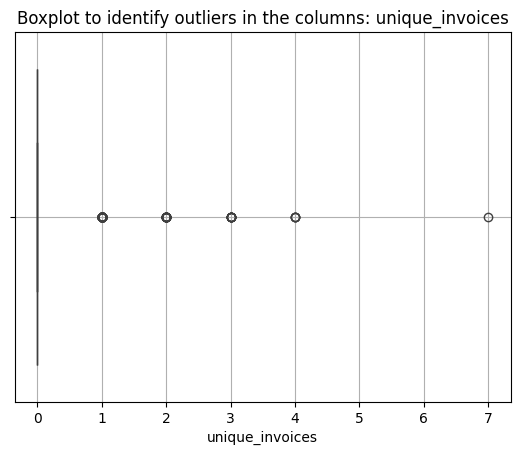

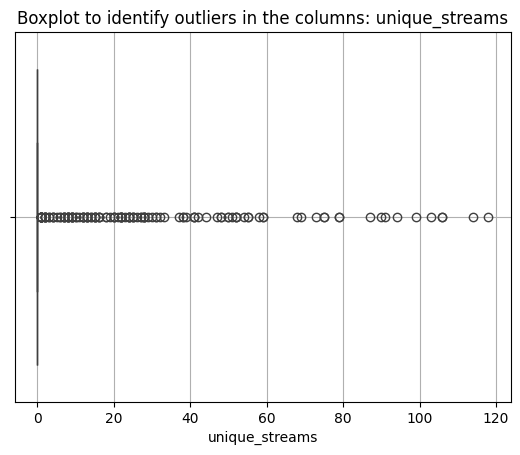

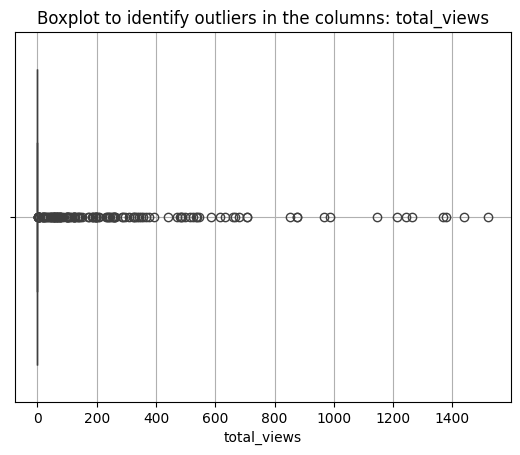

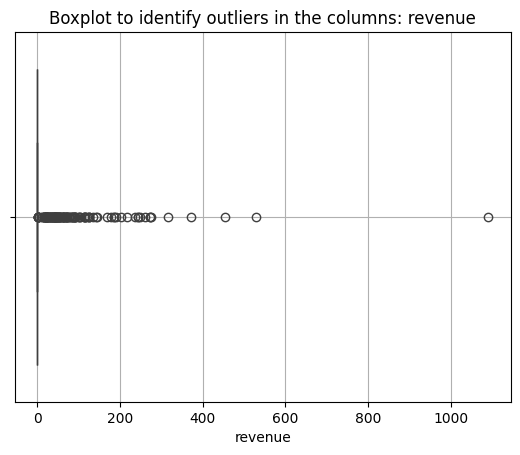



7 - Dataframe df_ts_norway data:


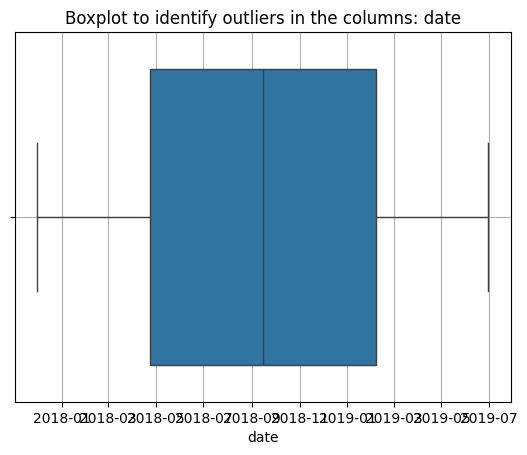

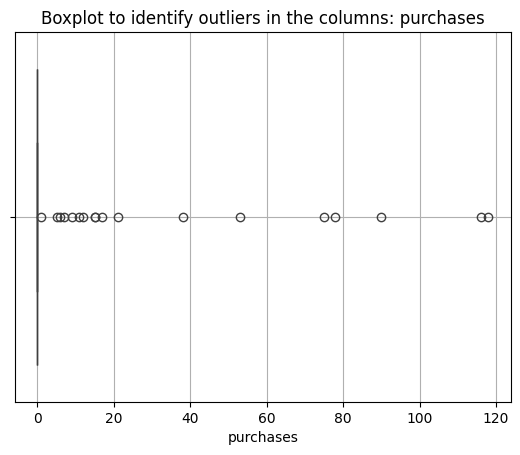

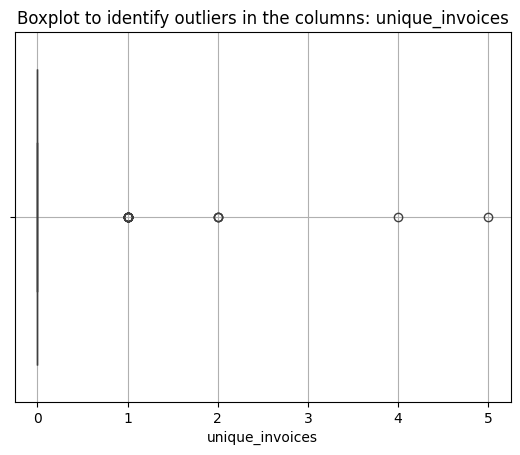

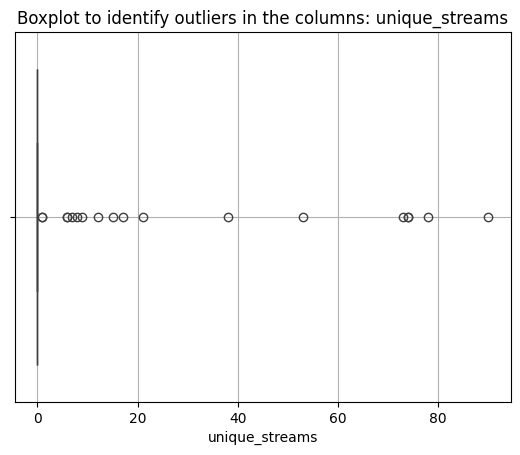

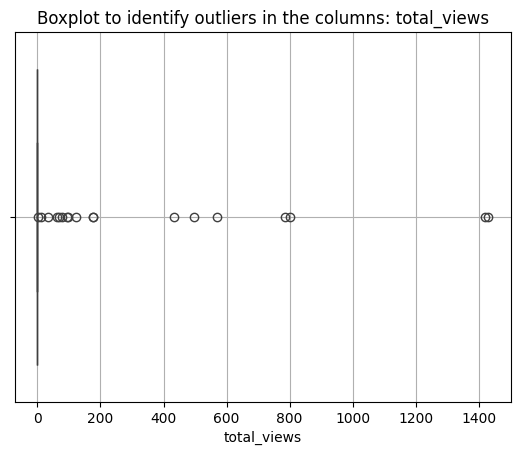

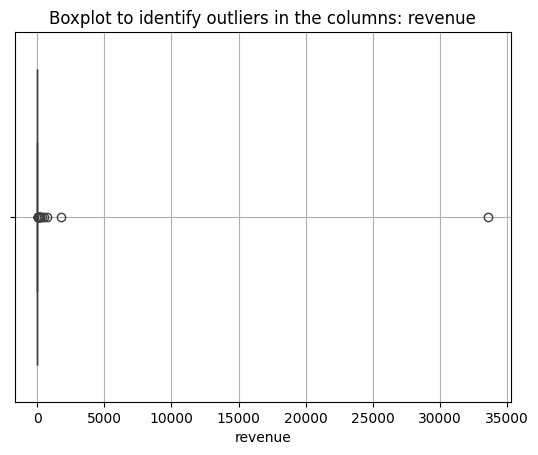



8 - Dataframe df_ts_portugal data:


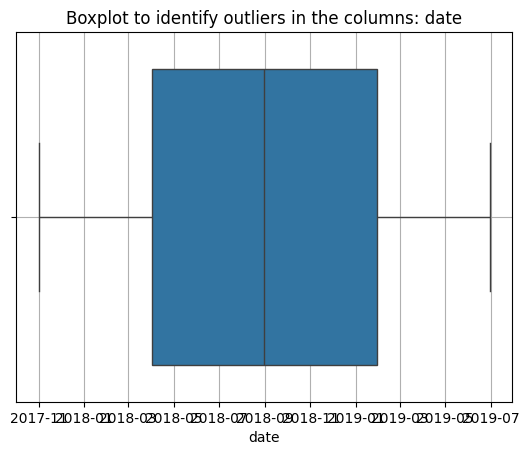

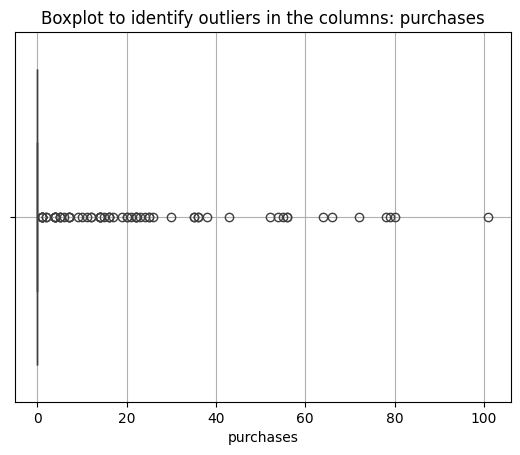

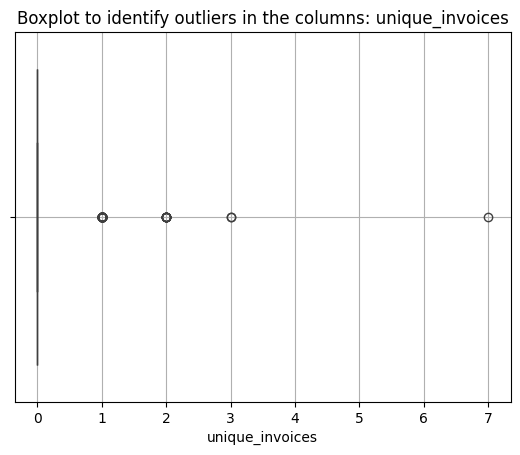

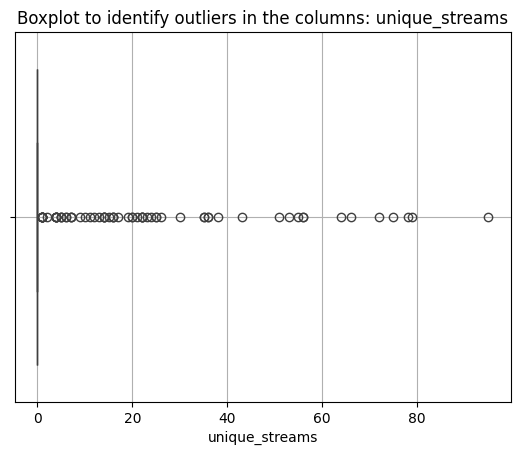

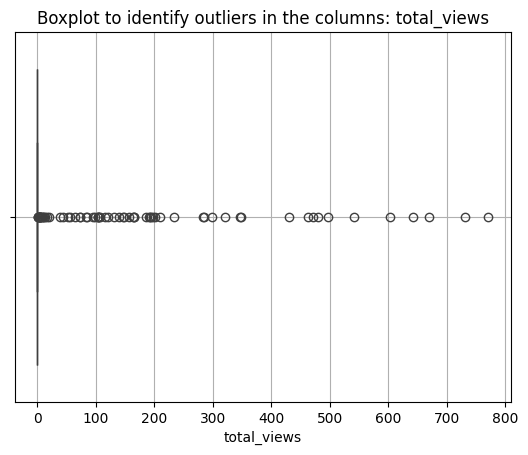

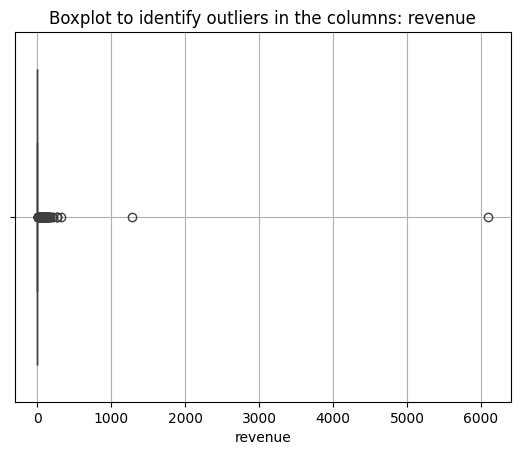



9 - Dataframe df_ts_singapore data:


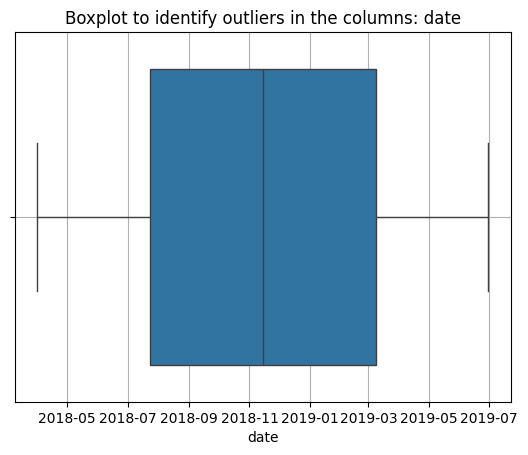

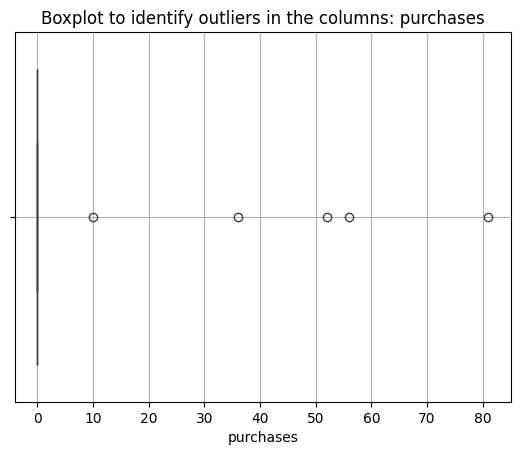

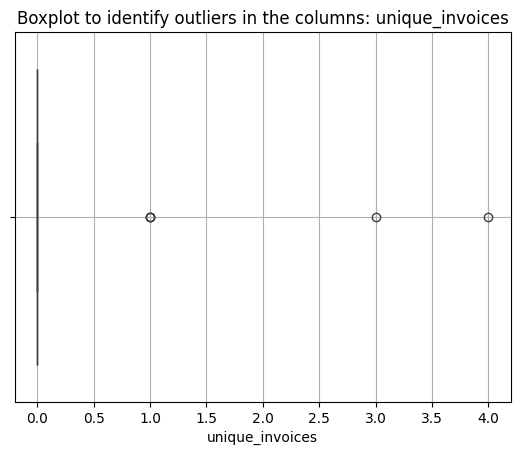

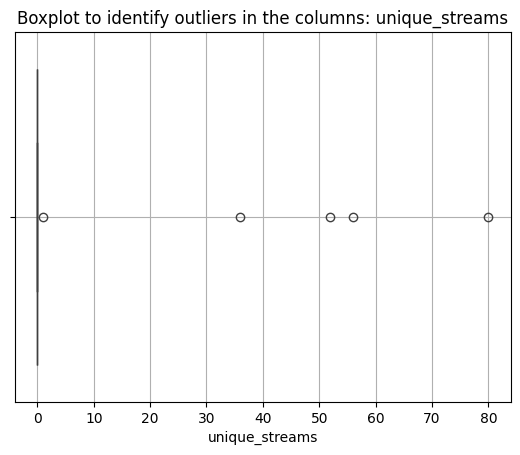

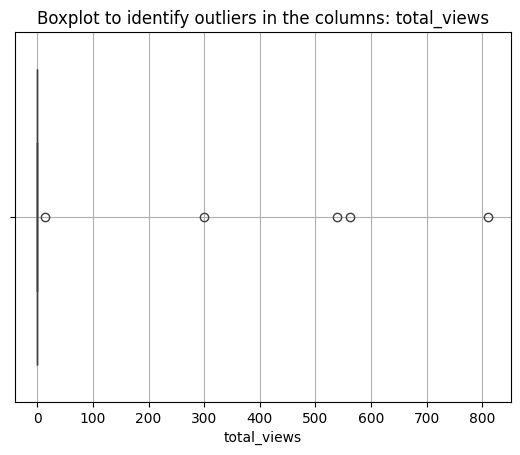

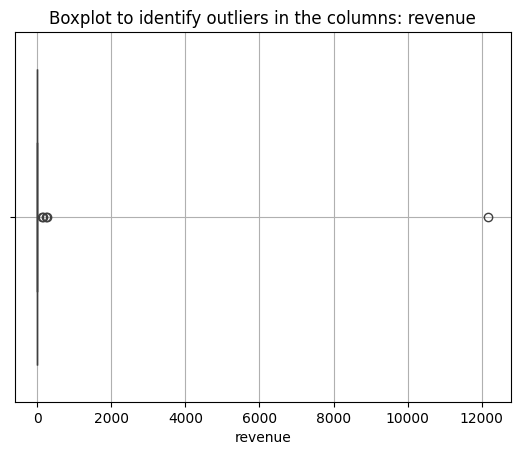



10 - Dataframe df_ts_spain data:


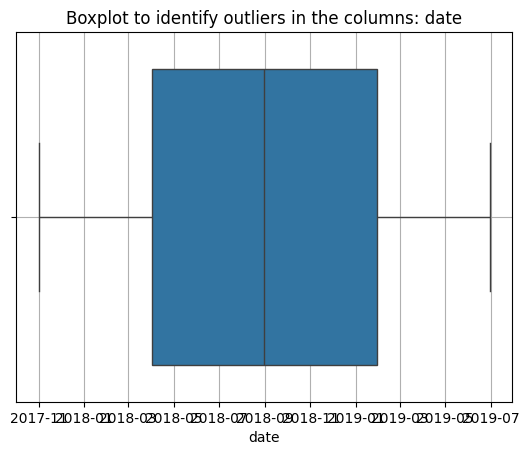

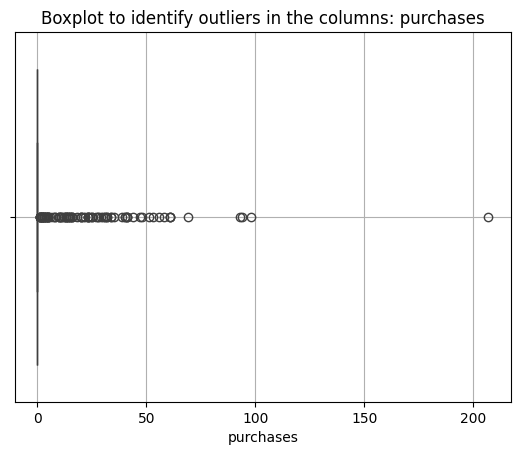

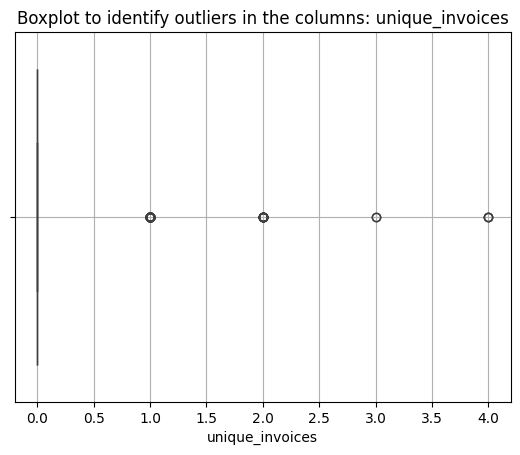

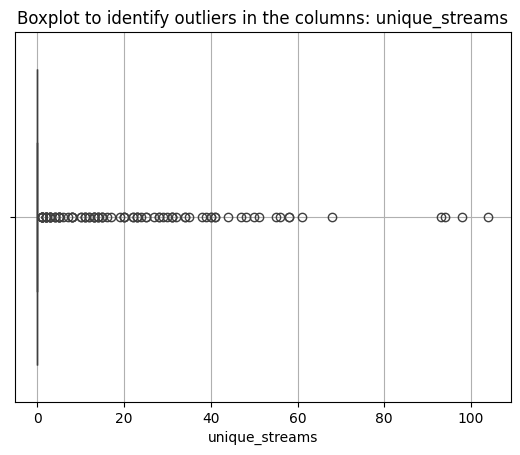

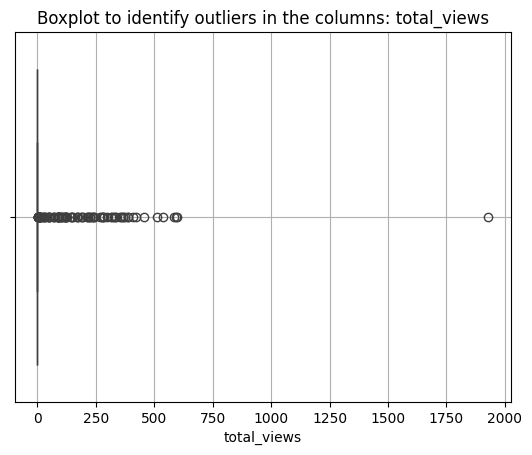

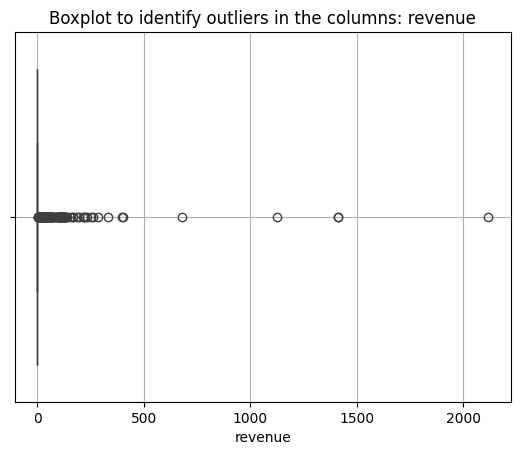



11 - Dataframe df_ts_united_kingdom data:


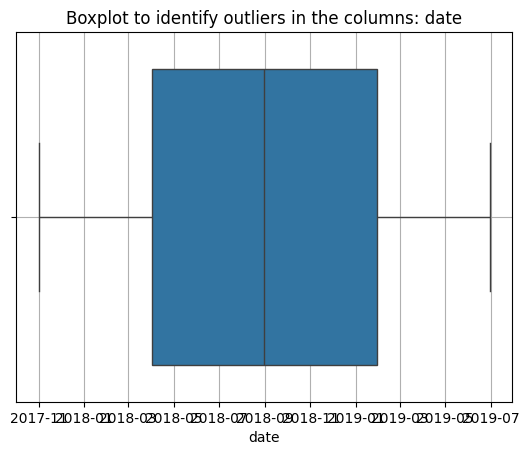

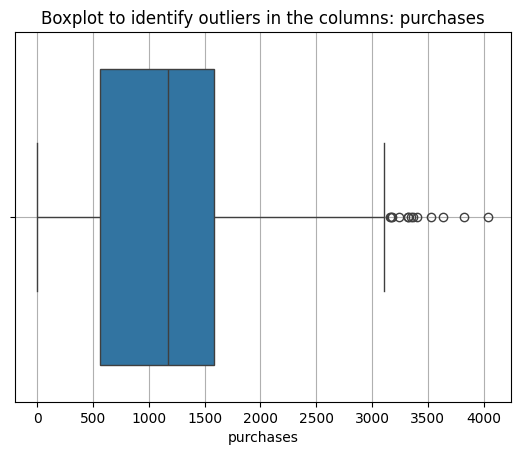

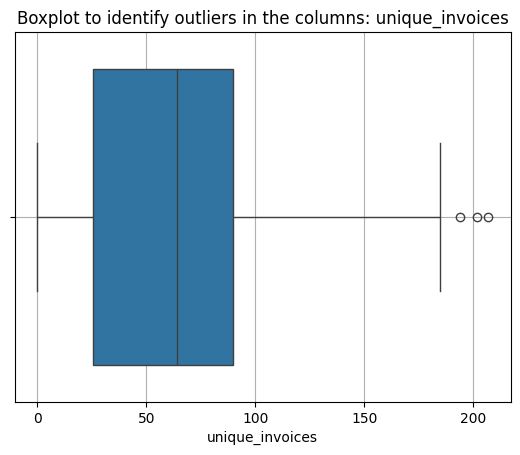

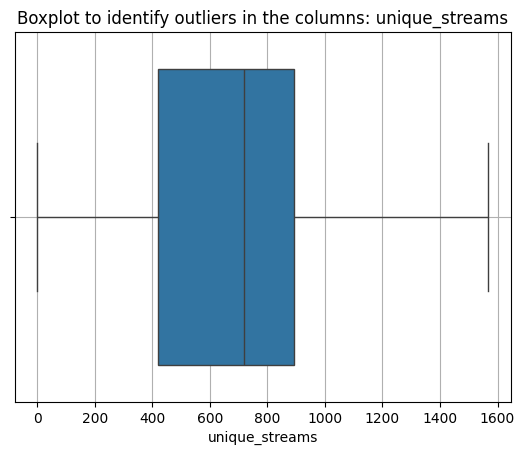

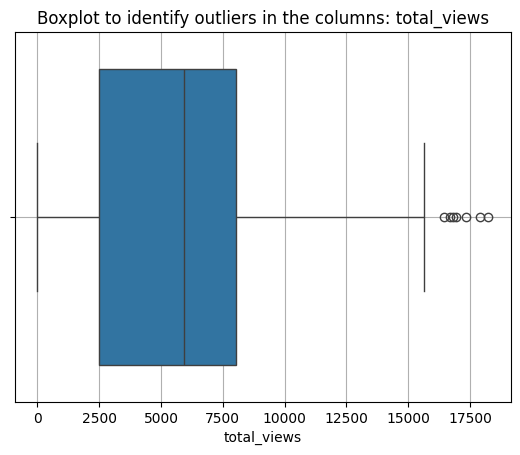

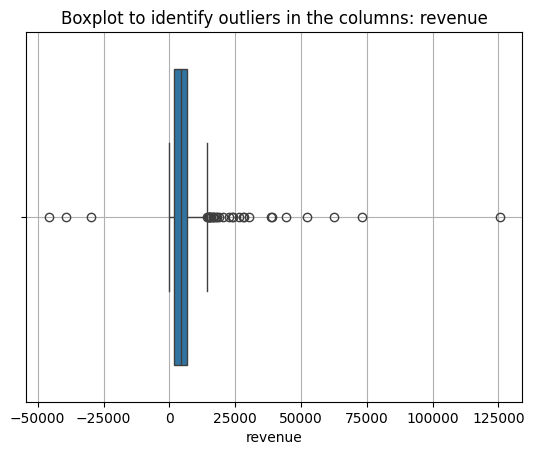

In [16]:
#Check for outliers
list_col_name = library_ts_df['df_ts_all'].columns
size_list_col_name = len (list_col_name)
for i in range (0,size):
    df_name = list_ts_df[i]
    print(i+1, '- Dataframe', df_name , 'data:')
    for j in range (size_list_col_name):
        viz.show_boxplot((library_ts_df[df_name]), list_col_name[j])
        print('\n')

In [17]:
library_ts_df['df_ts_all'].columns

Index(['date', 'purchases', 'unique_invoices', 'unique_streams', 'total_views',
       'revenue'],
      dtype='object')

1 - Dataframe df_ts_all data:


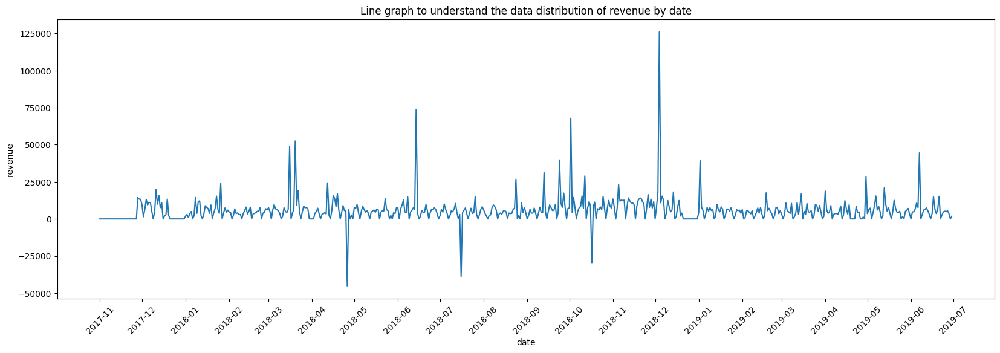



2 - Dataframe df_ts_eire data:


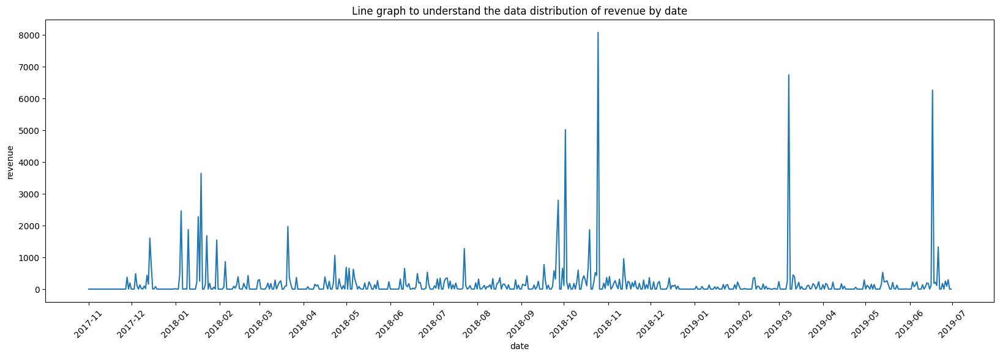



3 - Dataframe df_ts_france data:


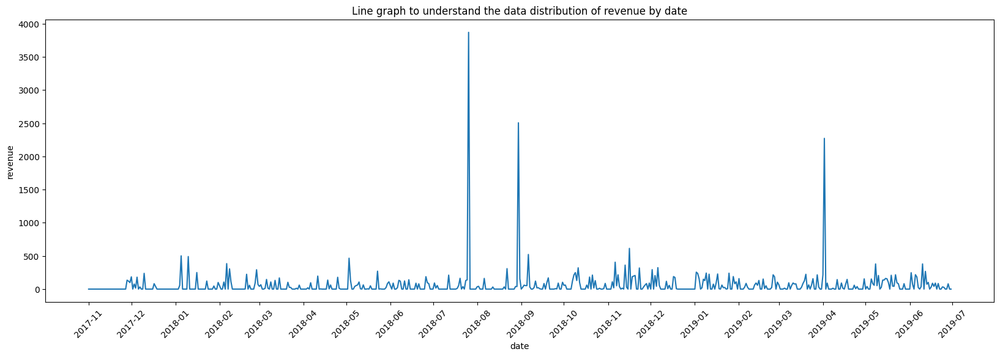



4 - Dataframe df_ts_germany data:


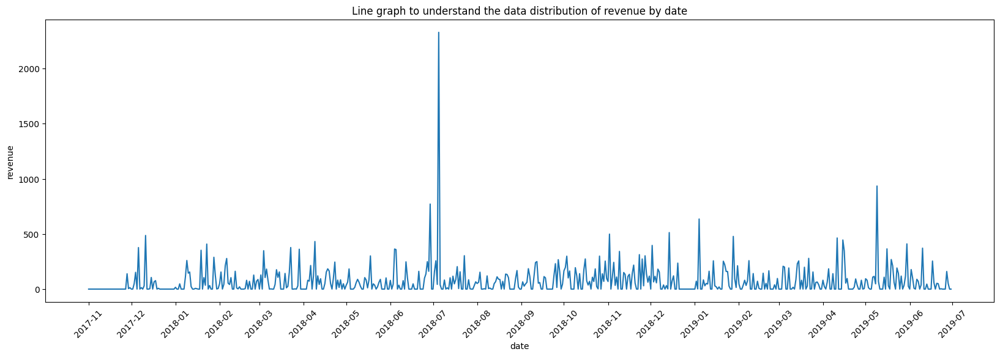



5 - Dataframe df_ts_hong_kong data:


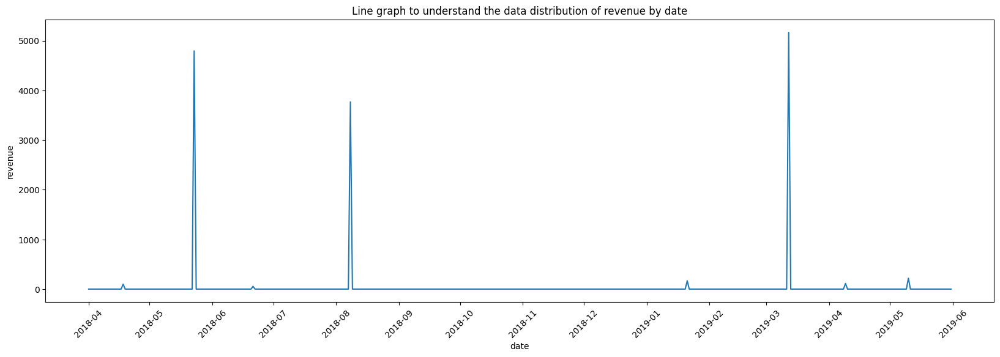



6 - Dataframe df_ts_netherlands data:


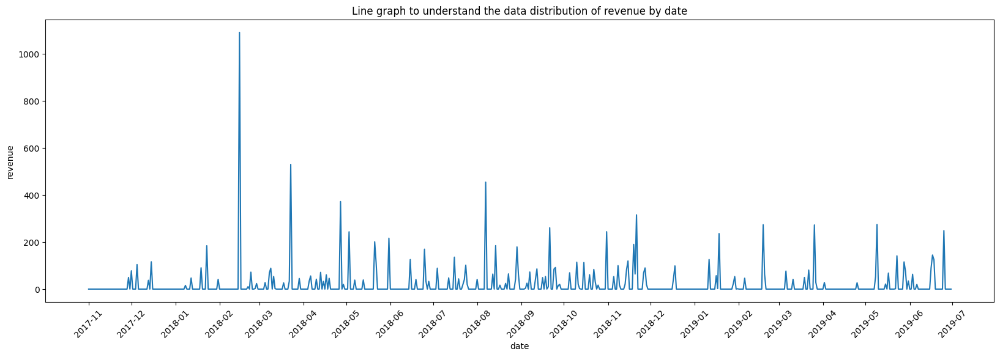



7 - Dataframe df_ts_norway data:


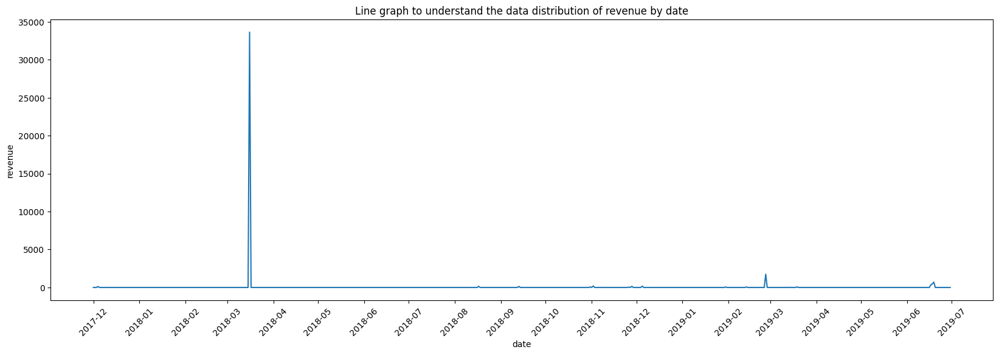



8 - Dataframe df_ts_portugal data:


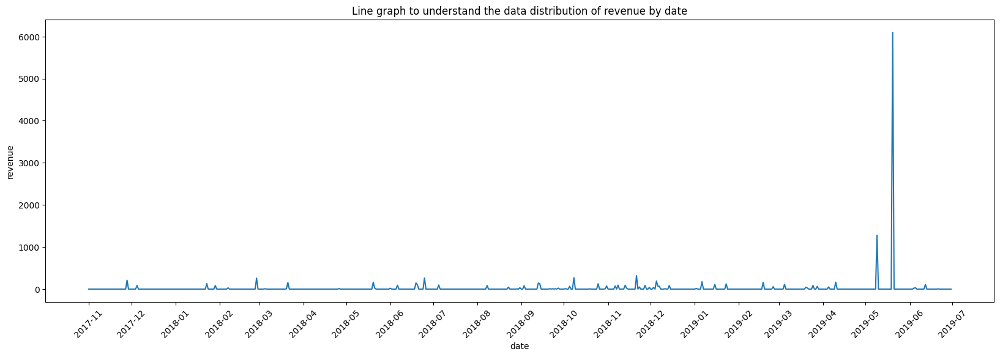



9 - Dataframe df_ts_singapore data:


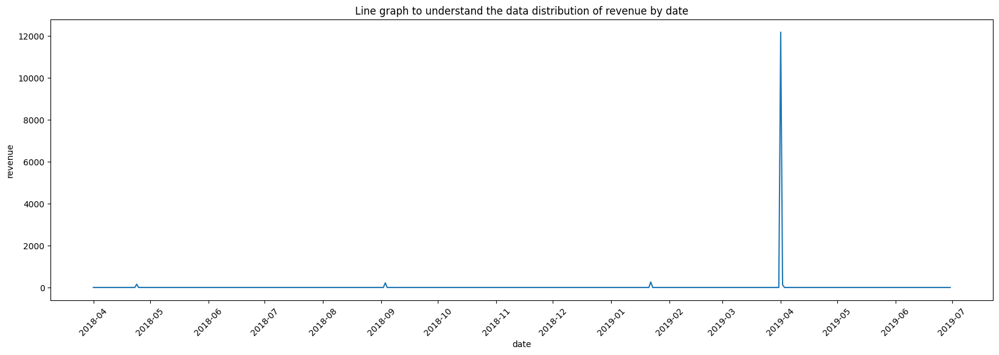



10 - Dataframe df_ts_spain data:


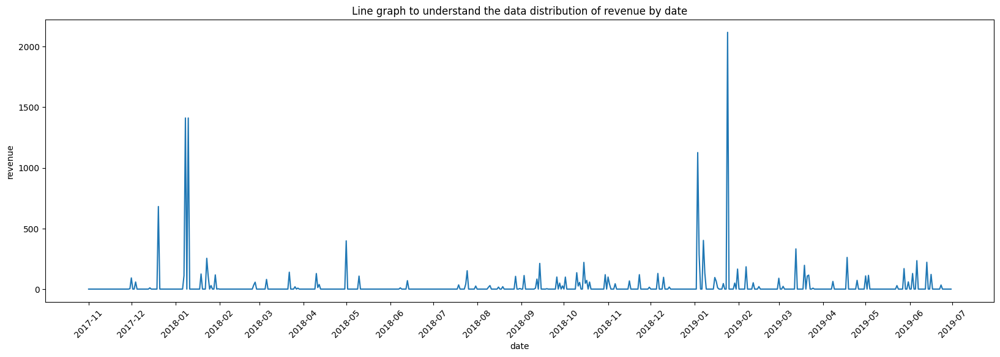



11 - Dataframe df_ts_united_kingdom data:


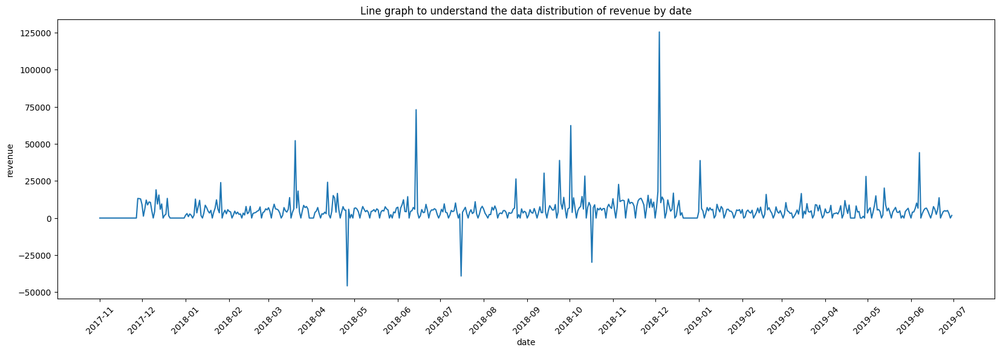

In [18]:
#Display a line graph of daily revenue the time serie datasets
for i in range (0,size):
    df_name = list_ts_df[i]
    print(i+1, '- Dataframe', df_name , 'data:')
    viz.show_lineGraph((library_ts_df[df_name]), 'date', 'revenue')
    print('\n')

## 2-Create and Test 3 Multi target regression Models using 2 columns month and day as independent variables
This strategy consists of fitting one regressor per target. This is a simple strategy for extending regressors that do not natively support multi-target regression.

### 2.1.-Preprocessing 

In [19]:
#Feature engineering: aggregate the data by month and day
library_ts_df_monthly = {} 
for i in range (0,size):
    df_name = list_ts_df[i]
    library_ts_df_monthly[df_name] = model.preprocess_data(library_ts_df[df_name])
    print(i+1, '- Dataframe', df_name , 'was aggregated by month and day.')

1 - Dataframe df_ts_all was aggregated by month and day.
2 - Dataframe df_ts_eire was aggregated by month and day.
3 - Dataframe df_ts_france was aggregated by month and day.
4 - Dataframe df_ts_germany was aggregated by month and day.
5 - Dataframe df_ts_hong_kong was aggregated by month and day.
6 - Dataframe df_ts_netherlands was aggregated by month and day.
7 - Dataframe df_ts_norway was aggregated by month and day.
8 - Dataframe df_ts_portugal was aggregated by month and day.
9 - Dataframe df_ts_singapore was aggregated by month and day.
10 - Dataframe df_ts_spain was aggregated by month and day.
11 - Dataframe df_ts_united_kingdom was aggregated by month and day.


In [20]:
#Observe data aggregated by month and day
print ("\nOBSERVE DATA")
for i in range (0,size):
    df_name = list_ts_df[i]
    print(i+1, '- Dataframe', df_name , 'data:')
    etl.get_data_info(library_ts_df_monthly[df_name]) 
    print('\n')


OBSERVE DATA
1 - Dataframe df_ts_all data:

FIRST 10 ROWS OF THE DATA
   current_month  current_day  purchases  unique_invoices  unique_streams  \
0              1            1      918.0             63.5           677.0   
1              1            2     1335.0             61.0           828.5   
2              1            3     1060.5             46.0           635.0   
3              1            4     1427.5             72.5           865.0   
4              1            5      356.0             24.5           252.5   
5              1            6      546.0             25.5           325.5   
6              1            7     1334.0             49.0           799.5   
7              1            8     2067.5             79.0          1019.0   
8              1            9     1444.5             63.5           929.5   
9              1           10     1535.5             57.5           940.5   

   total_views  current_revenue  next_month_revenue  next_month  next_day  
0    

### 2.2.-Split data into predictors (X) and target (y)

In [21]:
# Split the data into features and target
# X = X[df_name] and y = [df_name]
X = {}
y = {}
for i in range (0,size):
    df_name = list_ts_df[i]
    X[df_name], y[df_name] = model.split_into_predictors_targets(library_ts_df_monthly[df_name])
    print(i+1, '- Dataframe', df_name , 'was successfully splitted')
    print("SHAPE OF THE DATA: ")
    print("Number of (rows, column) X : " + str((X[df_name]).shape))
    print("Number of (row, columns) y : " + str((y[df_name]).shape))
    print('\n')

1 - Dataframe df_ts_all was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) X : (365, 2)
Number of (row, columns) y : (365, 6)


2 - Dataframe df_ts_eire was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) X : (365, 2)
Number of (row, columns) y : (365, 6)


3 - Dataframe df_ts_france was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) X : (365, 2)
Number of (row, columns) y : (365, 6)


4 - Dataframe df_ts_germany was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) X : (365, 2)
Number of (row, columns) y : (365, 6)


5 - Dataframe df_ts_hong_kong was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) X : (365, 2)
Number of (row, columns) y : (365, 6)


6 - Dataframe df_ts_netherlands was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) X : (365, 2)
Number of (row, columns) y : (365, 6)


7 - Dataframe df_ts_norway was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, 

### 2.2.-Split data into training (X_train, y_train) and test (X_test, y_test) sets 

In [22]:
# Randomly split the data into 80% for training and 20% for test sets
# X_train=X_train[df_name] , y_train=y_train[df_name], X_test=X_test[df_name] and y_test=y_test[df_name]
X_train, X_test , y_train , y_test = {}, {}, {}, {}
for i in range (0,size):
    df_name = list_ts_df[i]
    X_train[df_name], X_test[df_name], y_train[df_name], y_test[df_name] = model.split_into_training_test(X[df_name], y[df_name])
    print(i+1, '- Dataframe', df_name , 'was successfully splitted')
    print("SHAPE OF THE DATA: ")
    print("Number of (rows, column) Xtrain : " + str((X_train[df_name]).shape))
    print("Number of (row, columns) Xtest : " + str((X_test[df_name]).shape))
    print("Number of (rows, column) ytrain : " + str((y_train[df_name]).shape))
    print("Number of (row, columns) ytest : " + str((y_test[df_name]).shape))
    print('\n')

1 - Dataframe df_ts_all was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) Xtrain : (328, 2)
Number of (row, columns) Xtest : (37, 2)
Number of (rows, column) ytrain : (328, 6)
Number of (row, columns) ytest : (37, 6)


2 - Dataframe df_ts_eire was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) Xtrain : (328, 2)
Number of (row, columns) Xtest : (37, 2)
Number of (rows, column) ytrain : (328, 6)
Number of (row, columns) ytest : (37, 6)


3 - Dataframe df_ts_france was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) Xtrain : (328, 2)
Number of (row, columns) Xtest : (37, 2)
Number of (rows, column) ytrain : (328, 6)
Number of (row, columns) ytest : (37, 6)


4 - Dataframe df_ts_germany was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) Xtrain : (328, 2)
Number of (row, columns) Xtest : (37, 2)
Number of (rows, column) ytrain : (328, 6)
Number of (row, columns) ytest : (37, 6)


5 - Dataframe df_ts_hong_kong wa

In [23]:
#Sort in ascending to be able to plot appropiate time-series visualizationabs
for i in range (0,size):
    df_name = list_ts_df[i]
    X_train[df_name]=X_train[df_name].sort_index(ascending=True)
    X_test[df_name] =X_test [df_name].sort_index(ascending=True)
    y_train[df_name]=y_train[df_name].sort_index(ascending=True)
    y_test[df_name] =y_test [df_name].sort_index(ascending=True)

### 2.3.-Train Predict and Evaluate 3 models

In [24]:
# Train, predict, and evaluate each model
y_pred_lr , y_pred_rf , y_pred_xgb , lr_model , rf_model, xgb_model = {}, {}, {}, {}, {}, {}
for i in range (0,size):
    df_name = list_ts_df[i]
    print(i+1, '- The model of Dataframe', df_name , 'was successfully trained, used to predict and evaluated as follows:\n')
    y_pred_lr[df_name], y_pred_rf[df_name], y_pred_xgb[df_name], lr_model[df_name], rf_model[df_name], xgb_model[df_name] = model.train_predict_evaluate(X_train[df_name], y_train[df_name], X_test[df_name], y_test[df_name])
    print('\n') 

1 - The model of Dataframe df_ts_all was successfully trained, used to predict and evaluated as follows:

Linear Regression Model:
Mean Absolute Error (MAE): 15113.29
Mean Squared Error (MSE) : 1294475847.27
Root Mean-Square Error (RMSE) : 35978.82
Coefficient of Determination (R2) : -0.48

Random Forest Model:
Mean Absolute Error (MAE): 19545.20
Mean Squared Error (MSE) : 2341630784.42
Root Mean-Square Error (RMSE) : 48390.40
Coefficient of Determination (R2) : -1.05

XGBoost Model:
Mean Absolute Error (MAE): 19331.28
Mean Squared Error (MSE) : 2286804480.00
Root Mean-Square Error (RMSE) : 47820.54
Coefficient of Determination (R2) : -1.19

Evaluation Summary : 
                         MAE           MSE          RMSE        R2
Linear         15113.293798  1.294476e+09  35978.824985 -0.483398
Random Forest  19545.198085  2.341631e+09  48390.399713 -1.049131
XGBoost        19331.283203  2.286804e+09  47820.544539 -1.186588


2 - The model of Dataframe df_ts_eire was successfully traine

### 2.4.-Plot test data observed and predicted with the 3 models

In [25]:
#Convert month and day to day of year to plot the test data observed and predicted
X_test_day_of_year = {}
for i in range (0,size):
    df_name = list_ts_df[i]
    print(i+1, '- Dataframe', df_name , 'data:')
    X_test_day_of_year[df_name] = model.to_day_of_year_df(X_test[df_name])
    print(X_test_day_of_year[df_name])

1 - Dataframe df_ts_all data:
     day_of_year  current_month  current_day
328          330             11           25
329          331             11           26
330          332             11           27
331          333             11           28
332          334             11           29
333          335             11           30
334          336             12            1
335          337             12            2
336          338             12            3
337          339             12            4
338          340             12            5
339          341             12            6
340          342             12            7
341          343             12            8
342          344             12            9
343          345             12           10
344          346             12           11
345          347             12           12
346          348             12           13
347          349             12           14
348          350         

1 - Dataframe df_ts_all data:


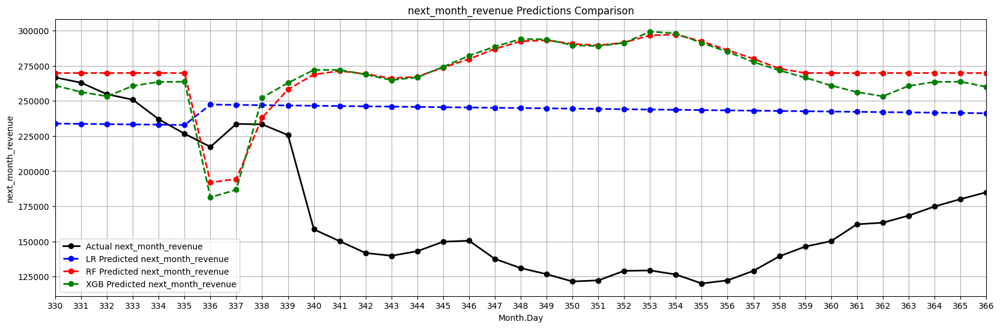

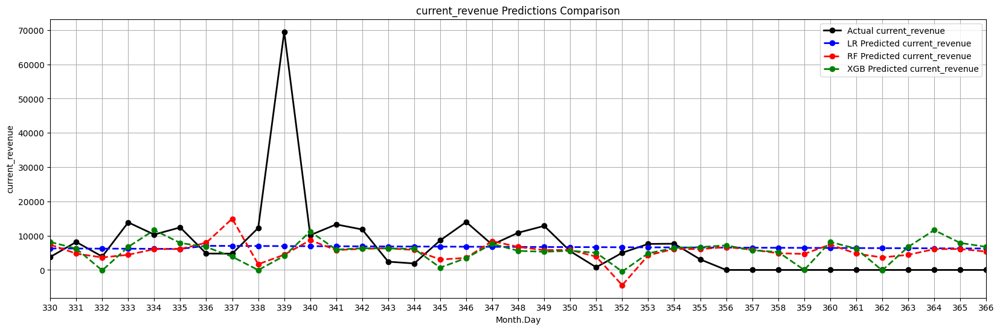

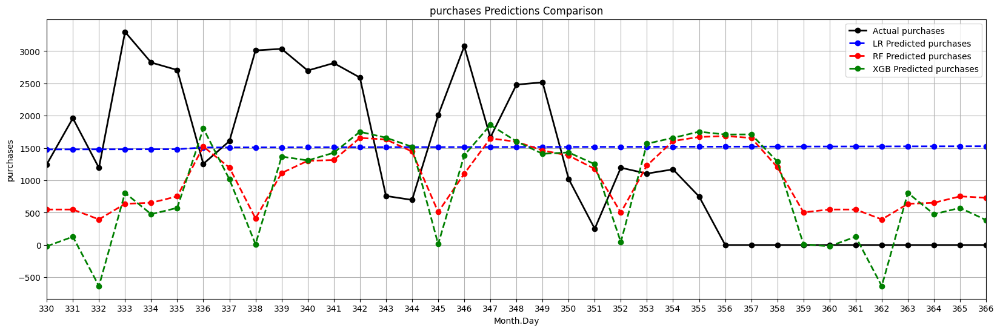

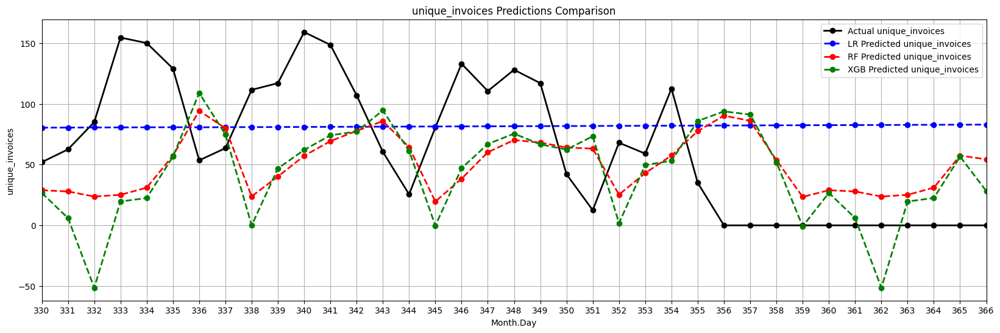

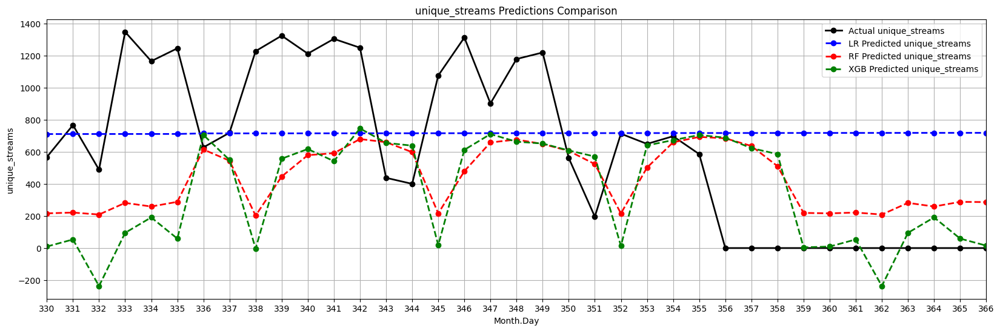

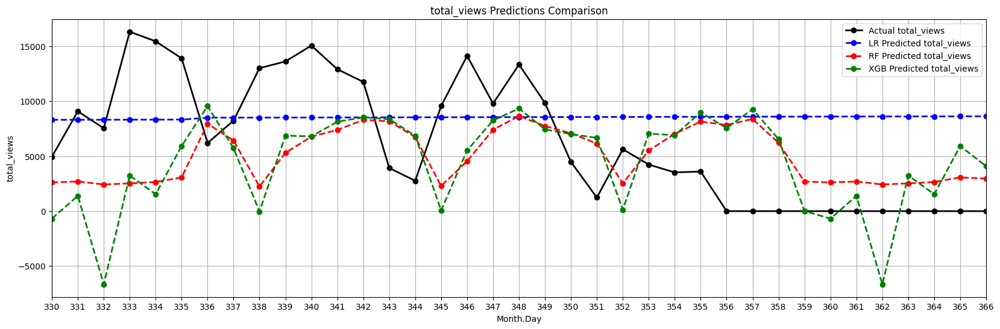

2 - Dataframe df_ts_eire data:


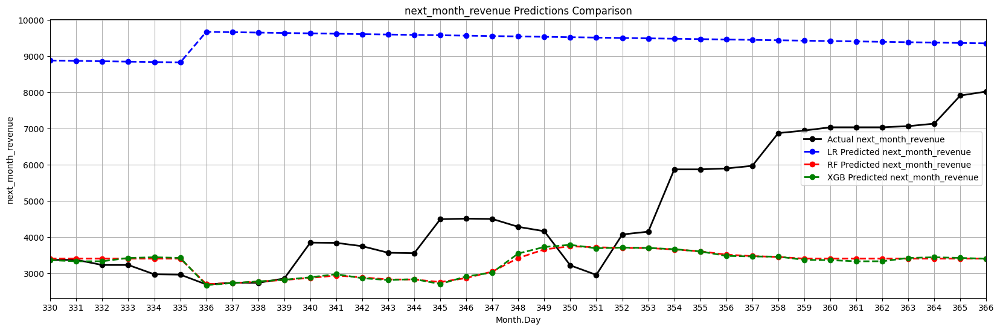

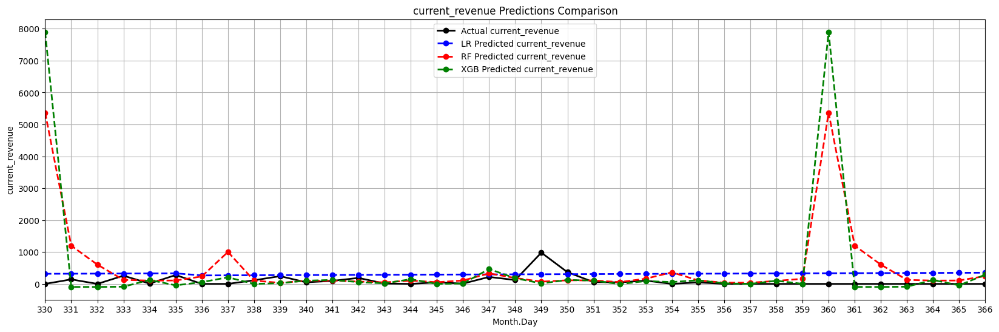

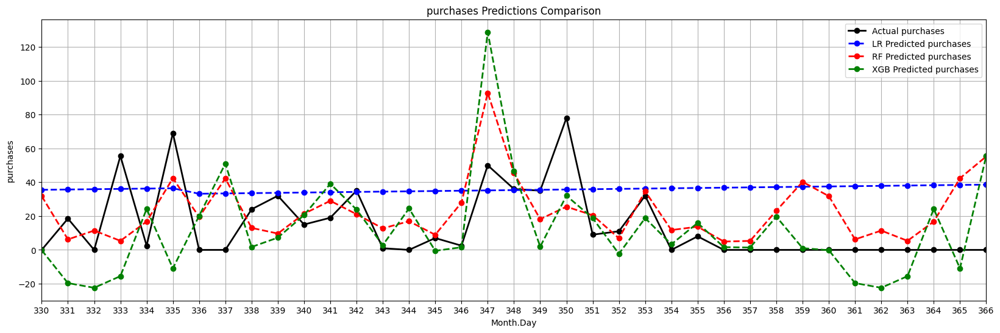

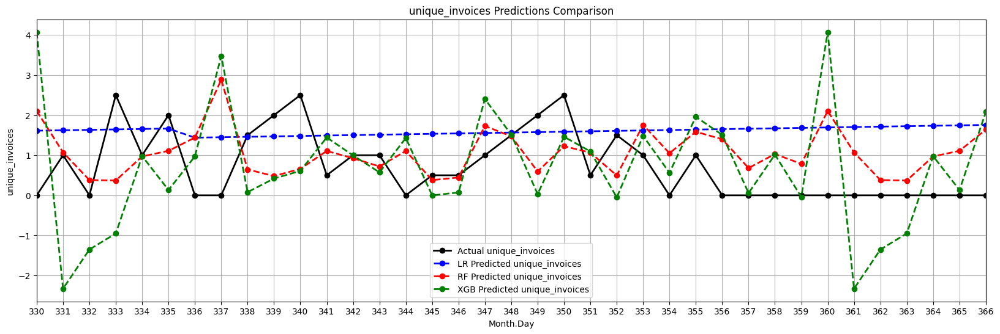

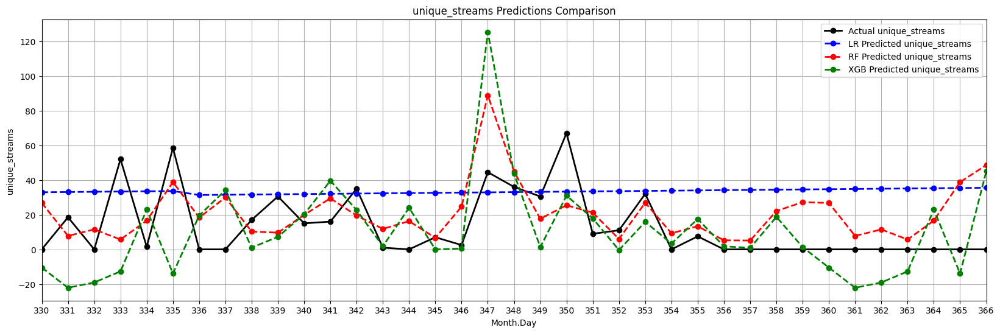

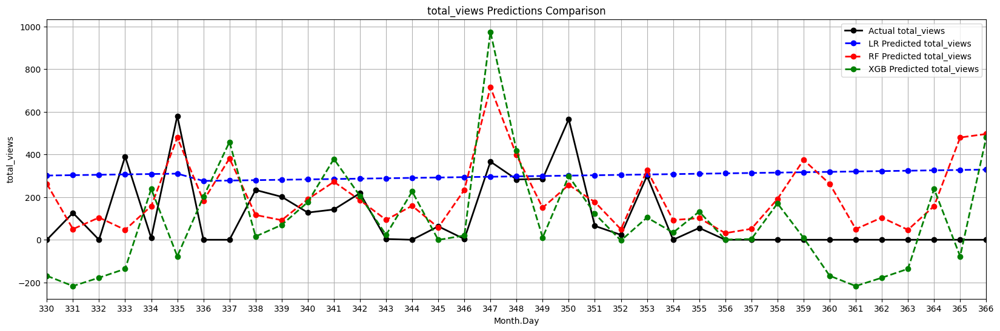

3 - Dataframe df_ts_france data:


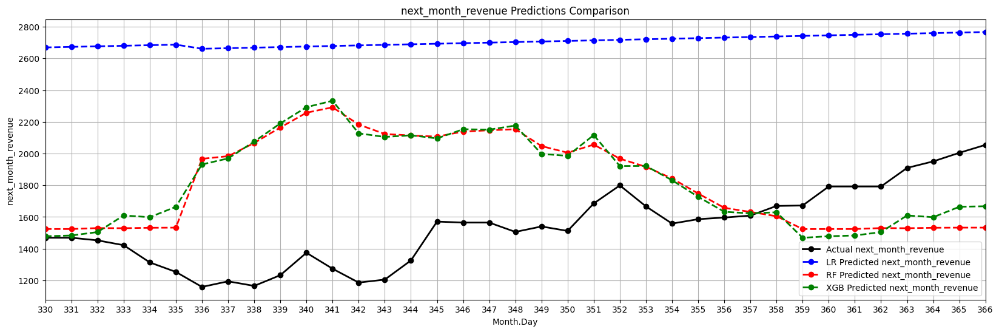

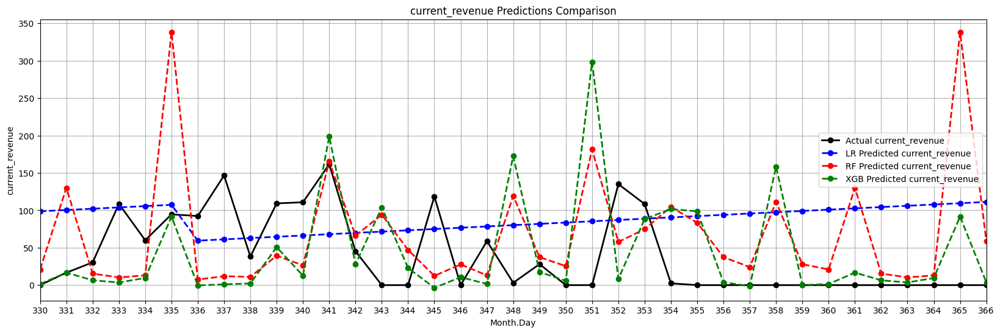

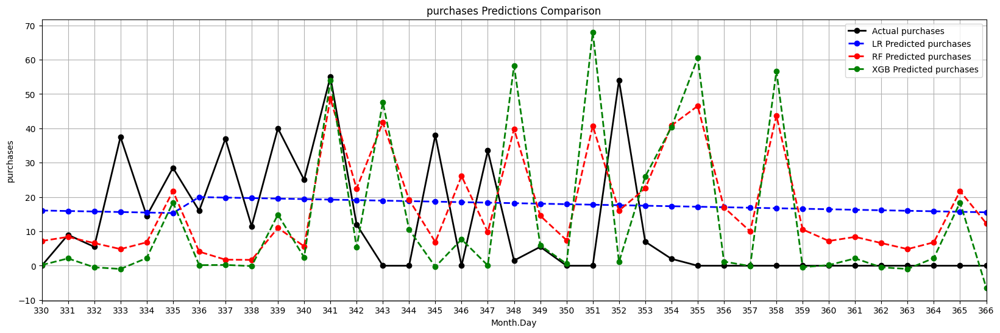

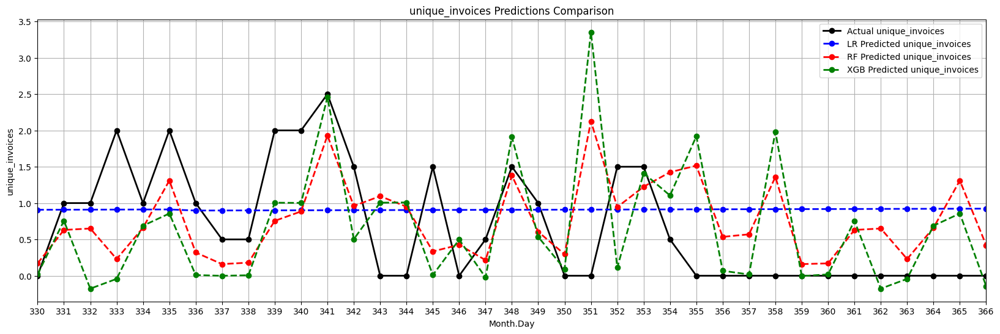

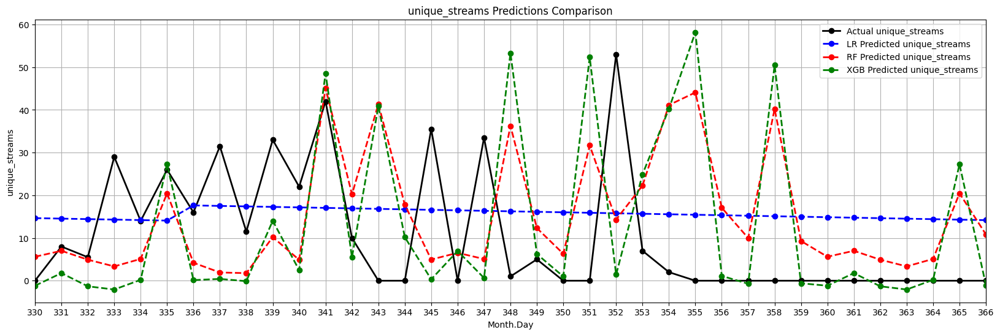

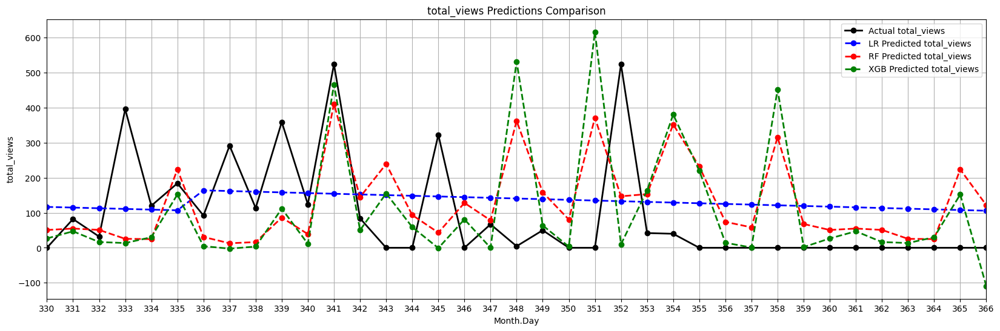

4 - Dataframe df_ts_germany data:


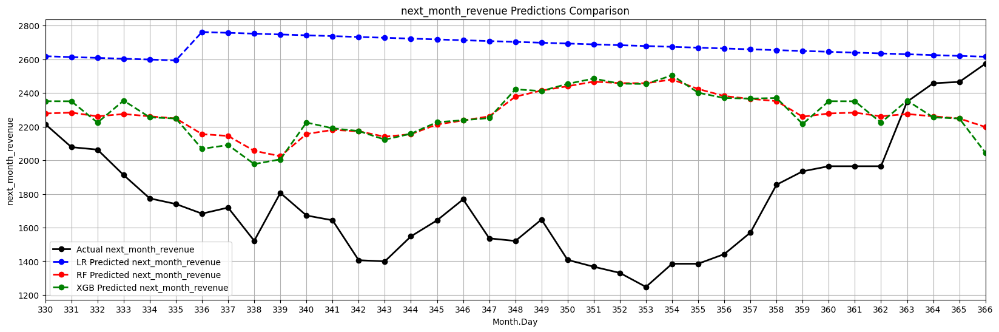

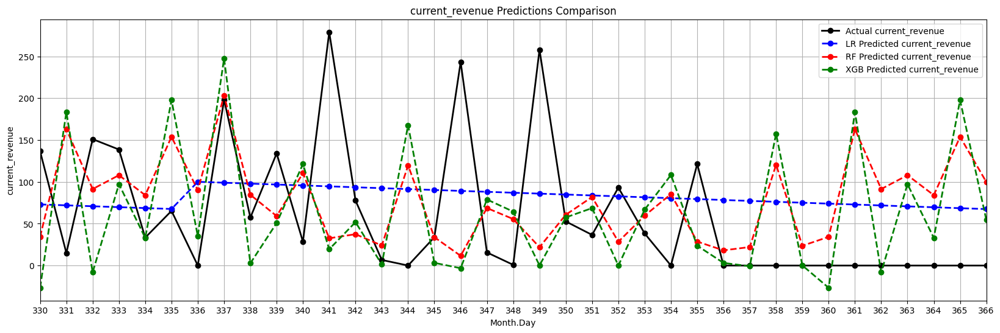

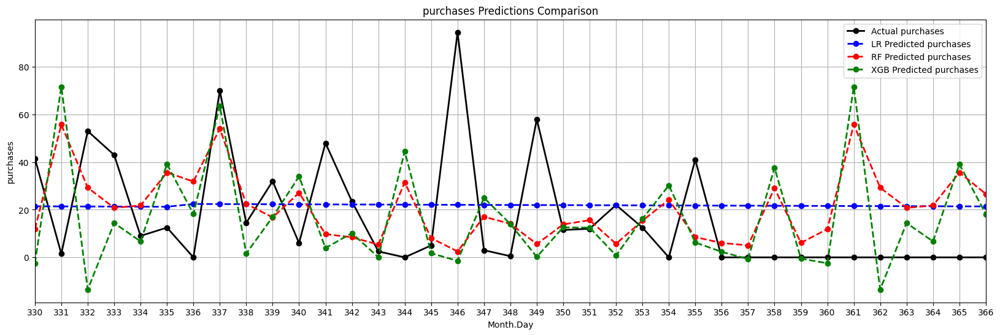

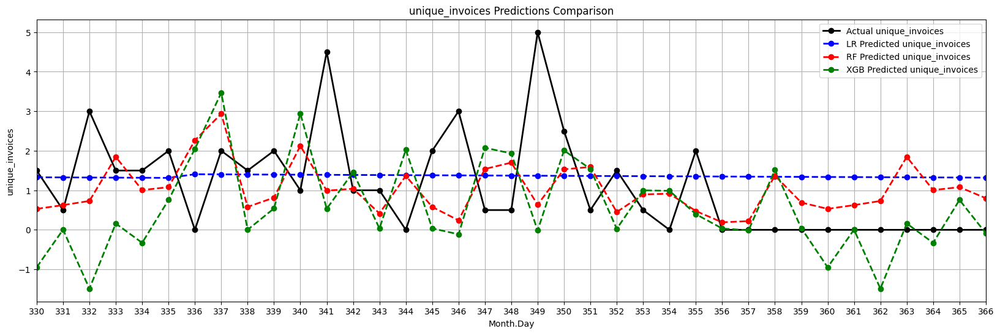

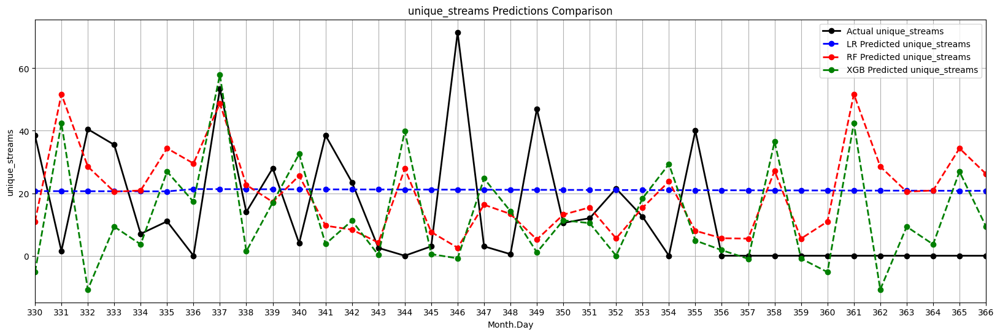

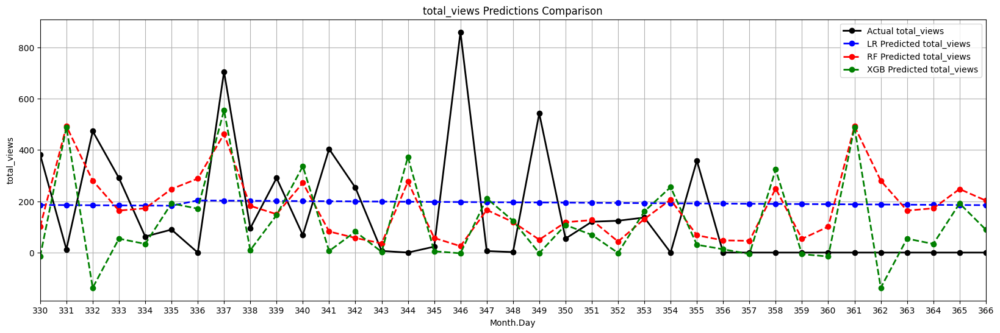

5 - Dataframe df_ts_hong_kong data:


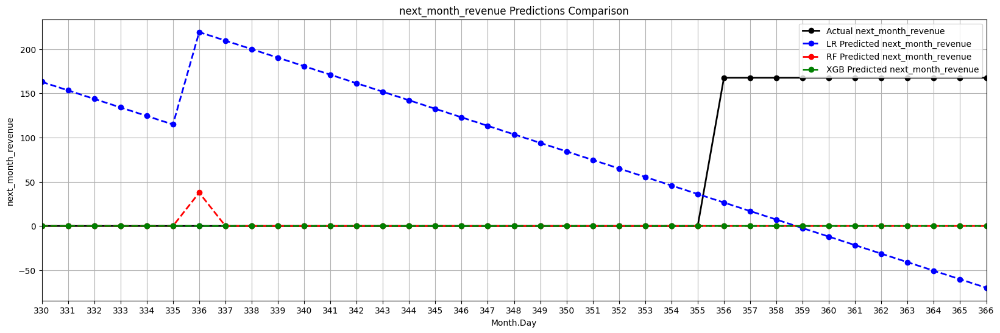

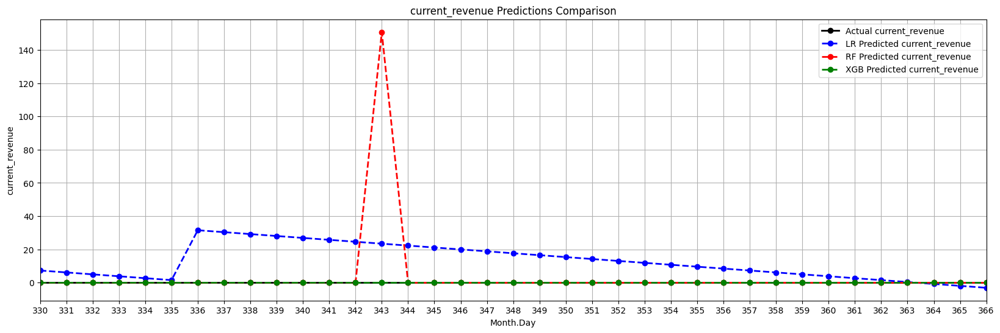

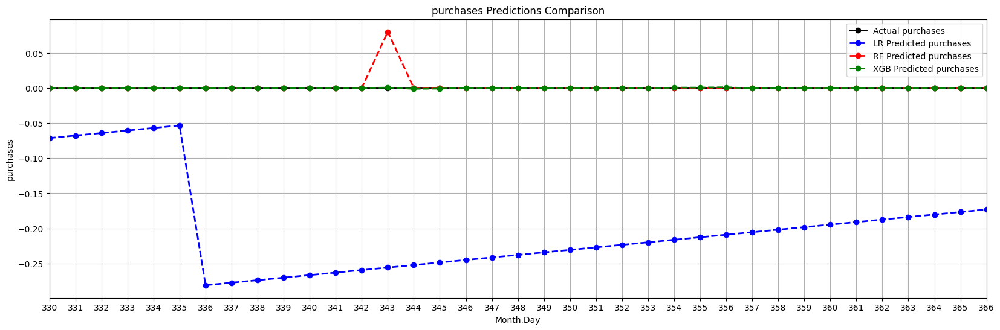

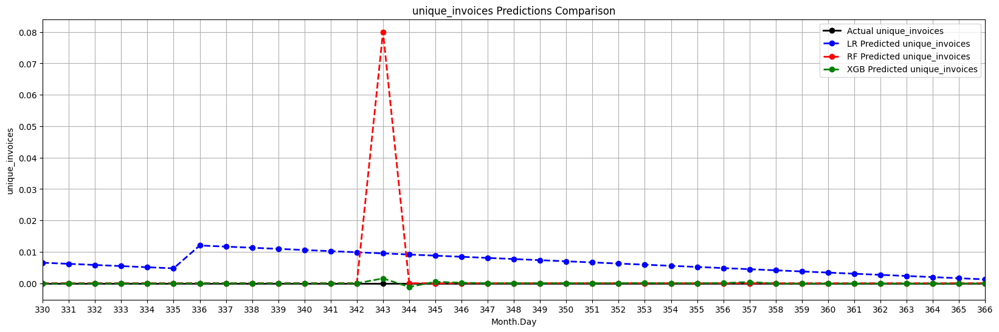

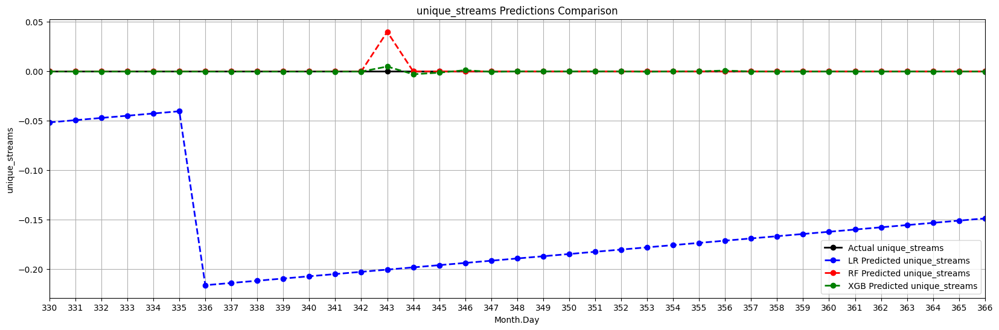

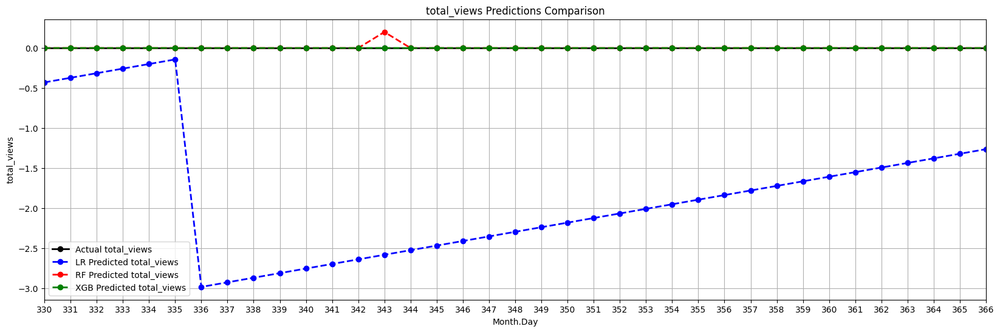

6 - Dataframe df_ts_netherlands data:


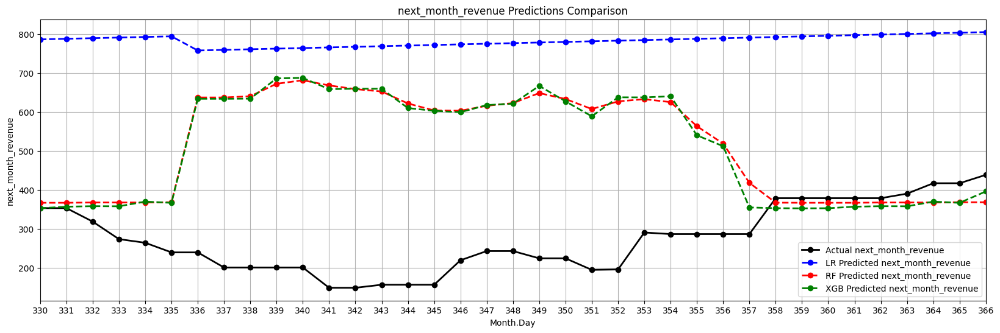

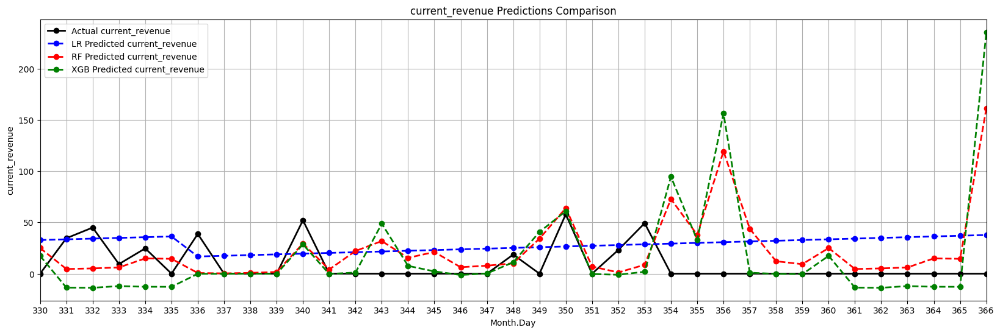

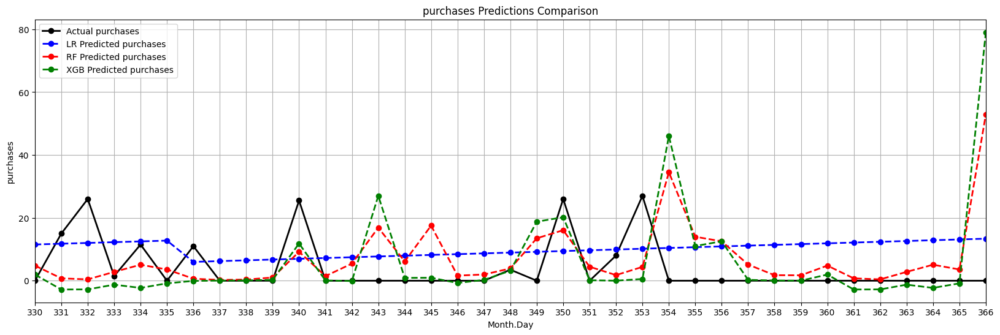

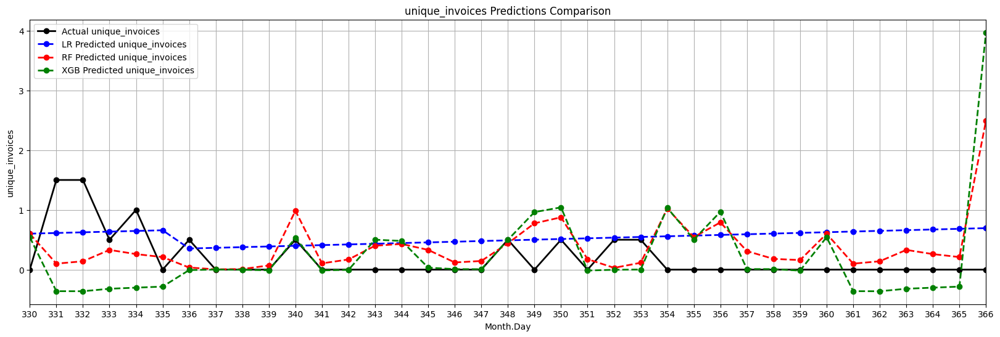

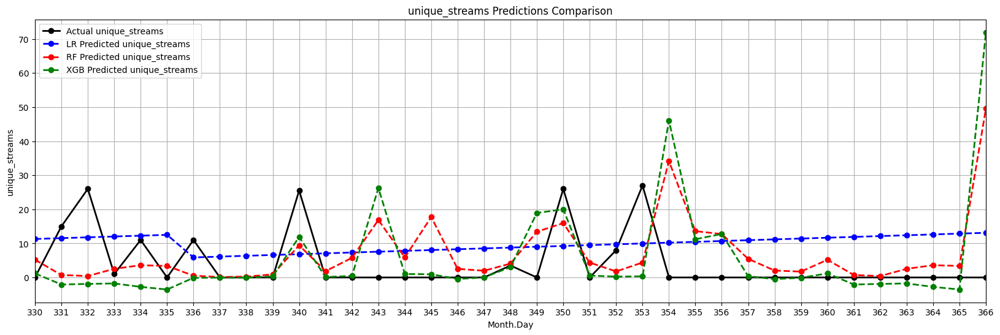

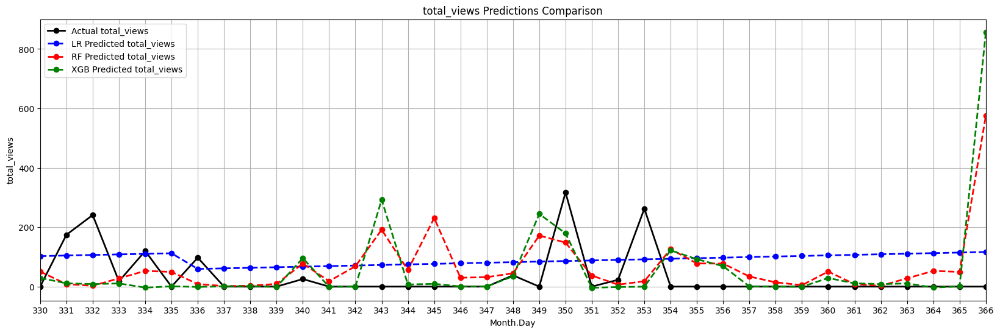

7 - Dataframe df_ts_norway data:


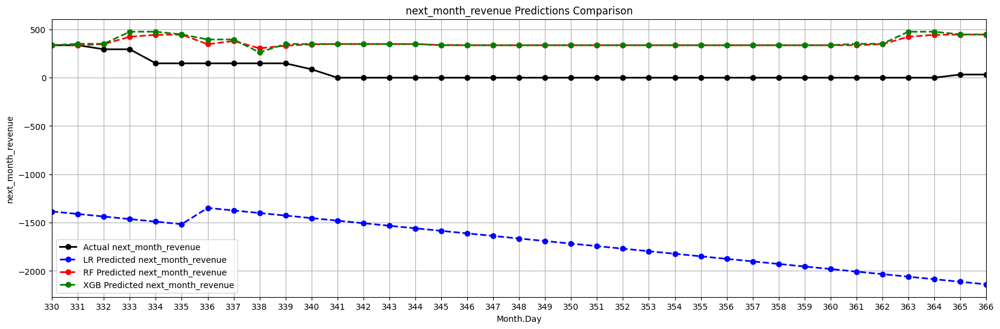

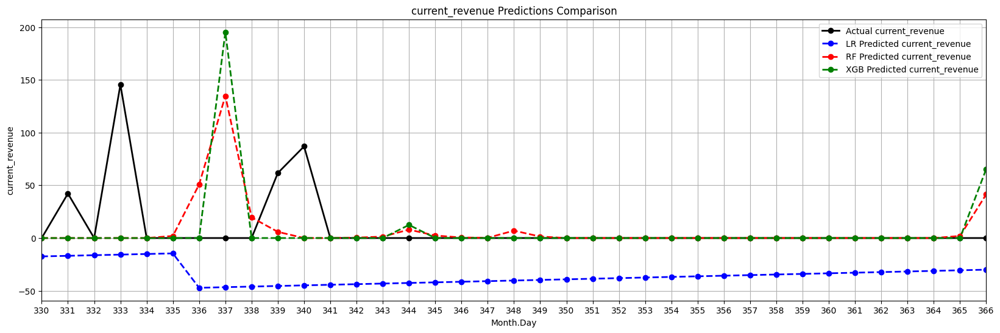

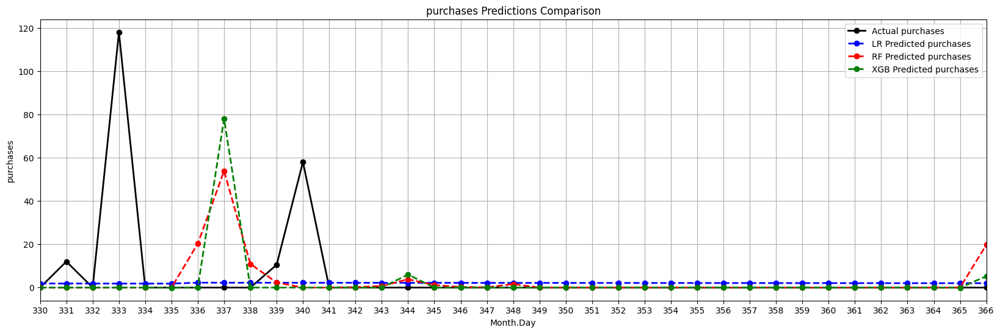

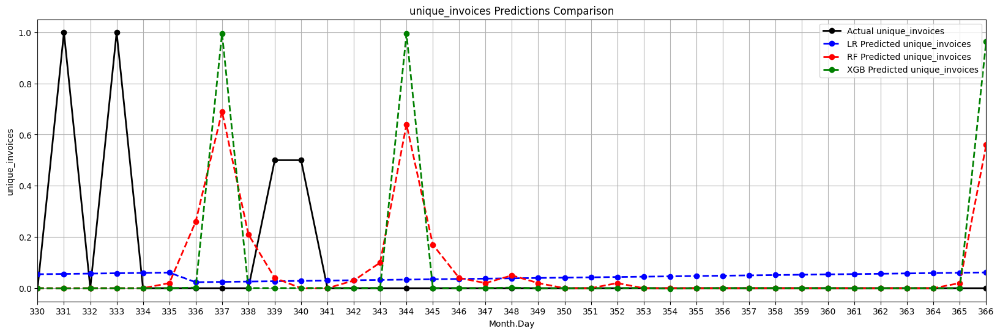

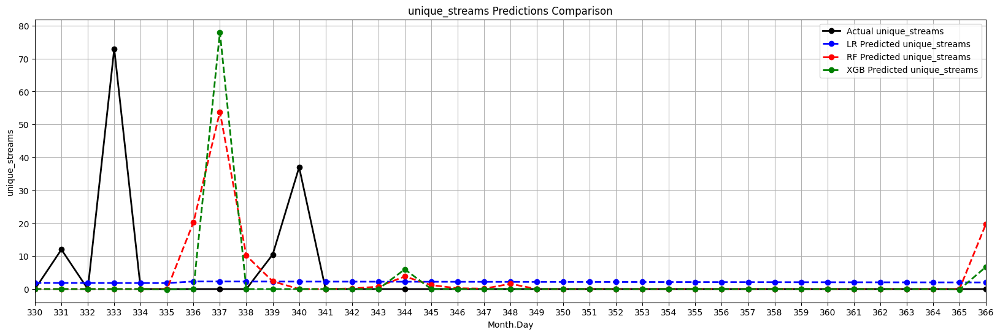

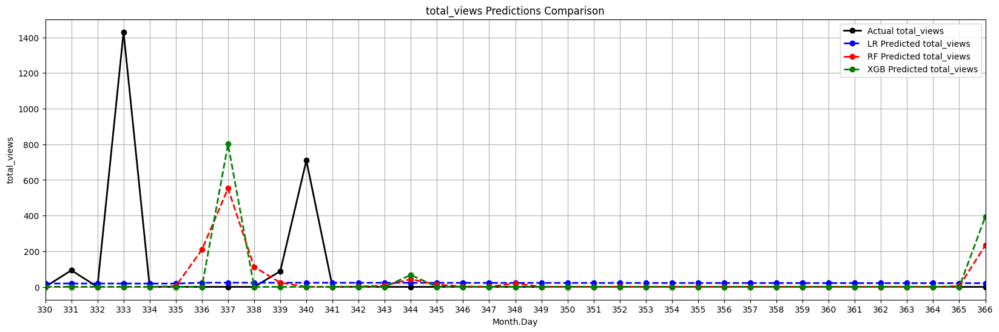

8 - Dataframe df_ts_portugal data:


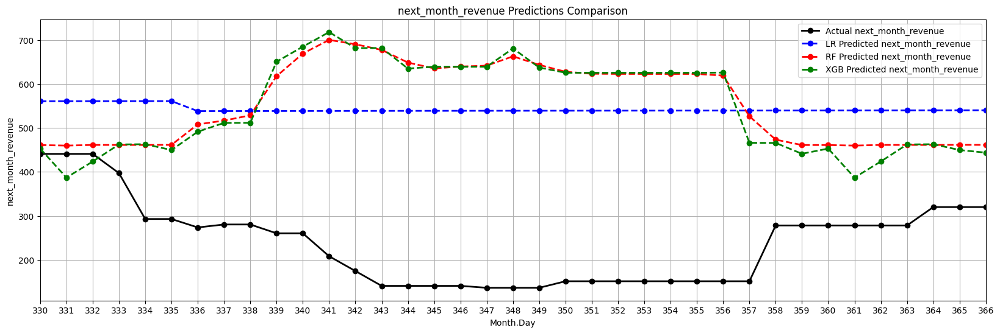

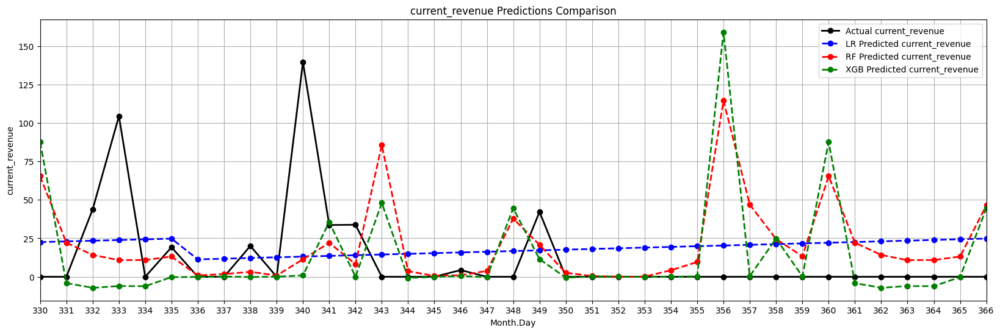

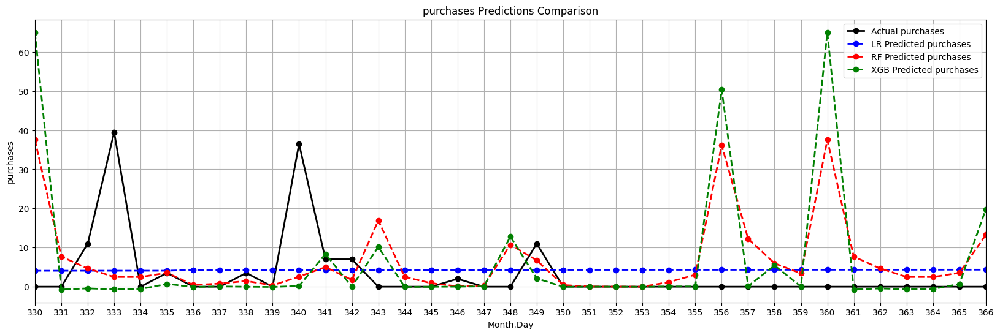

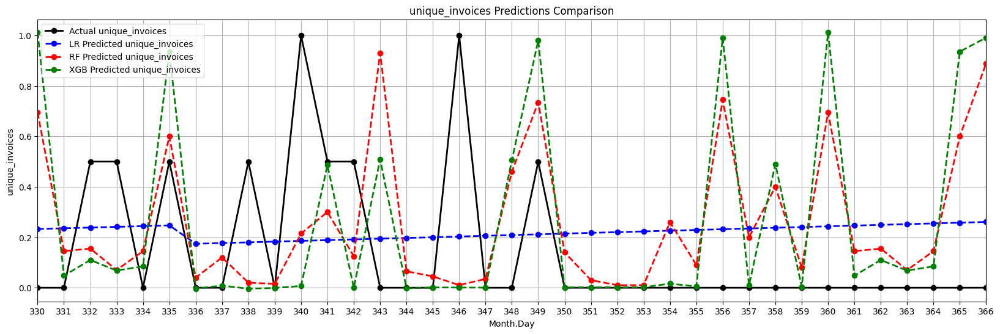

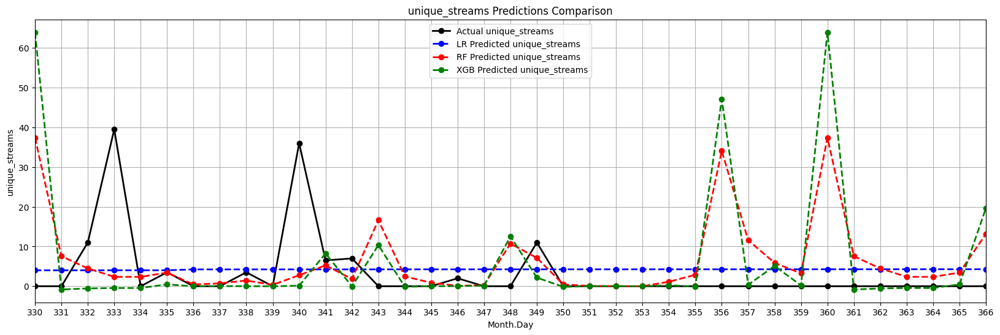

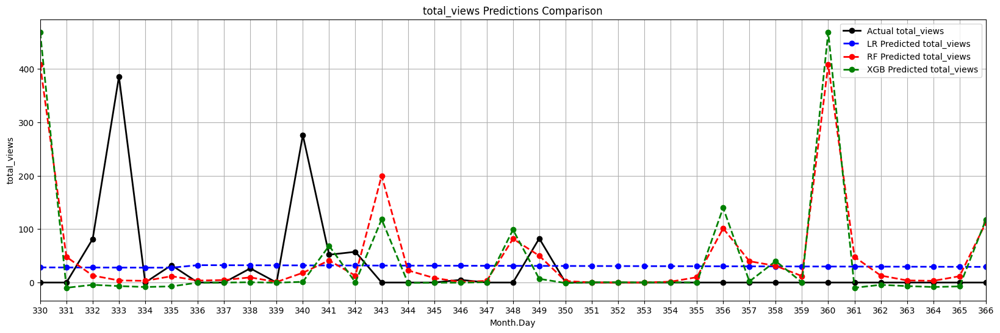

9 - Dataframe df_ts_singapore data:


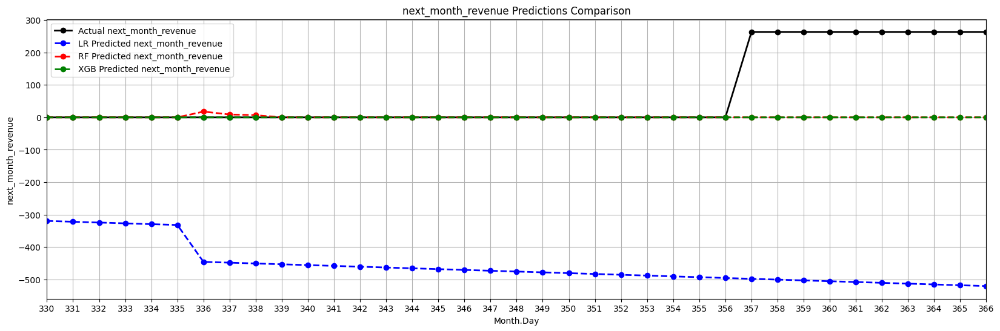

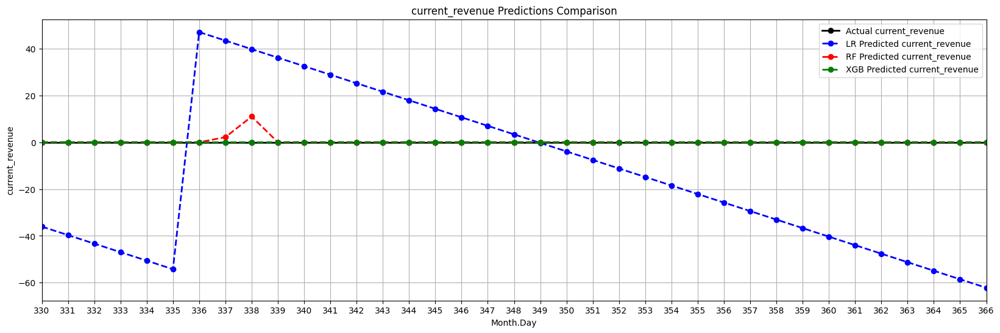

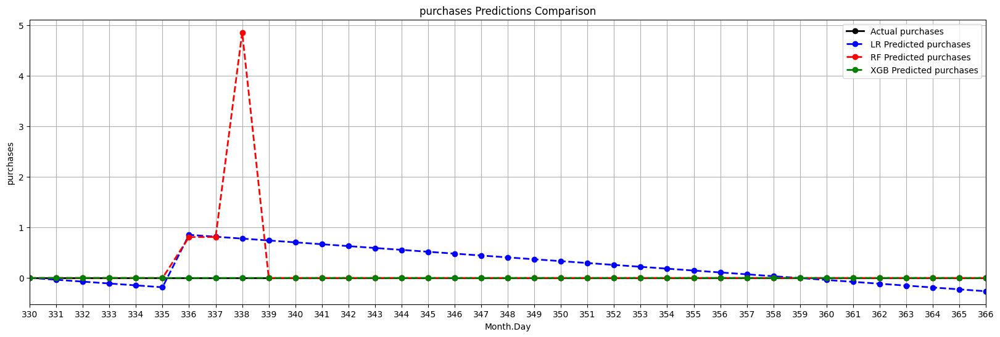

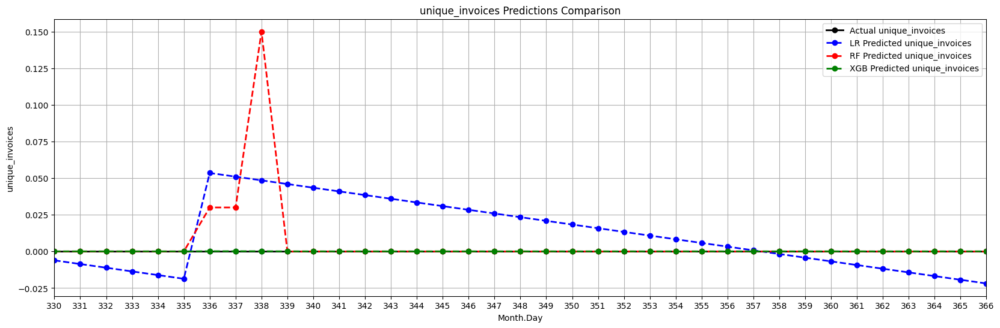

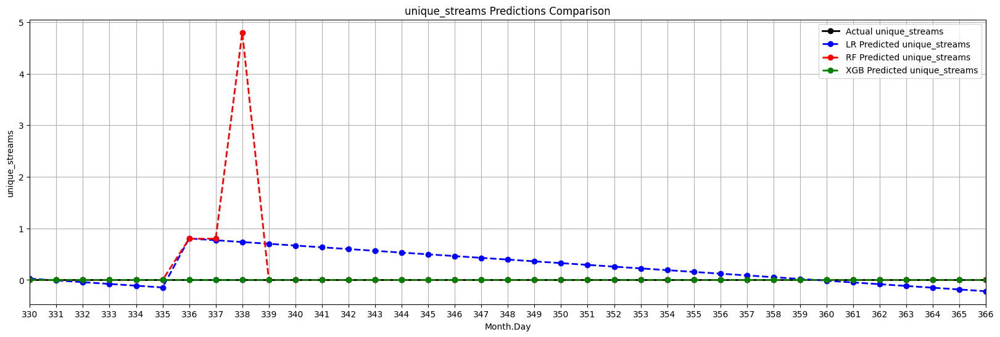

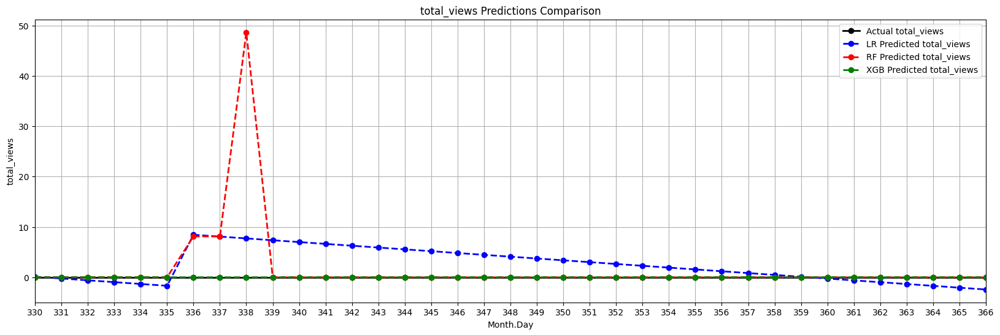

10 - Dataframe df_ts_spain data:


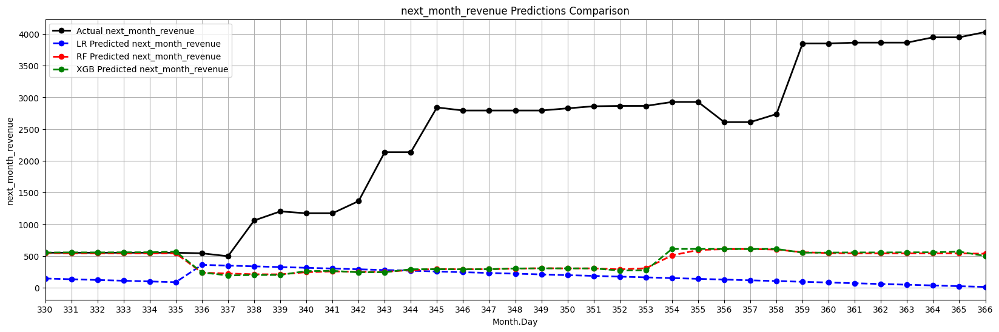

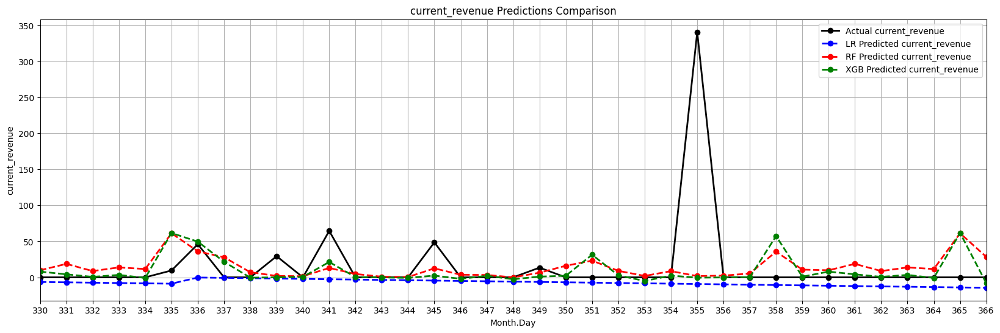

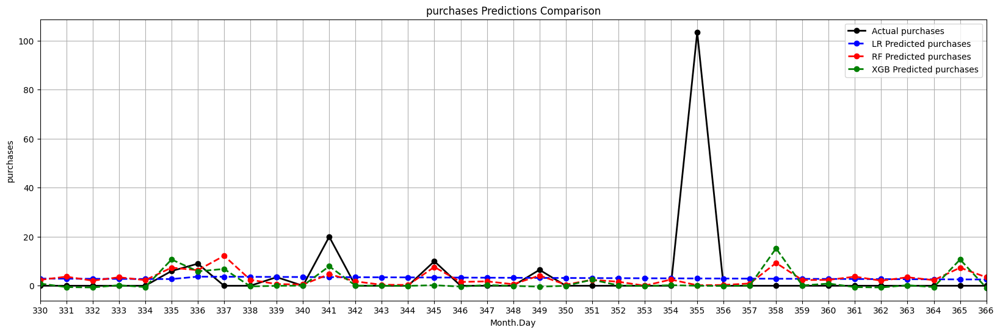

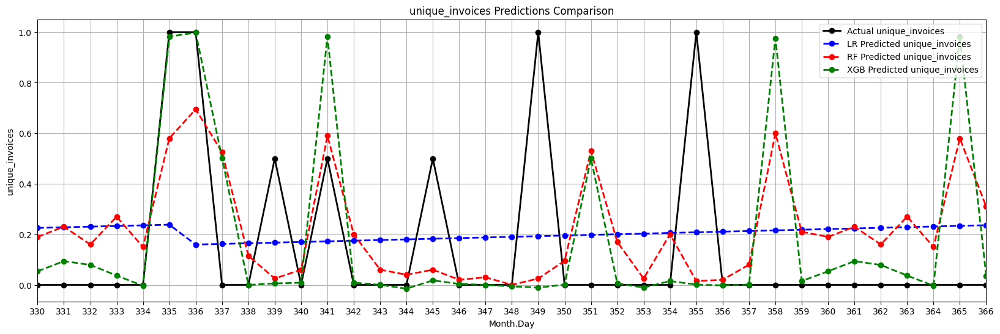

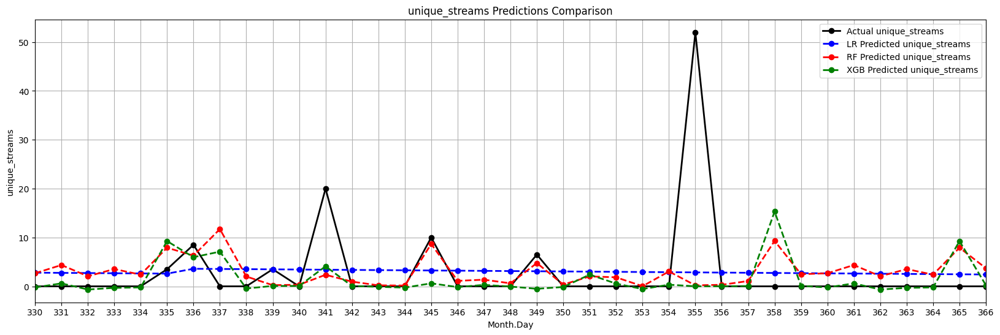

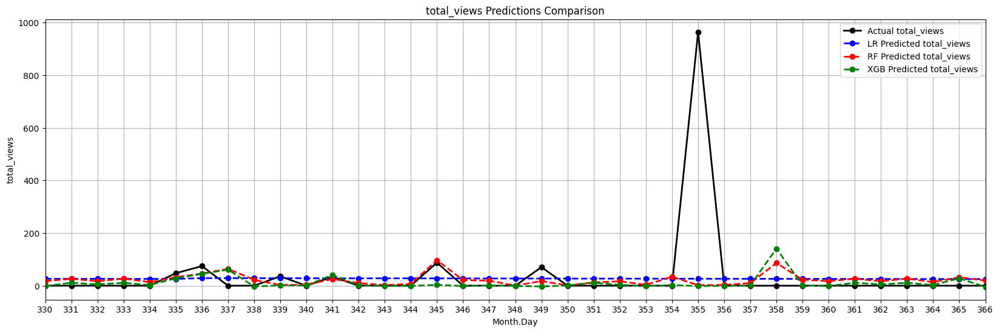

11 - Dataframe df_ts_united_kingdom data:


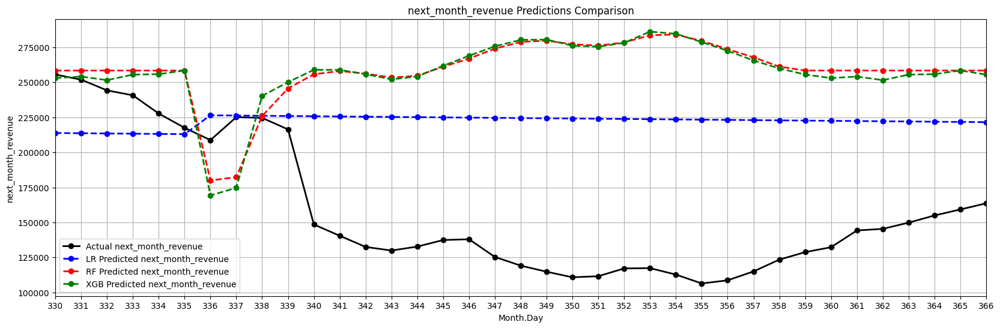

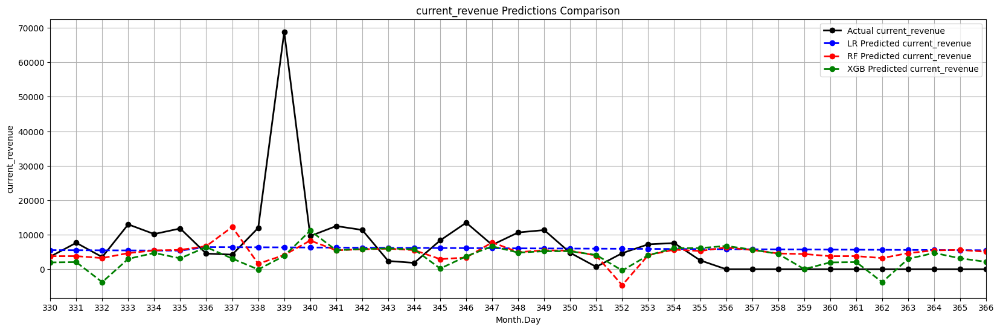

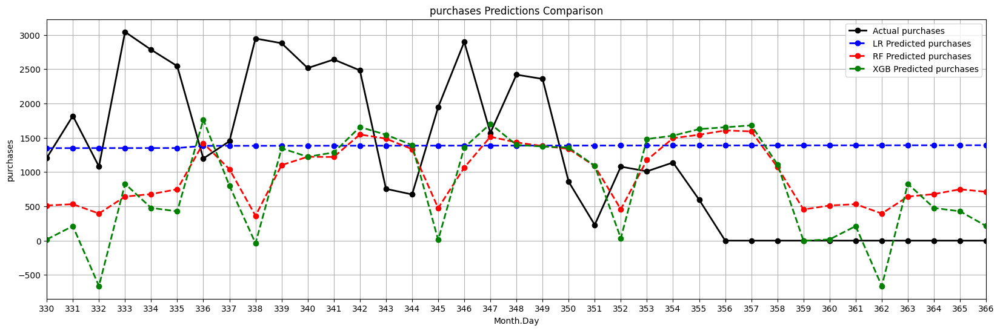

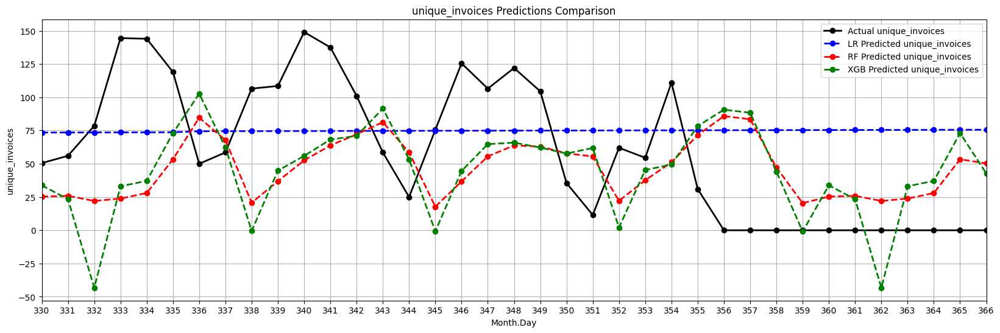

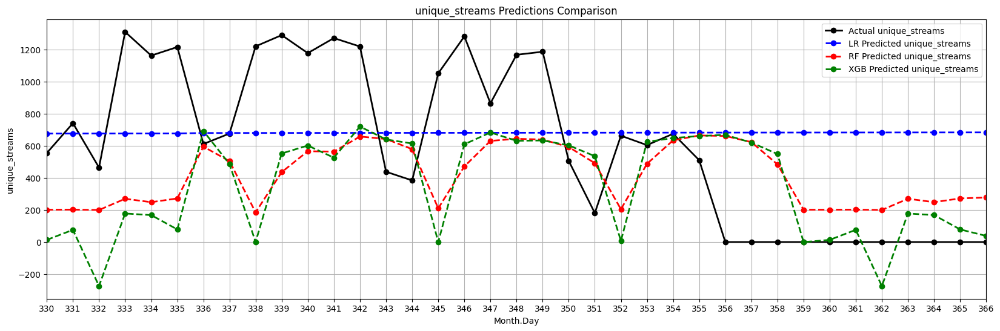

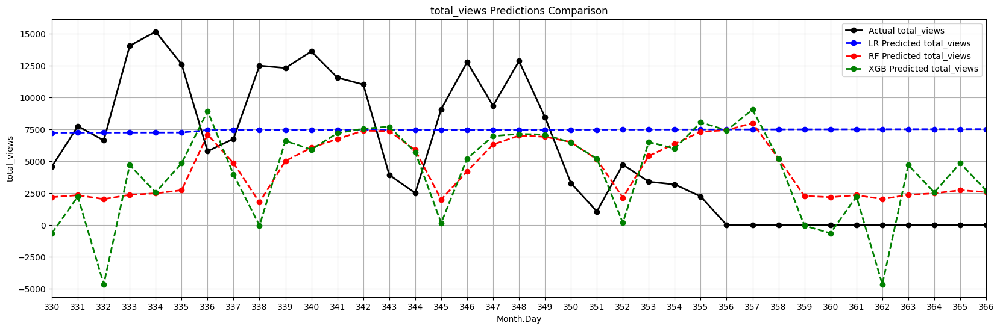

In [26]:
# Plot results for each target
for i in range (0,size):
    df_name = list_ts_df[i]
    print(i+1, '- Dataframe', df_name , 'data:')
    for target in y_test[df_name].columns:
        viz.plot_test_data(X_test_day_of_year[df_name]['day_of_year'], y_test[df_name], y_pred_lr[df_name], y_pred_rf[df_name], y_pred_xgb[df_name], target)

### 2.5-Test the Models with an additionnal single data

Scenario : 

In [27]:
#calcualte predicted data using the models for January 3 
#Data to use the model
single_month = 1
single_day = 3
test_date = {'current_month': single_month, 'current_day': single_day}
new_test_df = pd.DataFrame(data=test_date, index=([0]))
print (new_test_df)

   current_month  current_day
0              1            3


In [28]:
#Use the models for an additionnal prediction
y_test_pred_lr, y_test_pred_rf, y_test_pred_xgb = {}, {}, {}
for i in range (0,size):
    df_name = list_ts_df[i]
    y_test_pred_lr[df_name] = lr_model[df_name].predict(new_test_df)
    y_test_pred_rf[df_name] = rf_model[df_name].predict(new_test_df)   
    y_test_pred_xgb[df_name] = xgb_model[df_name].predict(new_test_df) 

for i in range (0,size):
    df_name = list_ts_df[i]
    #Compare results
    print(i+1, '- Dataframe', df_name , 'data:')
    
    print('\nObserved data')
    print(library_ts_df_monthly[df_name]
        [(library_ts_df_monthly[df_name]['current_month']==test_date['current_month']) & 
          (library_ts_df_monthly[df_name]['current_day']==test_date['current_day'])].T) 
    
    print('\nPredicted')
    d1 = {
        'purchases'         : [y_test_pred_lr[df_name][0][0],  y_test_pred_rf[df_name][0][0],  y_test_pred_xgb[df_name][0][0]], 
        'unique_invoices'   : [y_test_pred_lr[df_name][0][1],  y_test_pred_rf[df_name][0][1],  y_test_pred_xgb[df_name][0][1]], 
        'unique_streams'    : [y_test_pred_lr[df_name][0][2],  y_test_pred_rf[df_name][0][2],  y_test_pred_xgb[df_name][0][2]], 
        'total_views'       : [y_test_pred_lr[df_name][0][3],  y_test_pred_rf[df_name][0][3],  y_test_pred_xgb[df_name][0][3]],
        'current_revenue'   : [y_test_pred_lr[df_name][0][4],  y_test_pred_rf[df_name][0][4],  y_test_pred_xgb[df_name][0][4]],
        'next_month_revenue': [y_test_pred_lr[df_name][0][5],  y_test_pred_rf[df_name][0][5],  y_test_pred_xgb[df_name][0][5]]
        }
    
    report = pd.DataFrame(data=d1, index=(['Linear Regression', 'Random Forest.', 'XGBoost Model'])) 
    print (report.T)
    print('\n')    

1 - Dataframe df_ts_all data:

Observed data
                             2
current_month            1.000
current_day              3.000
purchases             1060.500
unique_invoices         46.000
unique_streams         635.000
total_views           6103.000
current_revenue       4449.060
next_month_revenue  168808.037
next_month               2.000
next_day                 3.000

Predicted
                    Linear Regression  Random Forest.  XGBoost Model
purchases               152955.602540    176706.91040  168907.593750
unique_invoices           5428.800250      6975.95065    4469.812500
unique_streams            1013.914878       992.91000    1049.506104
total_views                 58.055699        38.15500      46.163815
current_revenue            639.909731       614.85500     632.859253
next_month_revenue        5254.989702      5533.56000    6136.808594


2 - Dataframe df_ts_eire data:

Observed data
                           2
current_month          1.000
current_day   

## 3-Create and Test 3 Multi target regression Models using 1 column day_of_week as independent variables
This strategy consists of fitting one regressor per target. This is a simple strategy for extending regressors that do not natively support multi-target regression.

In [29]:
#Convert month and day to day of year in the time-series dataset
library_ts_df_dayofyear = {}
for i in range (0,size):
    df_name = list_ts_df[i]
    print(i+1, '- Dataframe', df_name , 'data:')
    library_ts_df_dayofyear[df_name] = model.to_day_of_year_df(library_ts_df_monthly[df_name])
    print(library_ts_df_dayofyear[df_name])

1 - Dataframe df_ts_all data:
     day_of_year  current_month  current_day  purchases  unique_invoices  \
0              1              1            1      918.0             63.5   
1              2              1            2     1335.0             61.0   
2              3              1            3     1060.5             46.0   
3              4              1            4     1427.5             72.5   
4              5              1            5      356.0             24.5   
..           ...            ...          ...        ...              ...   
360          362             12           27        0.0              0.0   
361          363             12           28        0.0              0.0   
362          364             12           29        0.0              0.0   
363          365             12           30        0.0              0.0   
364          366             12           31        0.0              0.0   

     unique_streams  total_views  current_revenue  next_m

### 3.1.-Split data into predictors (X) and target (y)

In [30]:
# Split the data into features and target
# X = X[df_name] and y = [df_name]
X = {}
y = {}
for i in range (0,size):
    df_name = list_ts_df[i]
    X[df_name], y[df_name] = model.split_into_predictors_targets(library_ts_df_dayofyear[df_name], 1)
    print(i+1, '- Dataframe', df_name , 'was successfully splitted')
    print("SHAPE OF THE DATA: ")
    print("Number of (rows, column) X : " + str((X[df_name]).shape))
    print("Number of (row, columns) y : " + str((y[df_name]).shape))
    print('\n')

1 - Dataframe df_ts_all was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) X : (365, 1)
Number of (row, columns) y : (365, 6)


2 - Dataframe df_ts_eire was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) X : (365, 1)
Number of (row, columns) y : (365, 6)


3 - Dataframe df_ts_france was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) X : (365, 1)
Number of (row, columns) y : (365, 6)


4 - Dataframe df_ts_germany was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) X : (365, 1)
Number of (row, columns) y : (365, 6)


5 - Dataframe df_ts_hong_kong was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) X : (365, 1)
Number of (row, columns) y : (365, 6)


6 - Dataframe df_ts_netherlands was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) X : (365, 1)
Number of (row, columns) y : (365, 6)


7 - Dataframe df_ts_norway was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, 

### 3.2.-Split data into training (X_train, y_train) and test (X_test, y_test) sets 

In [31]:
# Randomly split the data into 80% for training and 20% for test sets
# X_train=X_train[df_name] , y_train=y_train[df_name], X_test=X_test[df_name] and y_test=y_test[df_name]
X_train, X_test , y_train , y_test = {}, {}, {}, {}
for i in range (0,size):
    df_name = list_ts_df[i]
    X_train[df_name], X_test[df_name], y_train[df_name], y_test[df_name] = model.split_into_training_test(X[df_name], y[df_name])
    print(i+1, '- Dataframe', df_name , 'was successfully splitted')
    print("SHAPE OF THE DATA: ")
    print("Number of (rows, column) Xtrain : " + str((X_train[df_name]).shape))
    print("Number of (row, columns) Xtest : " + str((X_test[df_name]).shape))
    print("Number of (rows, column) ytrain : " + str((y_train[df_name]).shape))
    print("Number of (row, columns) ytest : " + str((y_test[df_name]).shape))
    print('\n')

1 - Dataframe df_ts_all was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) Xtrain : (328, 1)
Number of (row, columns) Xtest : (37, 1)
Number of (rows, column) ytrain : (328, 6)
Number of (row, columns) ytest : (37, 6)


2 - Dataframe df_ts_eire was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) Xtrain : (328, 1)
Number of (row, columns) Xtest : (37, 1)
Number of (rows, column) ytrain : (328, 6)
Number of (row, columns) ytest : (37, 6)


3 - Dataframe df_ts_france was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) Xtrain : (328, 1)
Number of (row, columns) Xtest : (37, 1)
Number of (rows, column) ytrain : (328, 6)
Number of (row, columns) ytest : (37, 6)


4 - Dataframe df_ts_germany was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) Xtrain : (328, 1)
Number of (row, columns) Xtest : (37, 1)
Number of (rows, column) ytrain : (328, 6)
Number of (row, columns) ytest : (37, 6)


5 - Dataframe df_ts_hong_kong wa

In [32]:
#Sort in ascending to be able to plot appropiate time-series visualizationabs
for i in range (0,size):
    df_name = list_ts_df[i]
    X_train[df_name]=X_train[df_name].sort_index(ascending=True)
    X_test[df_name] =X_test [df_name].sort_index(ascending=True)
    y_train[df_name]=y_train[df_name].sort_index(ascending=True)
    y_test[df_name] =y_test [df_name].sort_index(ascending=True)

### 3.3.-Train Predict and Evaluate 3 models

In [33]:
# Train, predict, and evaluate each model
y_pred_lr , y_pred_rf , y_pred_xgb , lr_model , rf_model, xgb_model = {}, {}, {}, {}, {}, {}
for i in range (0,size):
    df_name = list_ts_df[i]
    print(i+1, '- The model of Dataframe', df_name , 'was successfully trained, used to predict and evaluated as follows:\n')
    y_pred_lr[df_name], y_pred_rf[df_name], y_pred_xgb[df_name], lr_model[df_name], rf_model[df_name], xgb_model[df_name] = model.train_predict_evaluate(X_train[df_name], y_train[df_name], X_test[df_name], y_test[df_name])
    print('\n') 

1 - The model of Dataframe df_ts_all was successfully trained, used to predict and evaluated as follows:

Linear Regression Model:
Mean Absolute Error (MAE): 15055.39
Mean Squared Error (MSE) : 1302430798.37
Root Mean-Square Error (RMSE) : 36089.21
Coefficient of Determination (R2) : -0.49

Random Forest Model:
Mean Absolute Error (MAE): 18822.45
Mean Squared Error (MSE) : 2035952991.29
Root Mean-Square Error (RMSE) : 45121.54
Coefficient of Determination (R2) : -1.19

XGBoost Model:
Mean Absolute Error (MAE): 19009.75
Mean Squared Error (MSE) : 2106656384.00
Root Mean-Square Error (RMSE) : 45898.33
Coefficient of Determination (R2) : -0.88

Evaluation Summary : 
                         MAE           MSE          RMSE        R2
Linear         15055.390531  1.302431e+09  36089.206120 -0.492575
Random Forest  18822.450697  2.035953e+09  45121.535782 -1.186454
XGBoost        19009.750000  2.106656e+09  45898.326593 -0.880224


2 - The model of Dataframe df_ts_eire was successfully traine

### 3.4.-Plot test data observed and predicted with the 3 models

1 - Dataframe df_ts_all data:


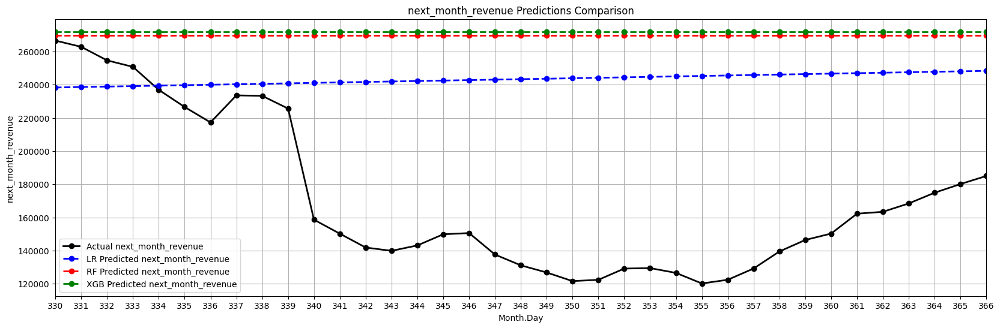

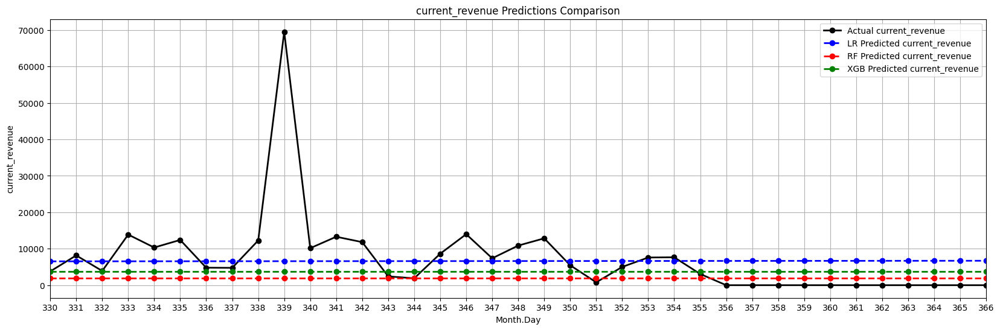

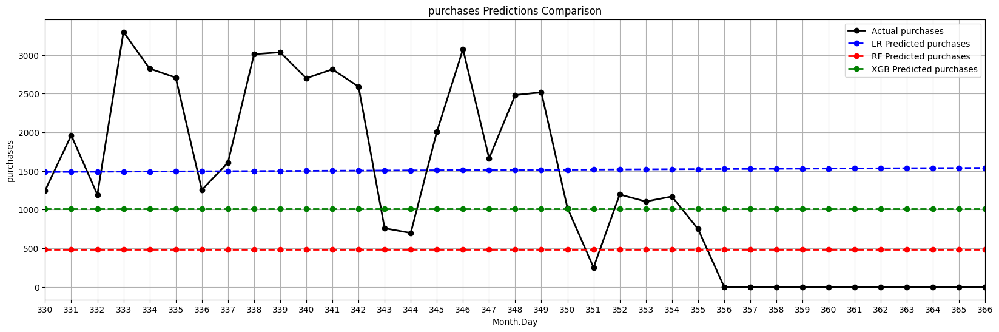

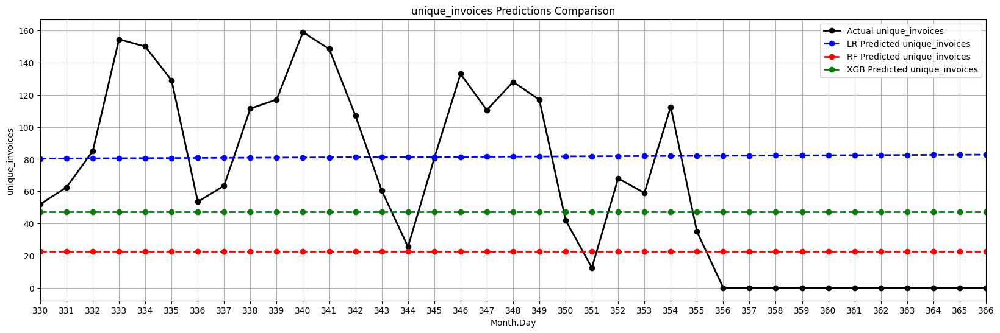

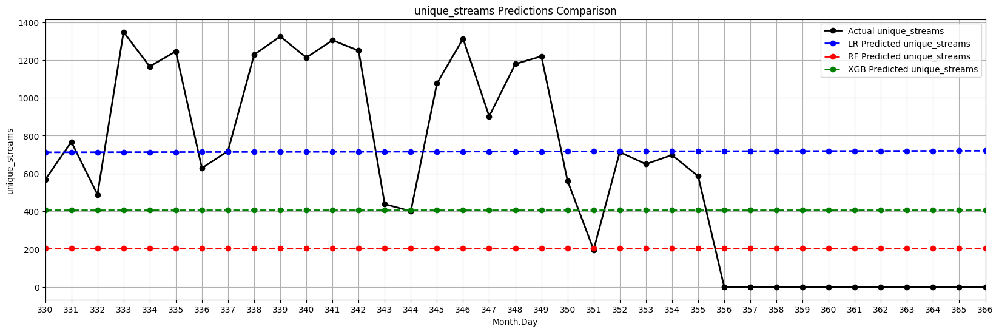

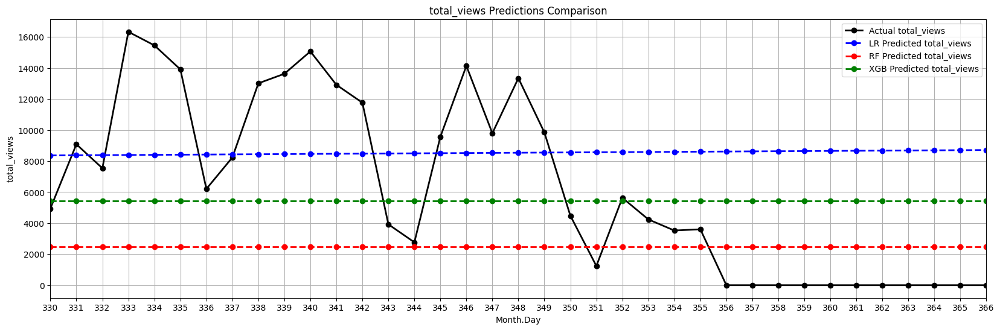

2 - Dataframe df_ts_eire data:


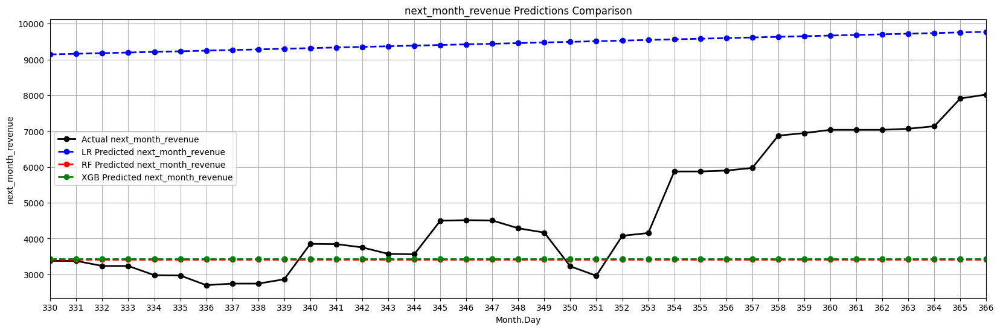

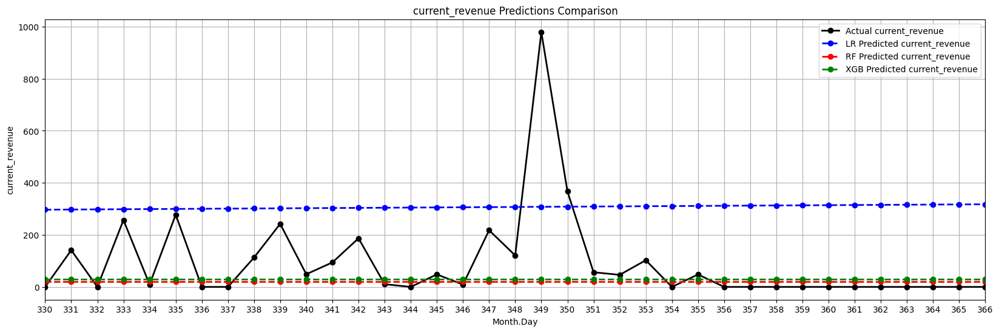

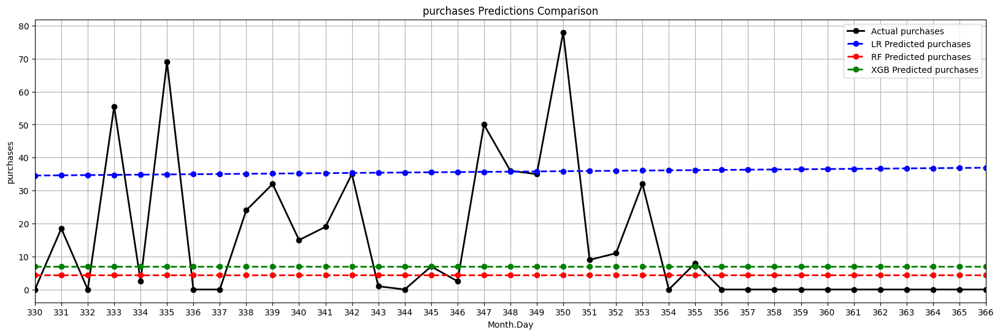

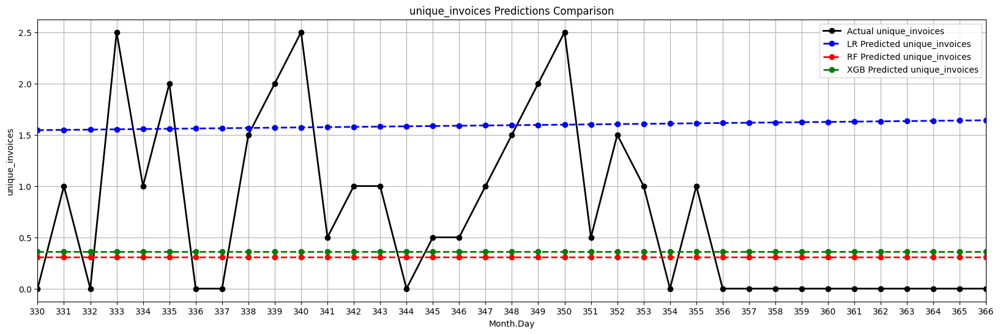

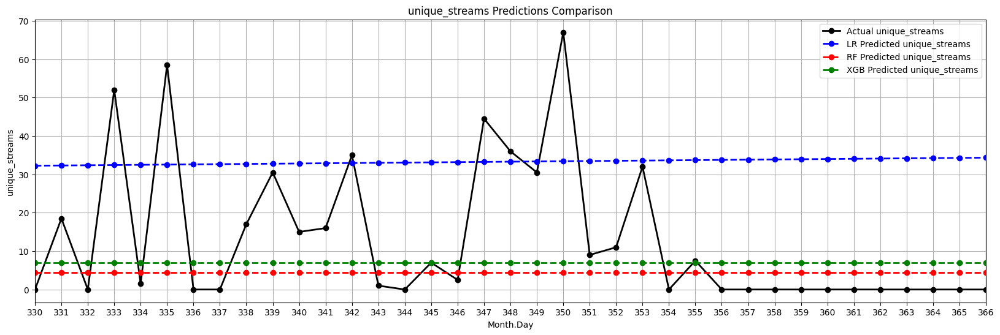

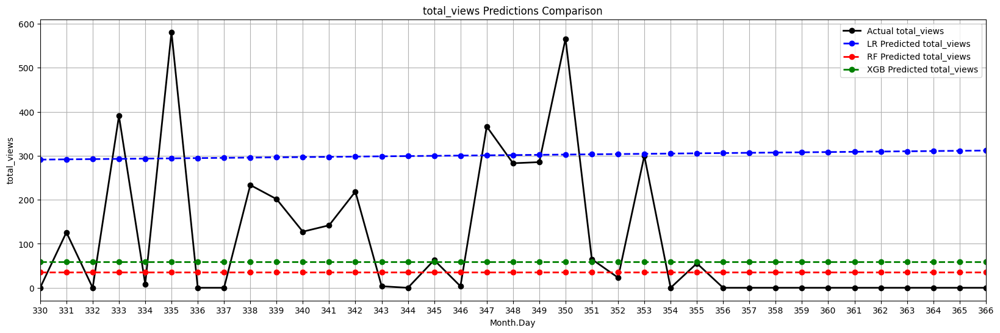

3 - Dataframe df_ts_france data:


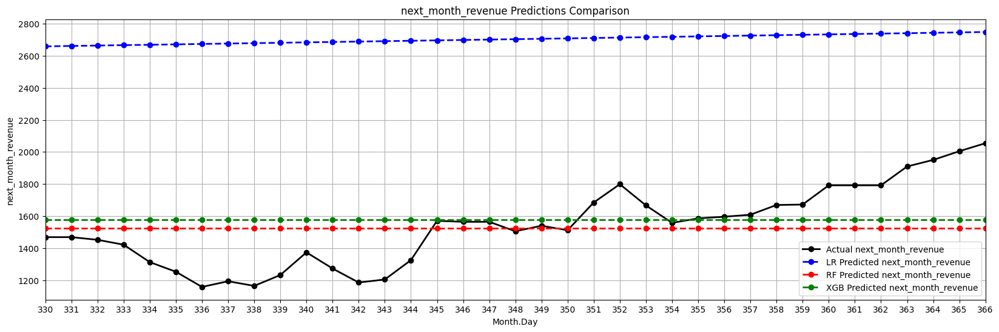

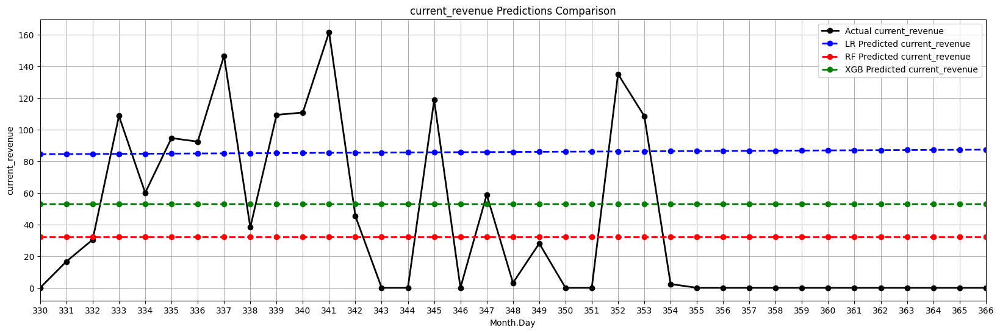

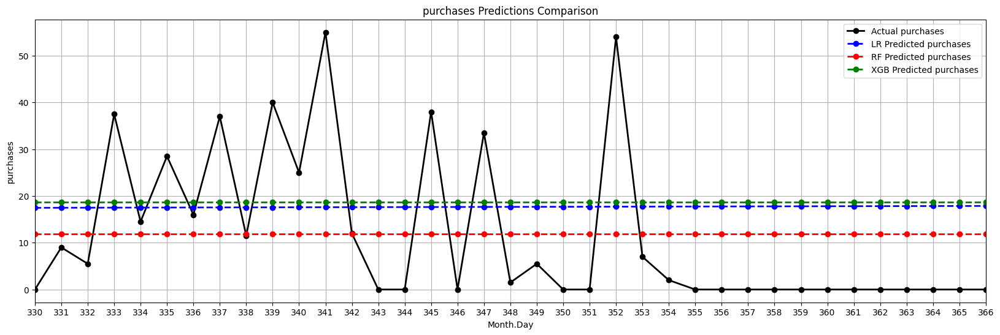

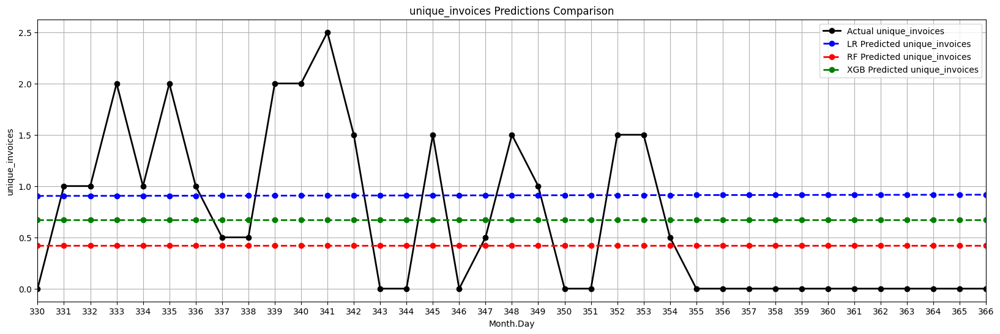

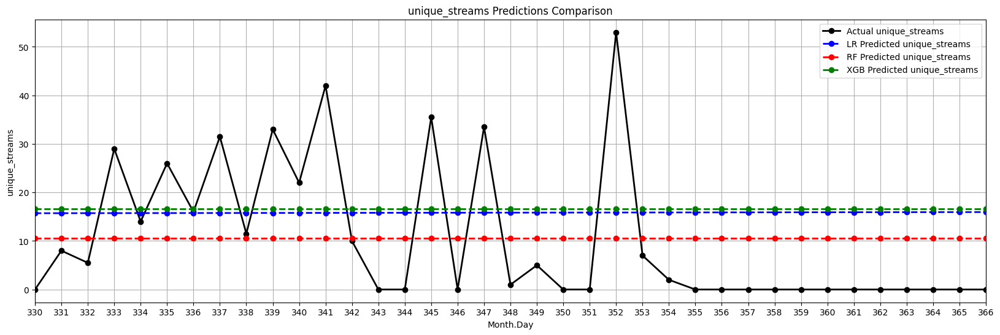

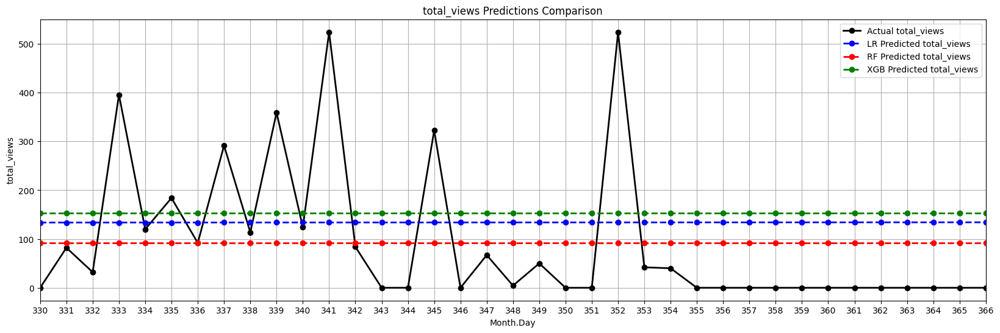

4 - Dataframe df_ts_germany data:


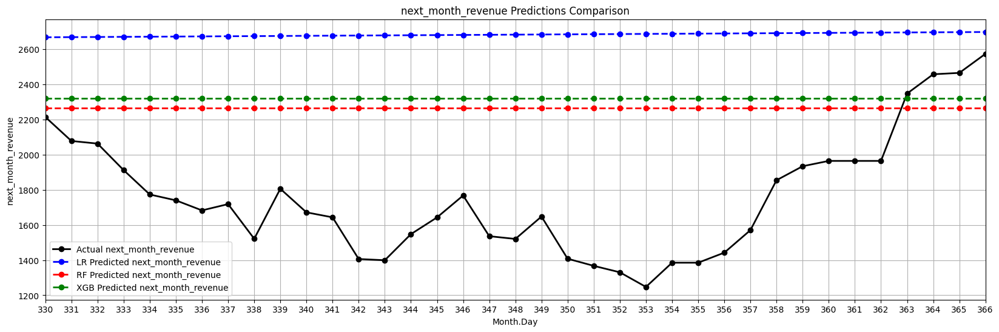

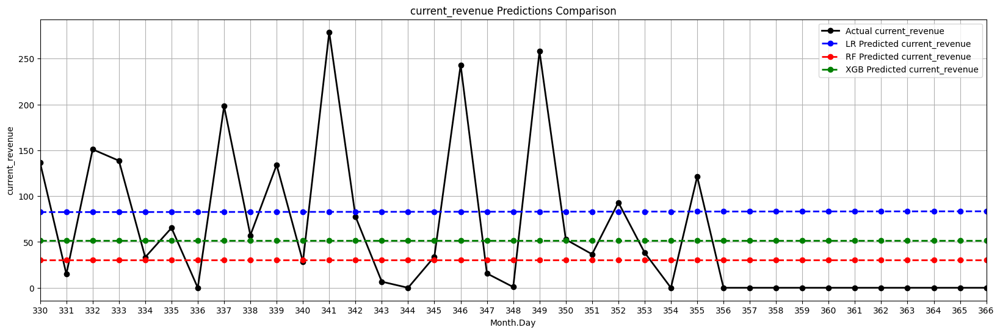

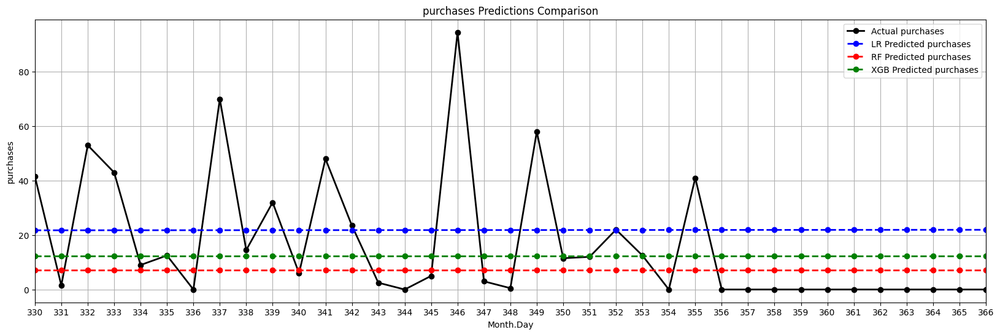

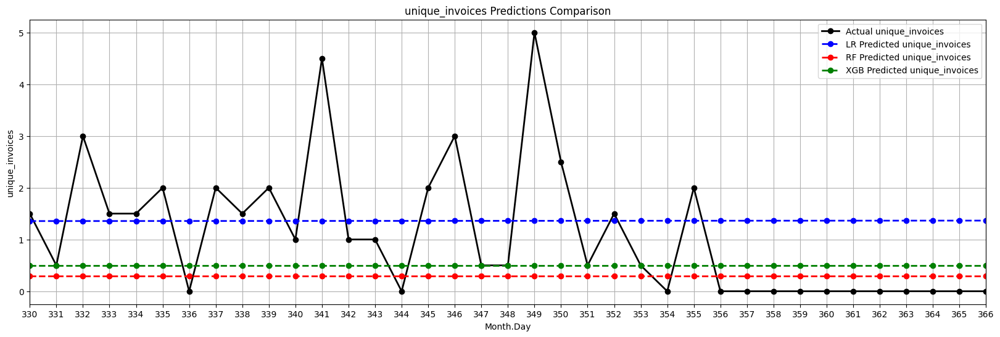

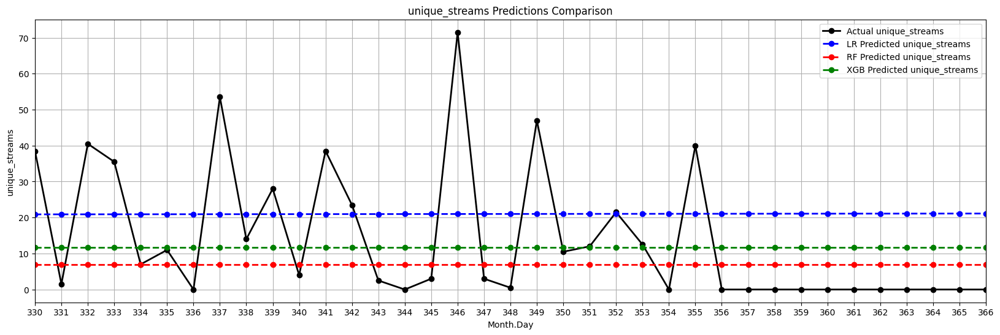

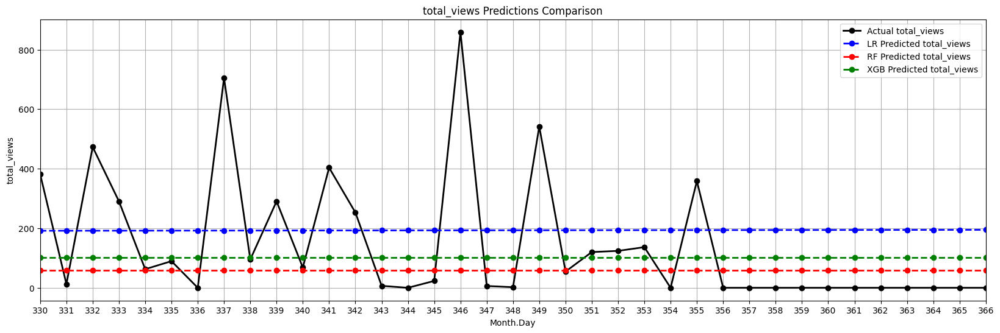

5 - Dataframe df_ts_hong_kong data:


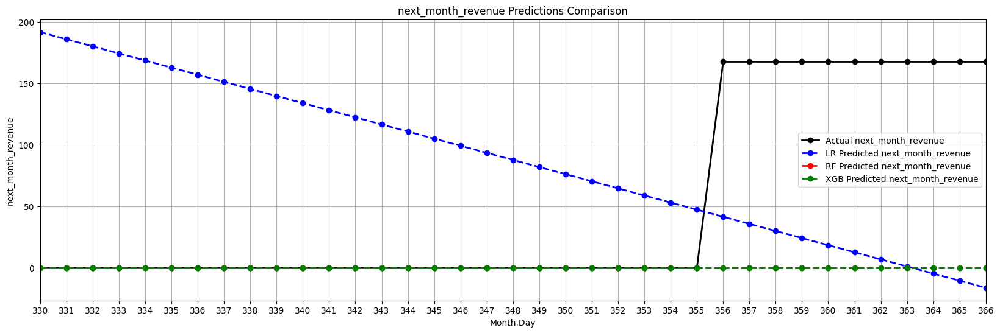

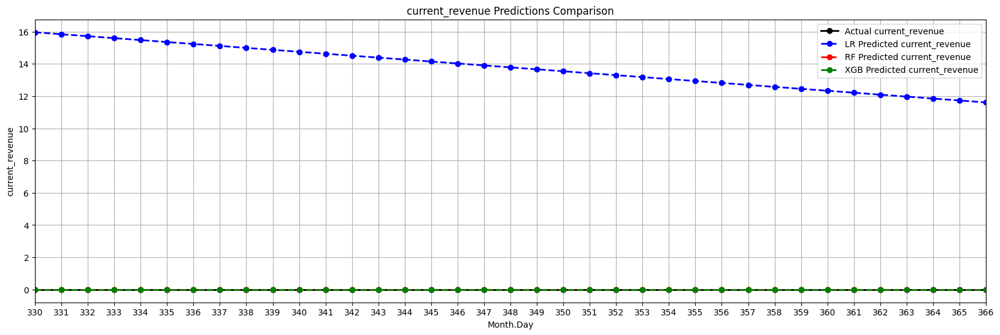

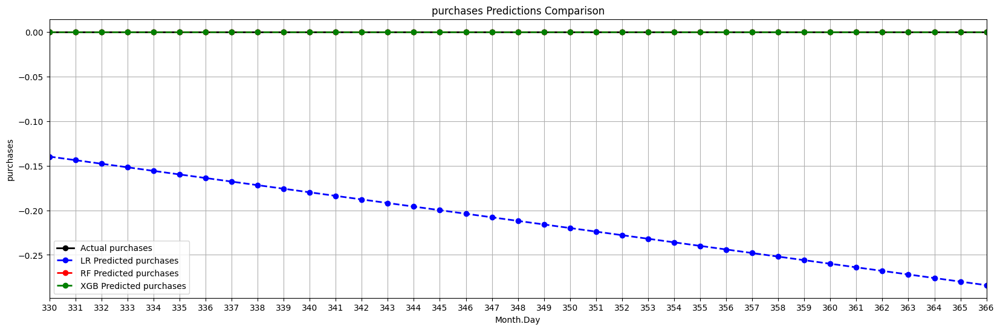

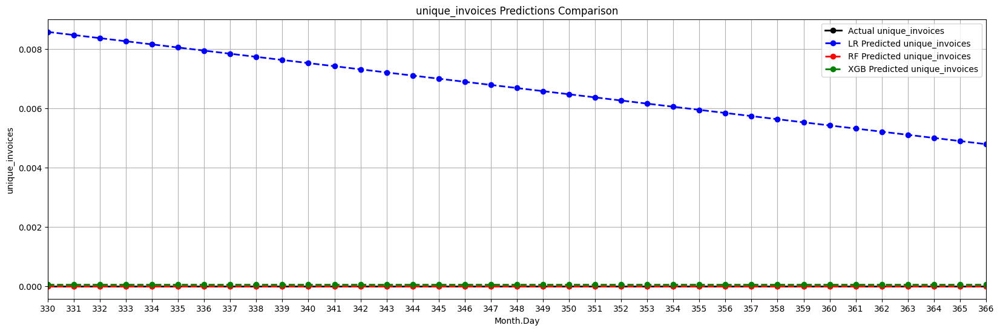

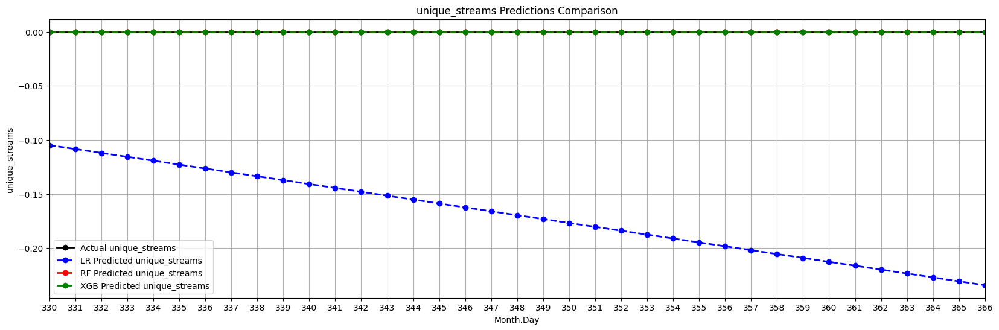

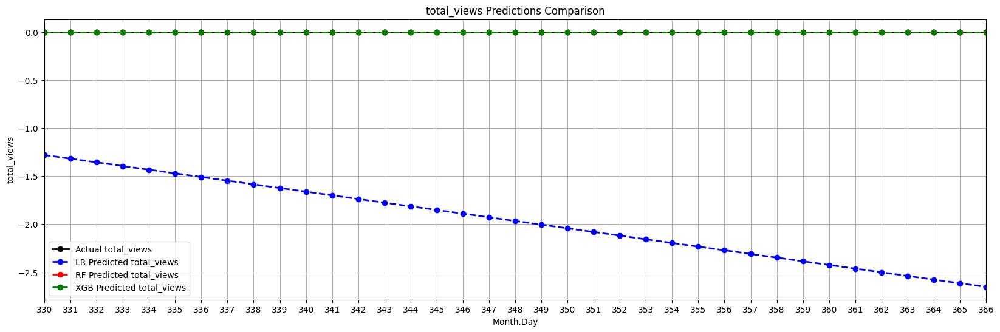

6 - Dataframe df_ts_netherlands data:


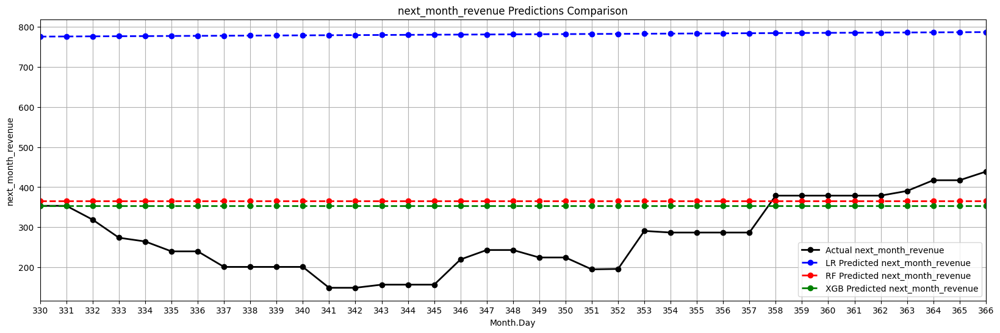

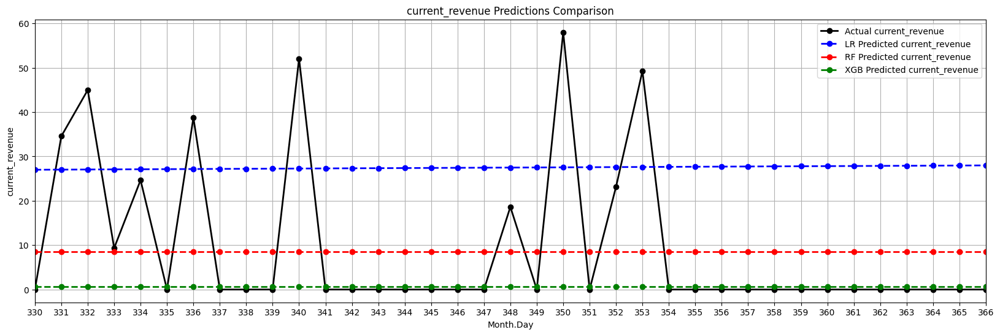

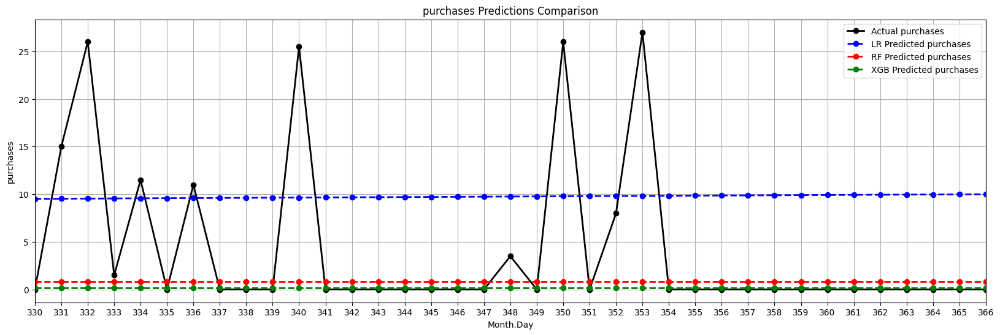

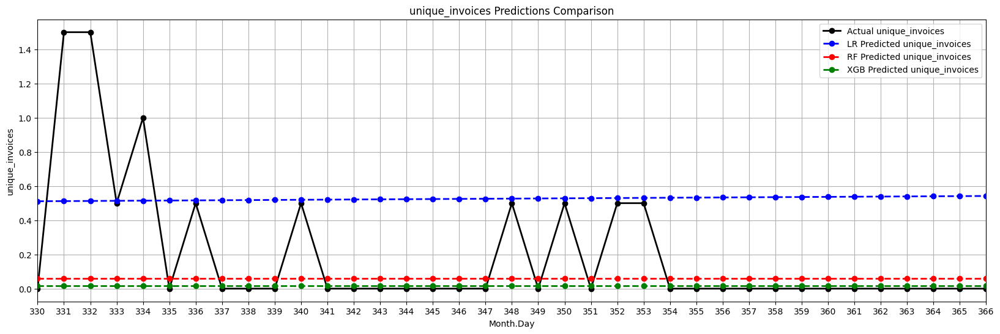

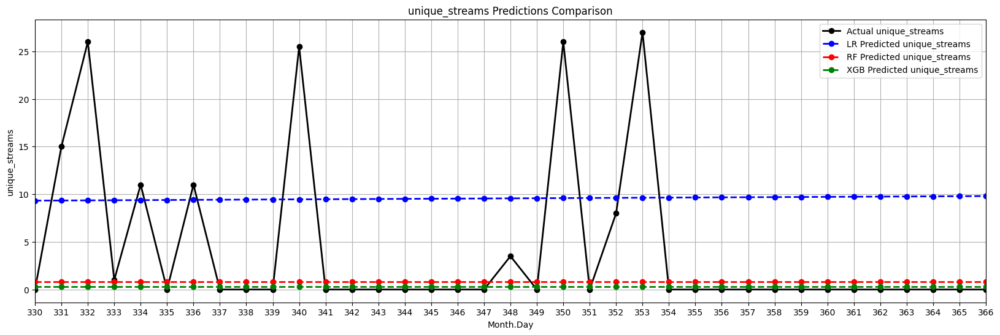

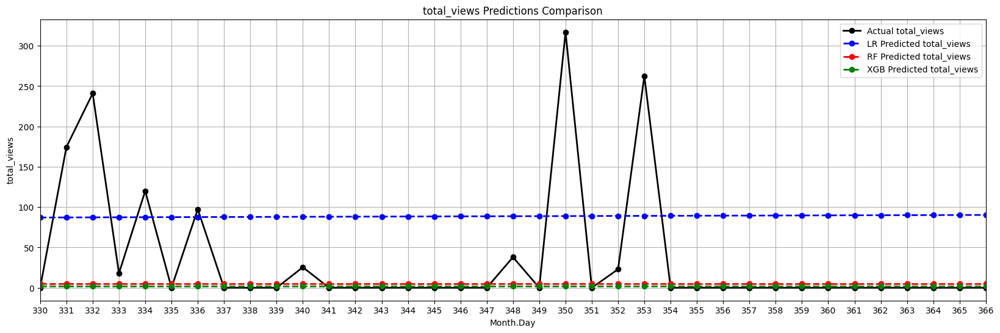

7 - Dataframe df_ts_norway data:


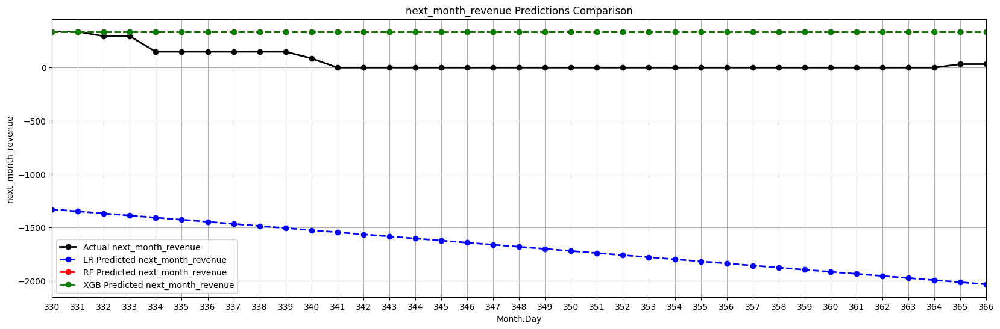

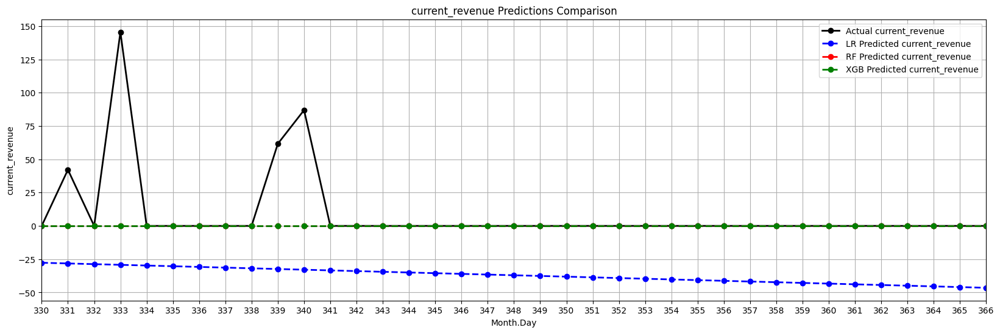

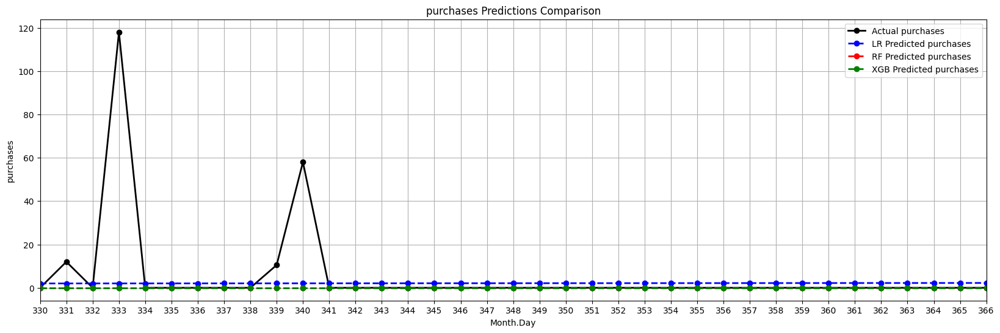

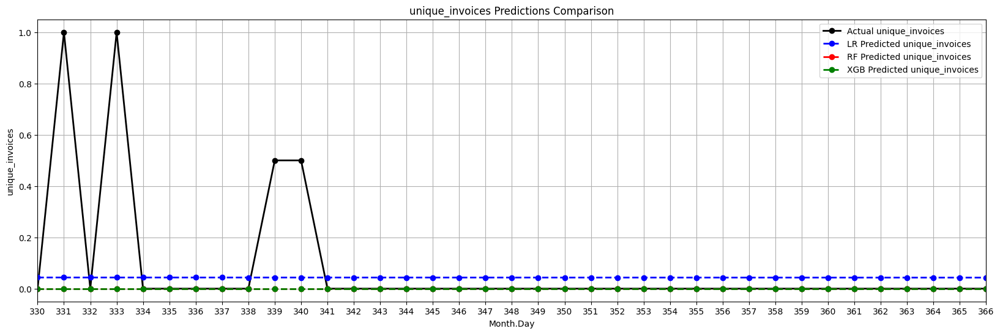

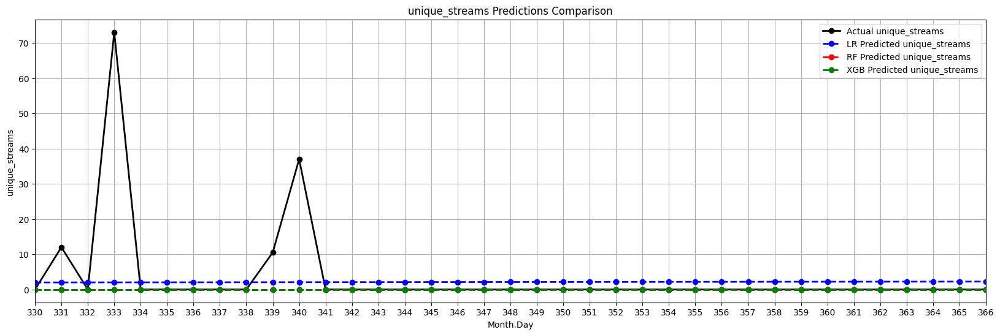

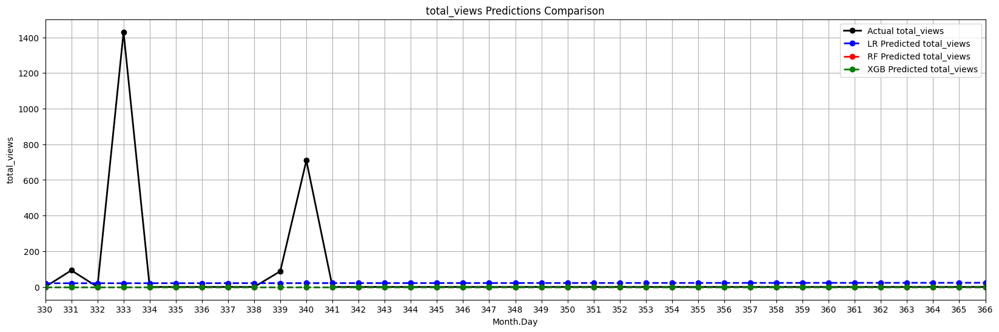

8 - Dataframe df_ts_portugal data:


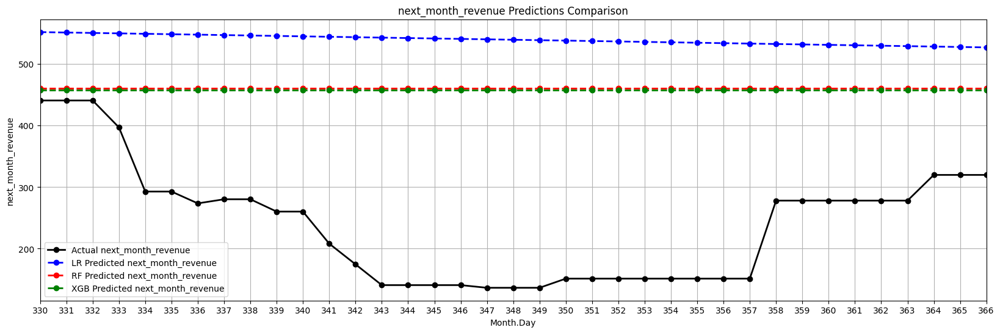

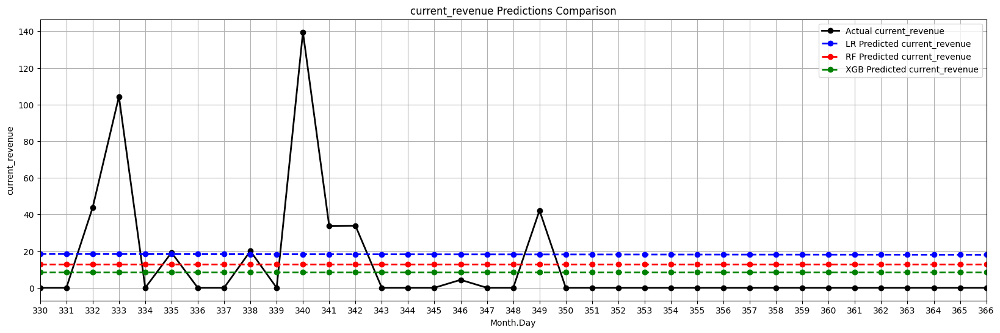

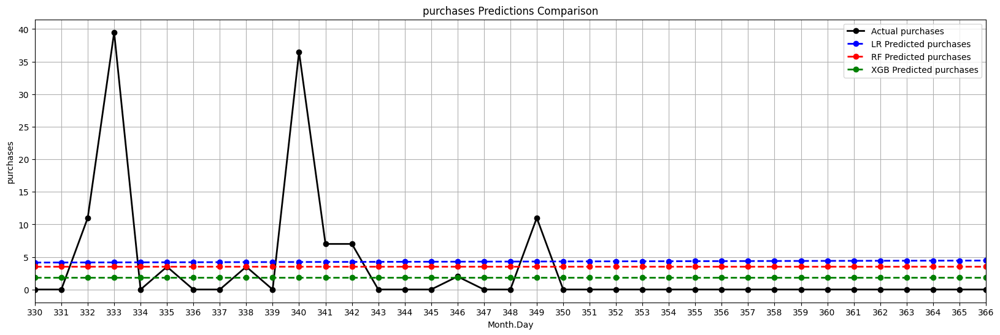

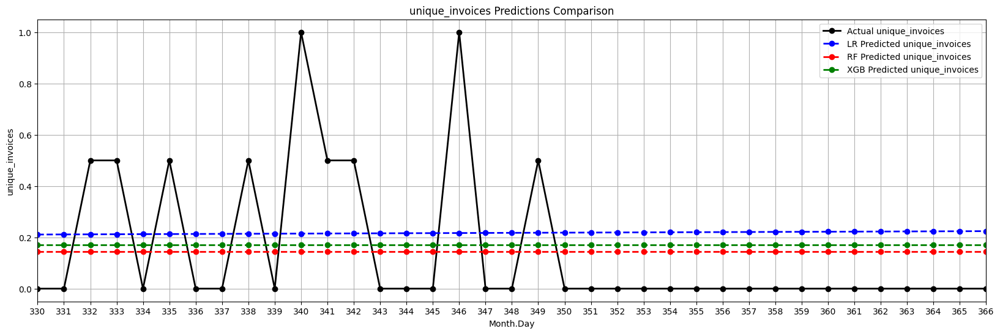

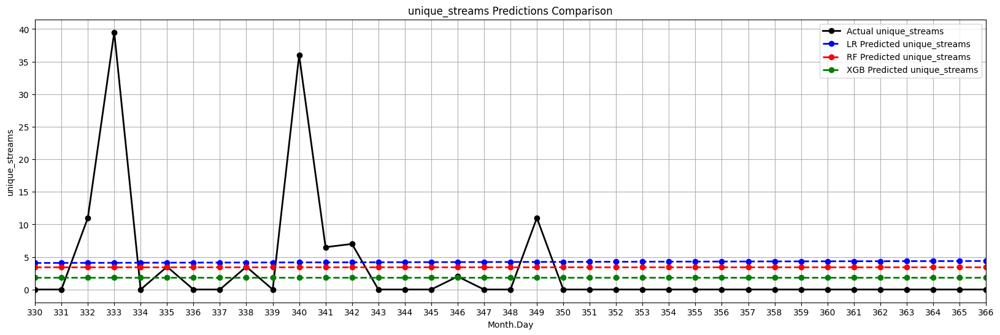

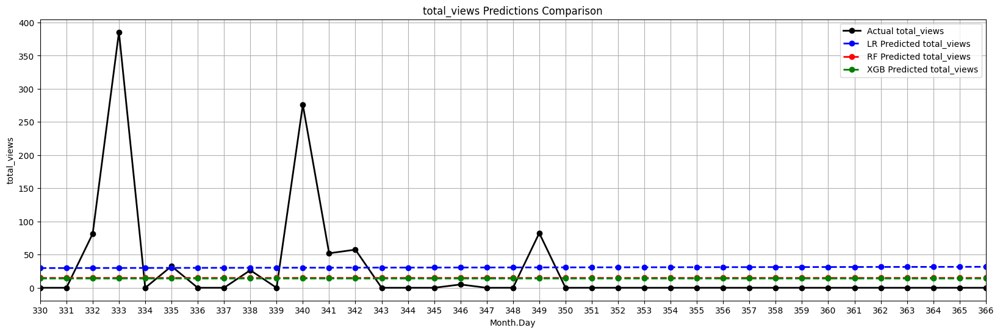

9 - Dataframe df_ts_singapore data:


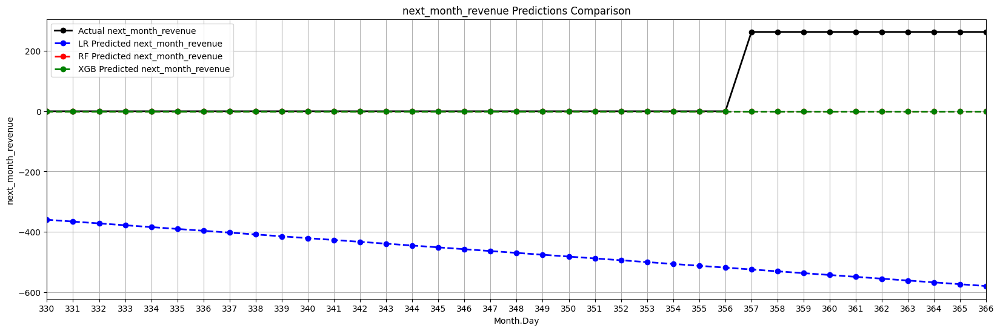

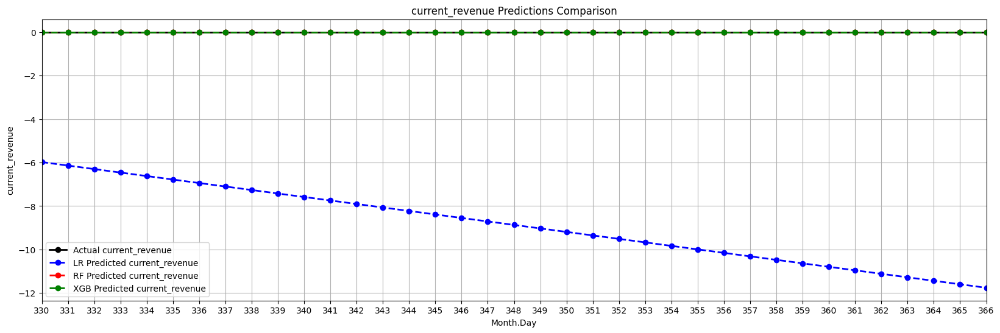

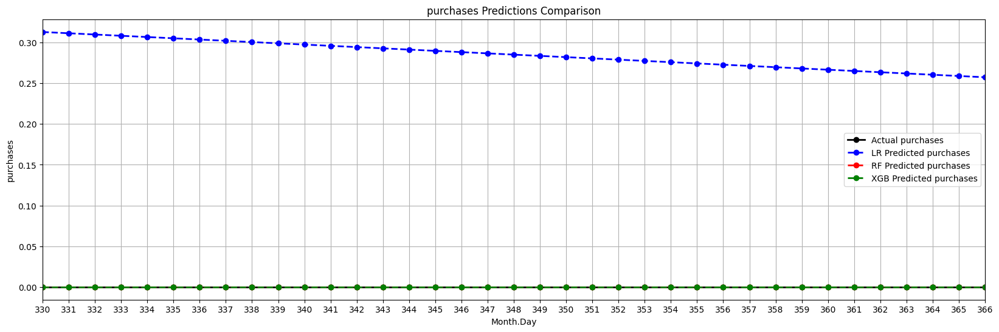

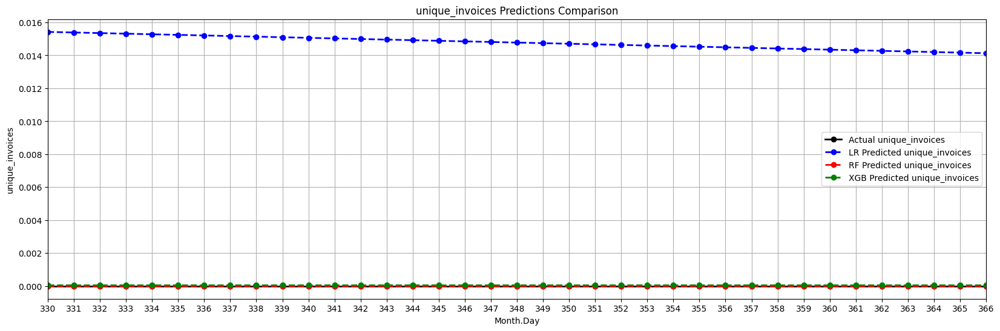

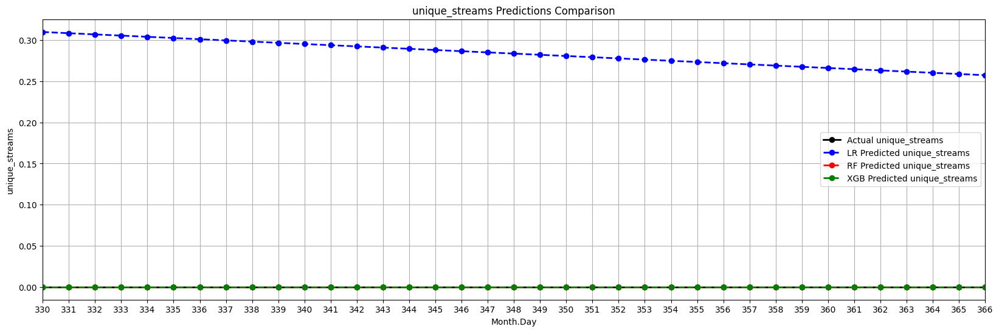

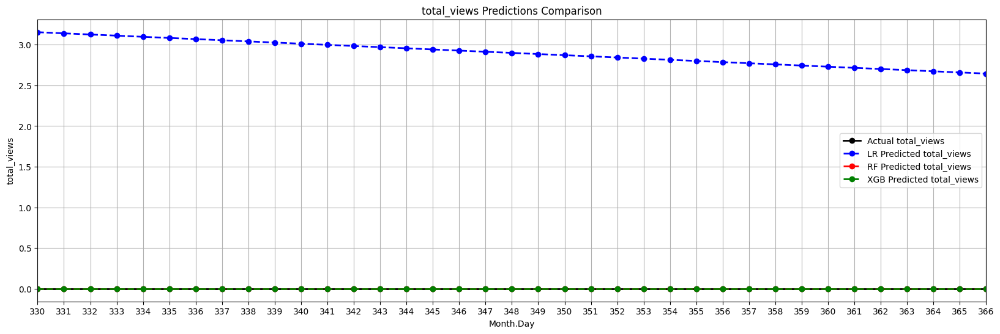

10 - Dataframe df_ts_spain data:


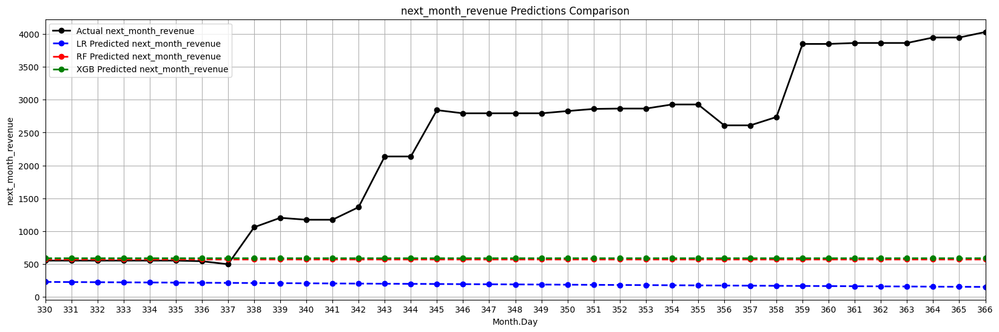

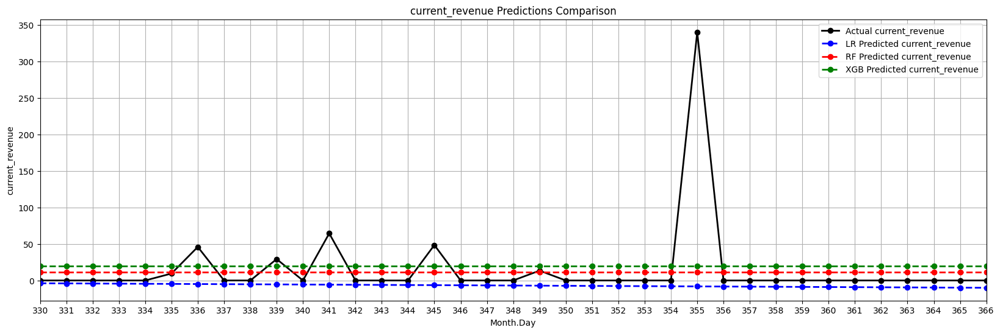

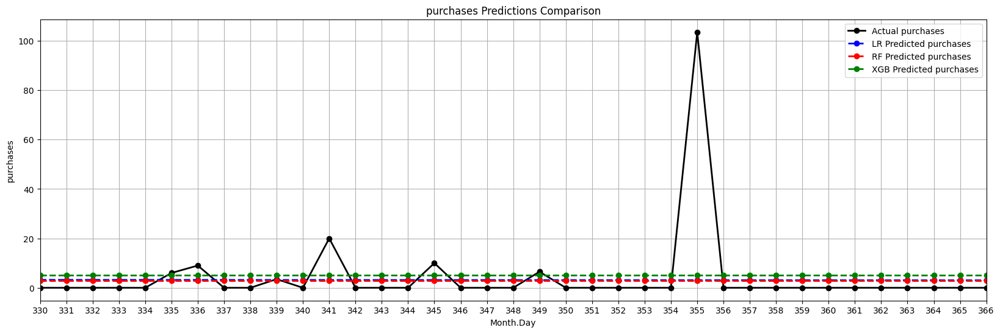

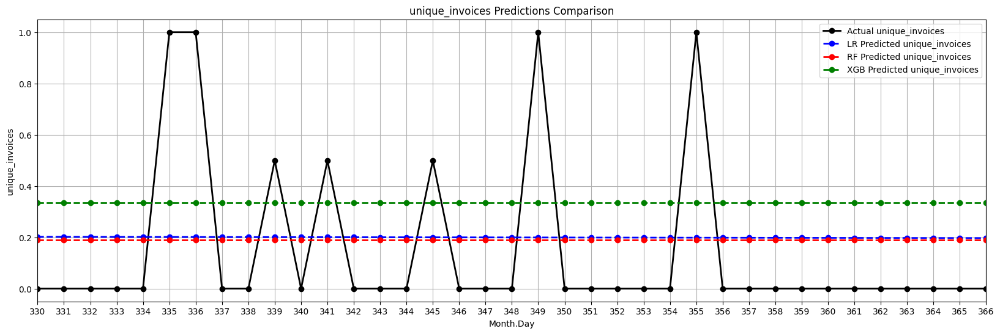

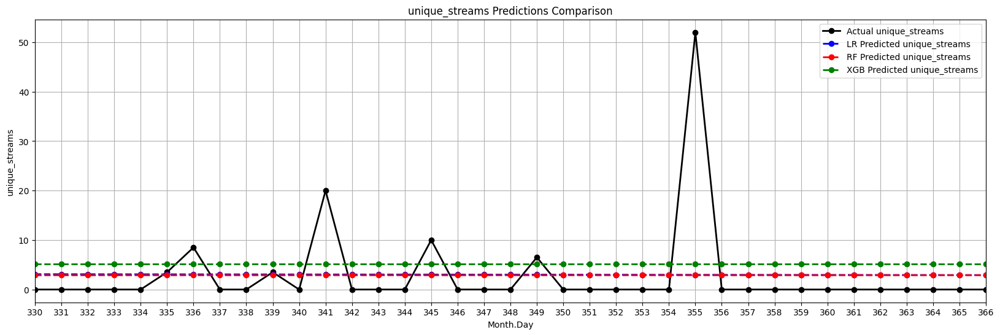

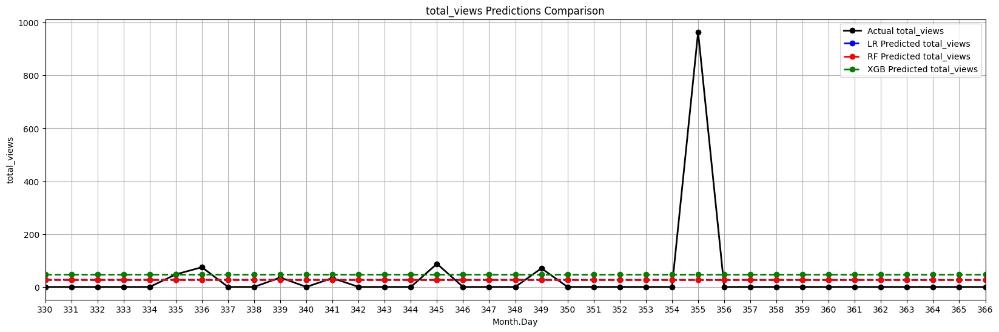

11 - Dataframe df_ts_united_kingdom data:


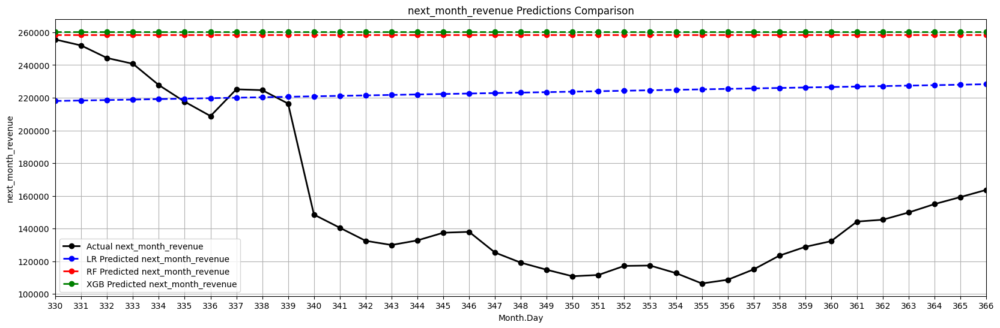

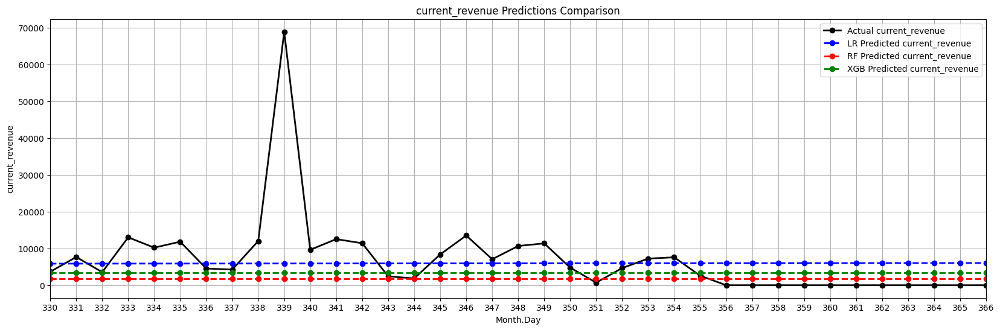

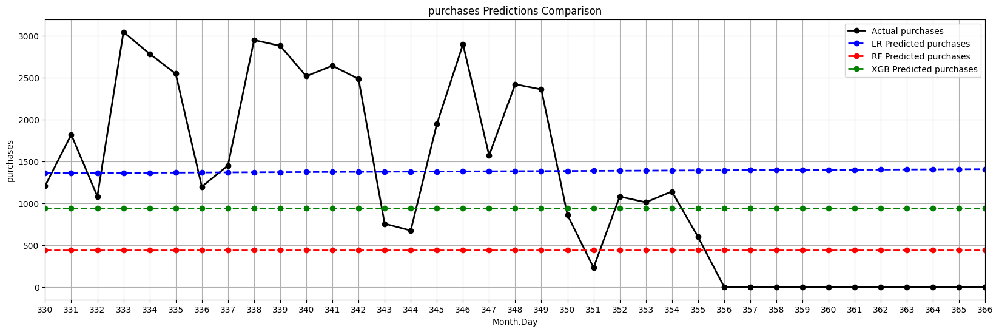

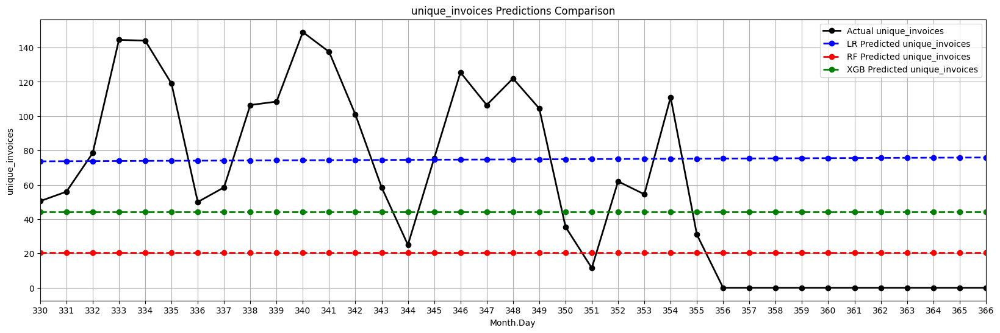

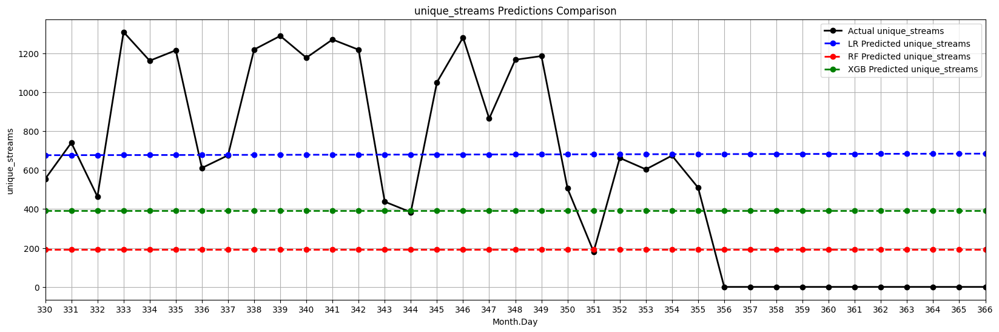

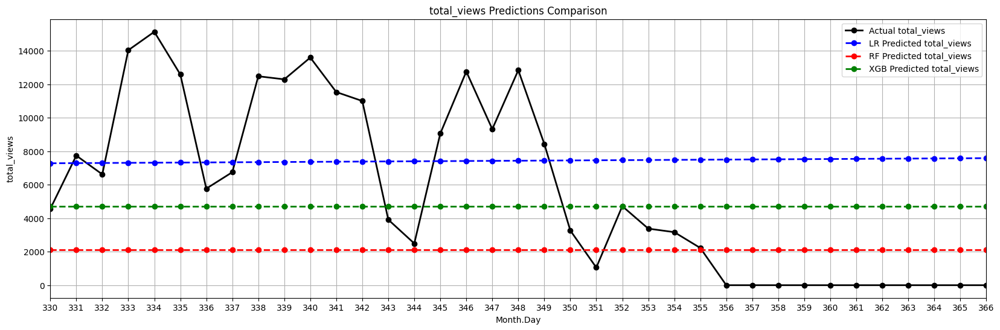

In [34]:
# Plot results for each target
for i in range (0,size):
    df_name = list_ts_df[i]
    print(i+1, '- Dataframe', df_name , 'data:')
    for target in y_test[df_name].columns:
        viz.plot_test_data(X_test[df_name]['day_of_year'], y_test[df_name], y_pred_lr[df_name], y_pred_rf[df_name], y_pred_xgb[df_name], target)

### 3.5-Test the Models with an additionnal single data

In [35]:
#calcualte predicted data using the models for January 3 
#Data to use the model
single_month = 1 
single_day = 3
day_rank = model.calculate_day_of_year(single_month, single_day)
test_date = {'day_of_year': day_rank}
new_test_df = pd.DataFrame(data=test_date, index=([0]))
print (new_test_df)

   day_of_year
0            3


In [36]:
#Use the models for an additionnal prediction
y_test_pred_lr, y_test_pred_rf, y_test_pred_xgb = {}, {}, {}
for i in range (0,size):
    df_name = list_ts_df[i]
    y_test_pred_lr[df_name] = lr_model[df_name].predict(new_test_df)
    y_test_pred_rf[df_name] = rf_model[df_name].predict(new_test_df)   
    y_test_pred_xgb[df_name] = xgb_model[df_name].predict(new_test_df) 

for i in range (0,size):
    df_name = list_ts_df[i]
    #Compare results
    print(i+1, '- Dataframe', df_name , 'data:')
    
    print('\nObserved data')
    print(library_ts_df_dayofyear[df_name]
        [(library_ts_df_dayofyear[df_name]['day_of_year']==test_date['day_of_year'])].T) 
    
    print('\nPredicted data')
    d1 = {
        'purchases'         : [y_test_pred_lr[df_name][0][0],  y_test_pred_rf[df_name][0][0],  y_test_pred_xgb[df_name][0][0]], 
        'unique_invoices'   : [y_test_pred_lr[df_name][0][1],  y_test_pred_rf[df_name][0][1],  y_test_pred_xgb[df_name][0][1]], 
        'unique_streams'    : [y_test_pred_lr[df_name][0][2],  y_test_pred_rf[df_name][0][2],  y_test_pred_xgb[df_name][0][2]], 
        'total_views'       : [y_test_pred_lr[df_name][0][3],  y_test_pred_rf[df_name][0][3],  y_test_pred_xgb[df_name][0][3]],
        'current_revenue'   : [y_test_pred_lr[df_name][0][4],  y_test_pred_rf[df_name][0][4],  y_test_pred_xgb[df_name][0][4]],
        'next_month_revenue': [y_test_pred_lr[df_name][0][5],  y_test_pred_rf[df_name][0][5],  y_test_pred_xgb[df_name][0][5]]
        }
    
    report = pd.DataFrame(data=d1, index=(['Linear Regression', 'Random Forest.', 'XGBoost Model'])) 
    print (report.T)
    print('\n')    

1 - Dataframe df_ts_all data:

Observed data
                             2
day_of_year              3.000
current_month            1.000
current_day              3.000
purchases             1060.500
unique_invoices         46.000
unique_streams         635.000
total_views           6103.000
current_revenue       4449.060
next_month_revenue  168808.037
next_month               2.000
next_day                 3.000

Predicted data
                    Linear Regression  Random Forest.  XGBoost Model
purchases               147259.410148     176920.5814  168845.265625
unique_invoices           5075.648794      10035.8669    4534.338867
unique_streams            1004.659186       1154.3400    1060.989258
total_views                 58.165349         52.8200      50.616684
current_revenue            638.820125        708.2650     643.253296
next_month_revenue        5194.934973       6418.2050    6088.471680


2 - Dataframe df_ts_eire data:

Observed data
                           2
day_of_

## 4-Create and Test 3 One target regression Models 
This strategy consists of a multiple regression that predicts only one target based on multiple independent variables. This is the most common way to perform regression. 

### 4.1.-Split data into predictors (X) and target (y)

In [37]:
# Split the data into features and target
# X = X[df_name] and y = [df_name]
X = {}
y = {}
for i in range (0,size):
    df_name = list_ts_df[i]
    X[df_name], y[df_name] = model.split_into_predictors_targets(library_ts_df_dayofyear[df_name], 6)
    print(i+1, '- Dataframe', df_name , 'was successfully splitted')
    print("SHAPE OF THE DATA: ")
    print("Number of (rows, column) X : " + str((X[df_name]).shape))
    print("Number of (row, columns) y : " + str((y[df_name]).shape))
    print('\n')

1 - Dataframe df_ts_all was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) X : (365, 6)
Number of (row, columns) y : (365, 1)


2 - Dataframe df_ts_eire was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) X : (365, 6)
Number of (row, columns) y : (365, 1)


3 - Dataframe df_ts_france was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) X : (365, 6)
Number of (row, columns) y : (365, 1)


4 - Dataframe df_ts_germany was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) X : (365, 6)
Number of (row, columns) y : (365, 1)


5 - Dataframe df_ts_hong_kong was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) X : (365, 6)
Number of (row, columns) y : (365, 1)


6 - Dataframe df_ts_netherlands was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) X : (365, 6)
Number of (row, columns) y : (365, 1)


7 - Dataframe df_ts_norway was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, 

### 4.2.-Split data into training (X_train, y_train) and test (X_test, y_test) sets 

In [38]:
# Randomly split the data into 80% for training and 20% for test sets
# X_train=X_train[df_name] , y_train=y_train[df_name], X_test=X_test[df_name] and y_test=y_test[df_name]
X_train, X_test , y_train , y_test = {}, {}, {}, {}
for i in range (0,size):
    df_name = list_ts_df[i]
    X_train[df_name], X_test[df_name], y_train[df_name], y_test[df_name] = model.split_into_training_test(X[df_name], y[df_name])
    print(i+1, '- Dataframe', df_name , 'was successfully splitted')
    print("SHAPE OF THE DATA: ")
    print("Number of (rows, column) Xtrain : " + str((X_train[df_name]).shape))
    print("Number of (row, columns) Xtest : " + str((X_test[df_name]).shape))
    print("Number of (rows, column) ytrain : " + str((y_train[df_name]).shape))
    print("Number of (row, columns) ytest : " + str((y_test[df_name]).shape))
    print('\n')

1 - Dataframe df_ts_all was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) Xtrain : (328, 6)
Number of (row, columns) Xtest : (37, 6)
Number of (rows, column) ytrain : (328, 1)
Number of (row, columns) ytest : (37, 1)


2 - Dataframe df_ts_eire was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) Xtrain : (328, 6)
Number of (row, columns) Xtest : (37, 6)
Number of (rows, column) ytrain : (328, 1)
Number of (row, columns) ytest : (37, 1)


3 - Dataframe df_ts_france was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) Xtrain : (328, 6)
Number of (row, columns) Xtest : (37, 6)
Number of (rows, column) ytrain : (328, 1)
Number of (row, columns) ytest : (37, 1)


4 - Dataframe df_ts_germany was successfully splitted
SHAPE OF THE DATA: 
Number of (rows, column) Xtrain : (328, 6)
Number of (row, columns) Xtest : (37, 6)
Number of (rows, column) ytrain : (328, 1)
Number of (row, columns) ytest : (37, 1)


5 - Dataframe df_ts_hong_kong wa

In [39]:
#Sort in ascending to be able to plot appropiate time-series visualizationabs
for i in range (0,size):
    df_name = list_ts_df[i]
    X_train[df_name]=X_train[df_name].sort_index(ascending=True)
    X_test[df_name] =X_test [df_name].sort_index(ascending=True)
    y_train[df_name]=y_train[df_name].sort_index(ascending=True)
    y_test[df_name] =y_test [df_name].sort_index(ascending=True)

### 4.3.-Train Predict and Evaluate 3 models

In [40]:
# Train, predict, and evaluate each model
y_pred_lr , y_pred_rf , y_pred_xgb , lr_model , rf_model, xgb_model = {}, {}, {}, {}, {}, {}
for i in range (0,size):
    df_name = list_ts_df[i]
    print(i+1, '- The model of Dataframe', df_name , 'was successfully trained, used to predict and evaluated as follows:\n')
    y_pred_lr[df_name], y_pred_rf[df_name], y_pred_xgb[df_name], lr_model[df_name], rf_model[df_name], xgb_model[df_name] = model.train_predict_evaluate(X_train[df_name], y_train[df_name], X_test[df_name], y_test[df_name], 1)
    print('\n') 

1 - The model of Dataframe df_ts_all was successfully trained, used to predict and evaluated as follows:



C:\Users\MDA\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Linear Regression Model:
Mean Absolute Error (MAE): 71991.24
Mean Squared Error (MSE) : 6361149625.34
Root Mean-Square Error (RMSE) : 79756.82
Coefficient of Determination (R2) : -1.96

Random Forest Model:
Mean Absolute Error (MAE): 96847.74
Mean Squared Error (MSE) : 11654151659.46
Root Mean-Square Error (RMSE) : 107954.40
Coefficient of Determination (R2) : -4.42

XGBoost Model:
Mean Absolute Error (MAE): 100682.98
Mean Squared Error (MSE) : 12174680064.00
Root Mean-Square Error (RMSE) : 110338.93
Coefficient of Determination (R2) : -4.67

Evaluation Summary : 
                          MAE           MSE           RMSE        R2
Linear          71991.239701  6.361150e+09   79756.815542 -1.960992
Random Forest   96847.737235  1.165415e+10  107954.396203 -4.424783
XGBoost        100682.984375  1.217468e+10  110338.932676 -4.667078


2 - The model of Dataframe df_ts_eire was successfully trained, used to predict and evaluated as follows:



C:\Users\MDA\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Linear Regression Model:
Mean Absolute Error (MAE): 4127.11
Mean Squared Error (MSE) : 20897239.02
Root Mean-Square Error (RMSE) : 4571.35
Coefficient of Determination (R2) : -6.36

Random Forest Model:
Mean Absolute Error (MAE): 1529.65
Mean Squared Error (MSE) : 4478246.42
Root Mean-Square Error (RMSE) : 2116.19
Coefficient of Determination (R2) : -0.58

XGBoost Model:
Mean Absolute Error (MAE): 1531.69
Mean Squared Error (MSE) : 4461023.50
Root Mean-Square Error (RMSE) : 2112.11
Coefficient of Determination (R2) : -0.57

Evaluation Summary : 
                        MAE           MSE         RMSE        R2
Linear         4127.113978  2.089724e+07  4571.349802 -6.359982
Random Forest  1529.654673  4.478246e+06  2116.186764 -0.577233
XGBoost        1531.687744  4.461024e+06  2112.113515 -0.571167


3 - The model of Dataframe df_ts_france was successfully trained, used to predict and evaluated as follows:



C:\Users\MDA\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Linear Regression Model:
Mean Absolute Error (MAE): 1175.51
Mean Squared Error (MSE) : 1419004.95
Root Mean-Square Error (RMSE) : 1191.22
Coefficient of Determination (R2) : -23.12

Random Forest Model:
Mean Absolute Error (MAE): 206.29
Mean Squared Error (MSE) : 64971.81
Root Mean-Square Error (RMSE) : 254.90
Coefficient of Determination (R2) : -0.10

XGBoost Model:
Mean Absolute Error (MAE): 216.50
Mean Squared Error (MSE) : 70479.23
Root Mean-Square Error (RMSE) : 265.48
Coefficient of Determination (R2) : -0.20

Evaluation Summary : 
                        MAE           MSE         RMSE         R2
Linear         1175.506101  1.419005e+06  1191.219941 -23.123521
Random Forest   206.288259  6.497181e+04   254.895678  -0.104541
XGBoost         216.501419  7.047923e+04   265.479239  -0.198169


4 - The model of Dataframe df_ts_germany was successfully trained, used to predict and evaluated as follows:



C:\Users\MDA\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Linear Regression Model:
Mean Absolute Error (MAE): 910.10
Mean Squared Error (MSE) : 951463.45
Root Mean-Square Error (RMSE) : 975.43
Coefficient of Determination (R2) : -7.29

Random Forest Model:
Mean Absolute Error (MAE): 560.83
Mean Squared Error (MSE) : 385803.00
Root Mean-Square Error (RMSE) : 621.13
Coefficient of Determination (R2) : -2.36

XGBoost Model:
Mean Absolute Error (MAE): 614.12
Mean Squared Error (MSE) : 460624.16
Root Mean-Square Error (RMSE) : 678.69
Coefficient of Determination (R2) : -3.01

Evaluation Summary : 
                       MAE            MSE        RMSE        R2
Linear         910.104197  951463.452744  975.429881 -7.290390
Random Forest  560.830705  385803.002567  621.130423 -2.361619
XGBoost        614.116089  460624.156250  678.692976 -3.013558


5 - The model of Dataframe df_ts_hong_kong was successfully trained, used to predict and evaluated as follows:

Linear Regression Model:
Mean Absolute Error (MAE): 124.32
Mean Squared Error (MSE) : 17724

C:\Users\MDA\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
C:\Users\MDA\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Linear Regression Model:
Mean Absolute Error (MAE): 496.37
Mean Squared Error (MSE) : 253601.97
Root Mean-Square Error (RMSE) : 503.59
Coefficient of Determination (R2) : -33.68

Random Forest Model:
Mean Absolute Error (MAE): 122.42
Mean Squared Error (MSE) : 20265.65
Root Mean-Square Error (RMSE) : 142.36
Coefficient of Determination (R2) : -1.77

XGBoost Model:
Mean Absolute Error (MAE): 108.07
Mean Squared Error (MSE) : 15471.57
Root Mean-Square Error (RMSE) : 124.38
Coefficient of Determination (R2) : -1.12

Evaluation Summary : 
                       MAE            MSE        RMSE         R2
Linear         496.372028  253601.965091  503.589084 -33.681493
Random Forest  122.423462   20265.651635  142.357478  -1.771442
XGBoost        108.073219   15471.572266  124.384775  -1.115824


7 - The model of Dataframe df_ts_norway was successfully trained, used to predict and evaluated as follows:

Linear Regression Model:
Mean Absolute Error (MAE): 3487.33
Mean Squared Error (MSE) : 7349

C:\Users\MDA\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
C:\Users\MDA\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Linear Regression Model:
Mean Absolute Error (MAE): 291.84
Mean Squared Error (MSE) : 94954.78
Root Mean-Square Error (RMSE) : 308.15
Coefficient of Determination (R2) : -9.83

Random Forest Model:
Mean Absolute Error (MAE): 223.35
Mean Squared Error (MSE) : 58619.03
Root Mean-Square Error (RMSE) : 242.11
Coefficient of Determination (R2) : -5.68

XGBoost Model:
Mean Absolute Error (MAE): 219.99
Mean Squared Error (MSE) : 56925.79
Root Mean-Square Error (RMSE) : 238.59
Coefficient of Determination (R2) : -5.49

Evaluation Summary : 
                       MAE           MSE        RMSE        R2
Linear         291.840686  94954.778967  308.147333 -9.825517
Random Forest  223.347445  58619.026923  242.113665 -5.682984
XGBoost        219.988846  56925.785156  238.591251 -5.489943


9 - The model of Dataframe df_ts_singapore was successfully trained, used to predict and evaluated as follows:

Linear Regression Model:
Mean Absolute Error (MAE): 542.81
Mean Squared Error (MSE) : 324246.53
Ro

C:\Users\MDA\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
C:\Users\MDA\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Linear Regression Model:
Mean Absolute Error (MAE): 2177.96
Mean Squared Error (MSE) : 6820162.51
Root Mean-Square Error (RMSE) : 2611.54
Coefficient of Determination (R2) : -3.58

Random Forest Model:
Mean Absolute Error (MAE): 1739.02
Mean Squared Error (MSE) : 4471607.27
Root Mean-Square Error (RMSE) : 2114.62
Coefficient of Determination (R2) : -2.00

XGBoost Model:
Mean Absolute Error (MAE): 1729.53
Mean Squared Error (MSE) : 4421824.50
Root Mean-Square Error (RMSE) : 2102.81
Coefficient of Determination (R2) : -1.97

Evaluation Summary : 
                        MAE           MSE         RMSE        R2
Linear         2177.963858  6.820163e+06  2611.544086 -3.580034
Random Forest  1739.024689  4.471607e+06  2114.617523 -2.002878
XGBoost        1729.529297  4.421824e+06  2102.813472 -1.969447


11 - The model of Dataframe df_ts_united_kingdom was successfully trained, used to predict and evaluated as follows:



C:\Users\MDA\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Linear Regression Model:
Mean Absolute Error (MAE): 70926.42
Mean Squared Error (MSE) : 6184747542.29
Root Mean-Square Error (RMSE) : 78643.17
Coefficient of Determination (R2) : -1.74

Random Forest Model:
Mean Absolute Error (MAE): 90637.04
Mean Squared Error (MSE) : 10578003857.86
Root Mean-Square Error (RMSE) : 102849.42
Coefficient of Determination (R2) : -3.68

XGBoost Model:
Mean Absolute Error (MAE): 88207.73
Mean Squared Error (MSE) : 10034798592.00
Root Mean-Square Error (RMSE) : 100173.84
Coefficient of Determination (R2) : -3.44

Evaluation Summary : 
                         MAE           MSE           RMSE        R2
Linear         70926.417361  6.184748e+09   78643.165897 -1.738337
Random Forest  90637.039213  1.057800e+10  102849.423226 -3.683480
XGBoost        88207.726562  1.003480e+10  100173.841855 -3.442972




### 3.4.-Plot test data observed and predicted with the 3 models

1 - Dataframe df_ts_all data:


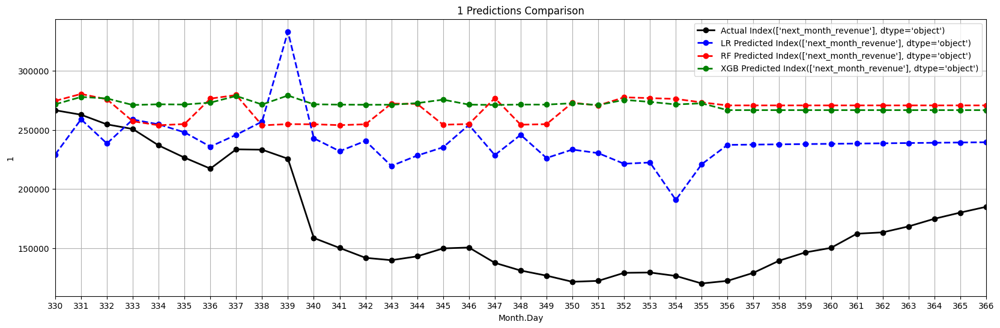

2 - Dataframe df_ts_eire data:


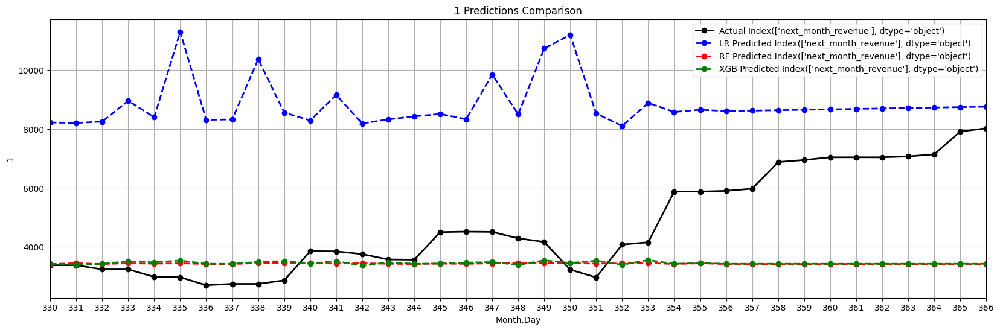

3 - Dataframe df_ts_france data:


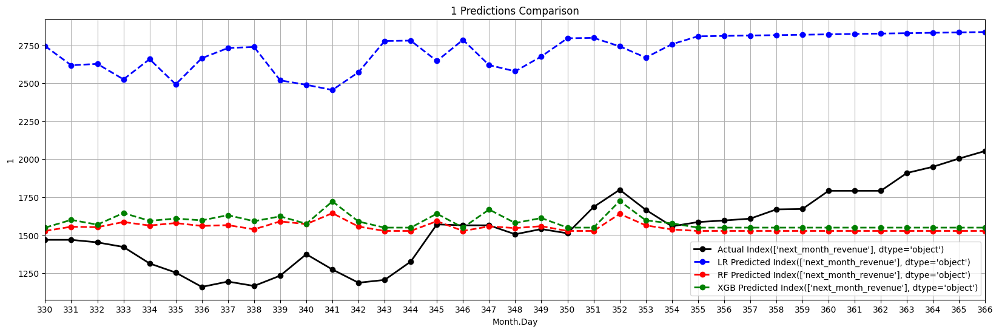

4 - Dataframe df_ts_germany data:


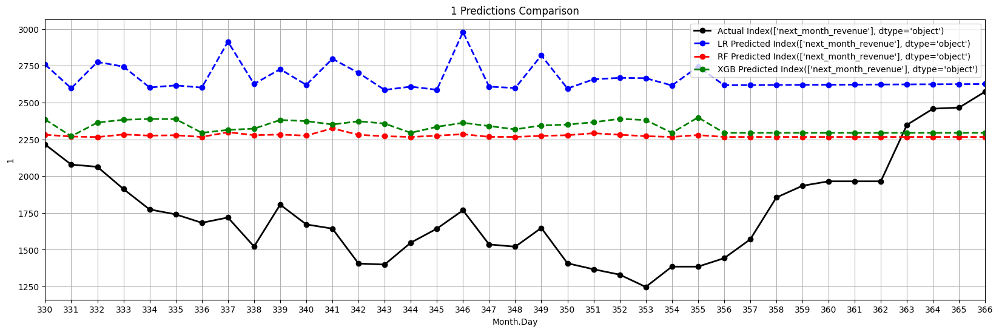

5 - Dataframe df_ts_hong_kong data:


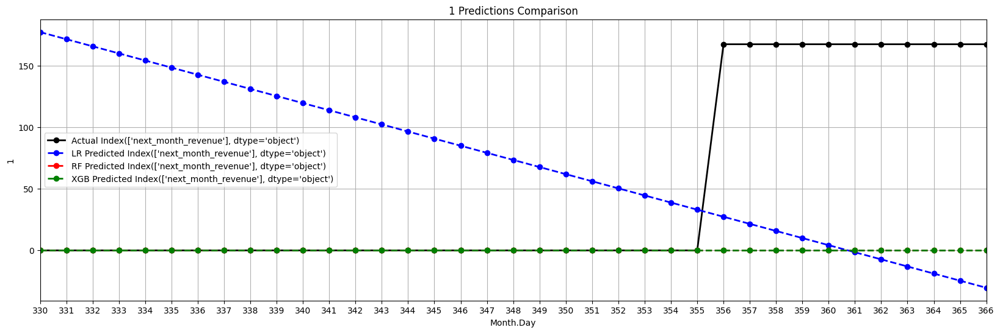

6 - Dataframe df_ts_netherlands data:


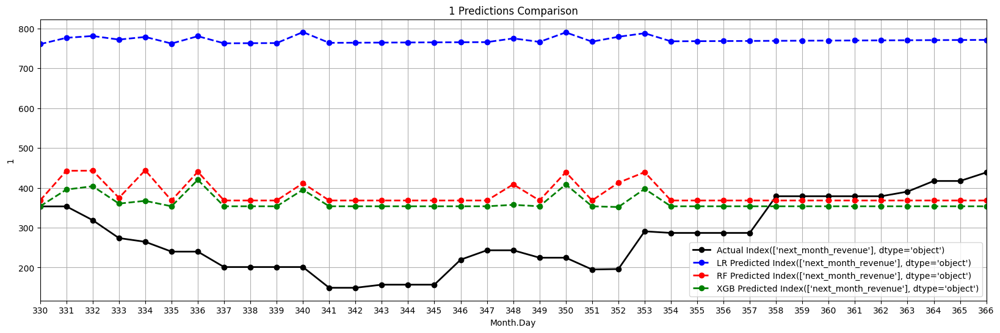

7 - Dataframe df_ts_norway data:


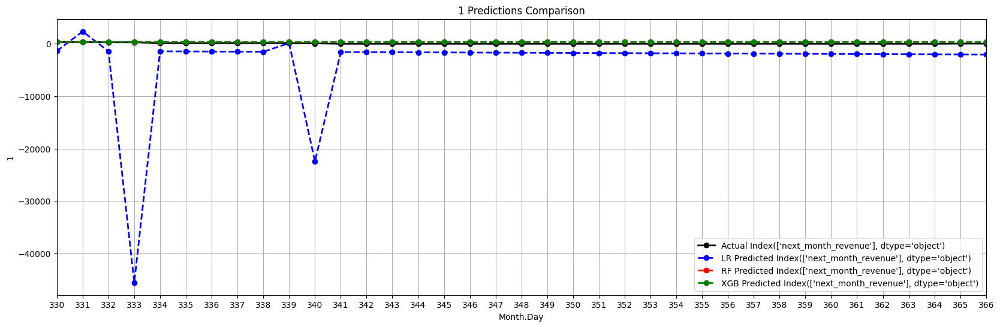

8 - Dataframe df_ts_portugal data:


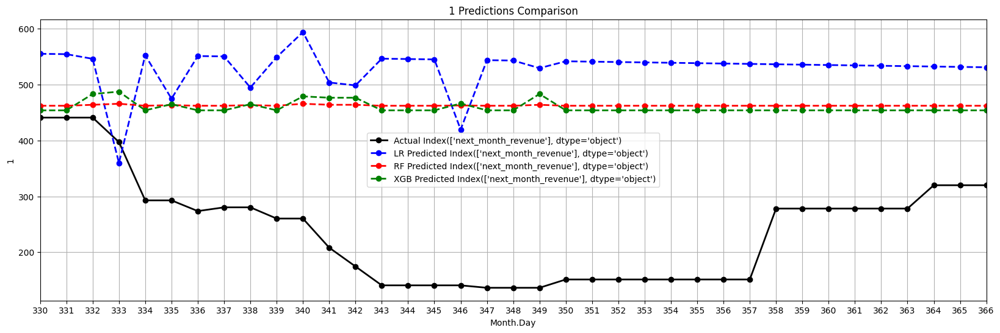

9 - Dataframe df_ts_singapore data:


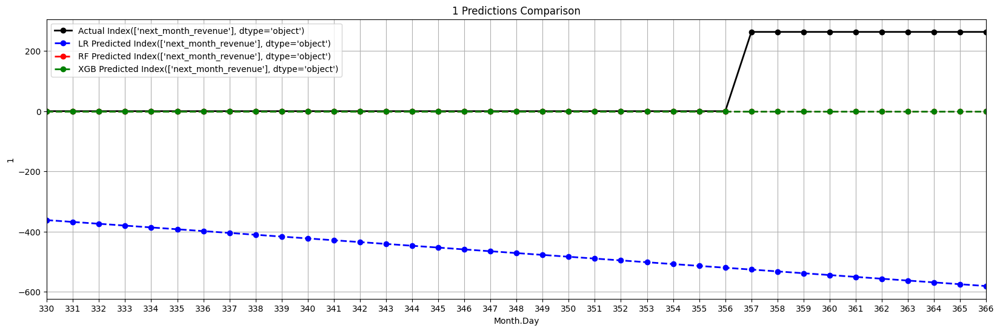

10 - Dataframe df_ts_spain data:


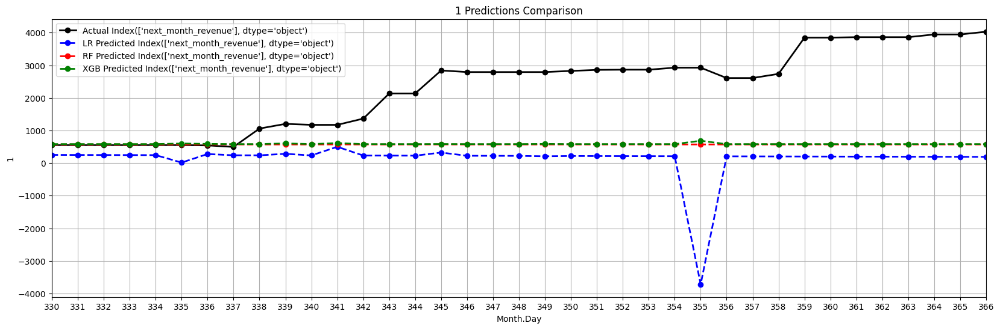

11 - Dataframe df_ts_united_kingdom data:


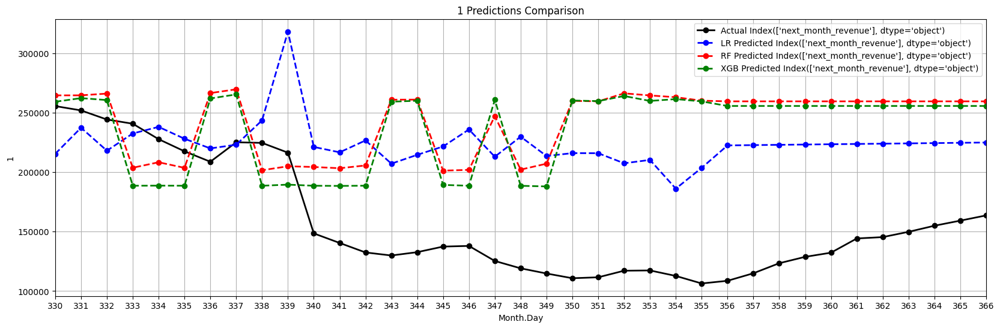

In [41]:
# Plot results for only day of year and next month revenue
for i in range (0,size):
    df_name = list_ts_df[i]
    print(i+1, '- Dataframe', df_name , 'data:')
    viz.plot_test_data(X_test[df_name]['day_of_year'], y_test[df_name], y_pred_lr[df_name], y_pred_rf[df_name], y_pred_xgb[df_name], 1)